# Vertical temperature anomaly structure

## 0. Set up

### 0.1 Import packages

In [6]:
# Import packages
import cmocean
import numpy as np
import xarray as xr
import pandas as pd
import cftime
import dask
import matplotlib.pyplot as plt
import os
import xesmf as xe
import pop_tools
import re
import pickle
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.ticker import LongitudeFormatter,LatitudeFormatter
from cartopy.util import add_cyclic_point
import matplotlib
import matplotlib.patches as mpatches
from matplotlib.patches import Rectangle
import matplotlib.dates as mdates
from matplotlib.animation import FuncAnimation
from IPython.display import HTML
from matplotlib.animation import FFMpegWriter as fw
from matplotlib.animation import PillowWriter as pw
import json 
from IPython.utils import io
from os.path import exists
from scipy.stats import gaussian_kde
import seaborn as sns
import netCDF4 as nc4
from collections import defaultdict

### 0.2 Functions

In [7]:
# Accessing glade CESM LENS2
def get_var_paths(directory, var):
    # Prefixes to match for future and historical datasets
    prefixes_to_match_fut = ['b.e21.BSSP370cmip6.', 'b.e21.BSSP370smbb.']
    prefixes_to_match_hist = ['b.e21.BHISTcmip6.', 'b.e21.BHISTsmbb.']

    # Sets to store unique prefixes for future and historical filenames
    prefixes_fut = list()
    prefixes_hist = list()

    # Iterate through files in the directory
    for filename in os.listdir(directory):
        # Check and add prefixes for future scenario files
        if any(filename.startswith(prefix) for prefix in prefixes_to_match_fut) and filename.endswith('.nc'):
            prefixes_fut.append(filename.rsplit('.', 3)[0])

        # Check and add prefixes for historical scenario files
        if any(filename.startswith(prefix) for prefix in prefixes_to_match_hist) and filename.endswith('.nc'):
            prefixes_hist.append(filename.rsplit('.', 3)[0])

    prefixes_hist_set = set(prefixes_hist)
    sorted_unique_list_hist = sorted(prefixes_hist_set)

    prefixes_fut_set = set(prefixes_fut)
    sorted_unique_list_fut = sorted(prefixes_fut_set)

    path_intermed_fut = sorted_unique_list_fut
    path_intermed_hist = sorted_unique_list_hist

    return path_intermed_hist, path_intermed_fut

def get_ds_var(directory, var, comp, index_hist):
    path_intermed_hist, path_intermed_fut = get_var_paths(directory, var)
    filename_identifier = '.'.join(path_intermed_hist[index_hist].rsplit('.', 5)[1:4])
    index_fut = find_identifier_with_index(path_intermed_hist, filename_identifier)[0][1]
    hist_file_paths = get_hist_file_paths(var,directory, path_intermed_hist, index_hist)
    fut_file_paths = get_fut_file_paths(var, directory, path_intermed_fut, index_fut)
    ds_var_fut = file_path_to_var_ds(fut_file_paths)
    ds_var_hist = file_path_to_var_ds(hist_file_paths)
    return ds_var_hist, ds_var_fut

def find_identifier_with_index(prefixes, identifier):
    """
    Find prefixes that contain a specific identifier and their indices.

    Parameters:
        prefixes (list): A list of prefixes to search through.
        identifier (str): The identifier to search for in the prefixes.

    Returns:
        list: A list of tuples containing matching prefixes and their indices.
    """
    matching_prefixes_with_indices = []  # Initialize a list to store matches and their indices

    for index, prefix in enumerate(prefixes):  # Use enumerate to get both index and prefix
        if identifier in prefix:  # Check if the identifier is in the prefix
            matching_prefixes_with_indices.append((prefix, index))  # Add the prefix and index as a tuple

    return matching_prefixes_with_indices  # Return the list of matching prefixes and indices
def get_hist_file_paths(var, directory, path_intermed_hist, index):
    attrib_title = path_intermed_hist[index]
    file_paths = []
    for start_year in range(1850, 2010, 10):
        end_year = start_year + 9
        file_path = f'{directory}{attrib_title}.{var}.{start_year}01-{end_year}12.nc'
        file_paths.append(file_path)
    last_file_path = f'{directory}{attrib_title}.{var}.201001-201412.nc'
    file_paths.append(last_file_path)
    return file_paths

def get_fut_file_paths(var, directory, path_intermed_fut, index):
    attrib_title = path_intermed_fut[index]
    file_paths = []
    for start_year in range(2015, 2095, 10):
        end_year = start_year + 9
        file_path = f'{directory}{attrib_title}.{var}.{start_year}01-{end_year}12.nc'
        file_paths.append(file_path)
    last_file_path = f'{directory}{attrib_title}.{var}.209501-210012.nc'
    file_paths.append(last_file_path)
    return file_paths

def file_path_to_var_ds(file_paths):
    var_ds = xr.open_mfdataset(file_paths,
                                 concat_dim='time',
                                 combine='nested',
                                 parallel=True)
    return var_ds

In [8]:
def calculate_anomalies_trend_features_4d(ds):
    """
    Calculate anomalies, trends, and features for 4D data (time × z_t × lat × lon)
    
    Parameters:
    ds : xarray.DataArray
        Input data with dimensions (time, z_t, lat, lon)
        
    Returns:
    mean, trend, seas, features_notrend, ssta_notrend
        All outputs will preserve z_t dimension
    """
    # Ensure we have all required dimensions
    if 'z_t' not in ds.dims:
        raise ValueError("Input data must have 'z_t' dimension")
    
    # Convert time to decimal years for harmonic analysis
    dyr = ds.time.dt.year + ds.time.dt.month/12
    
    # Create the 6-coefficient model matrix
    model = np.array([
        np.ones(len(dyr)),
        dyr - np.mean(dyr),
        np.sin(2*np.pi*dyr),
        np.cos(2*np.pi*dyr),
        np.sin(4*np.pi*dyr),
        np.cos(4*np.pi*dyr)
    ])
    
    # Pseudo-inverse for least squares solution
    pmodel = np.linalg.pinv(model)
    
    # Convert to DataArrays
    model_da = xr.DataArray(
        model.T,
        dims=['time', 'coeff'],
        coords={'time': ds.time, 'coeff': np.arange(1, 7)}
    )
    
    pmodel_da = xr.DataArray(
        pmodel.T,
        dims=['coeff', 'time'],
        coords={'coeff': np.arange(1, 7), 'time': ds.time}
    )
    
    # Calculate coefficients for each depth level
    # Note: This is the key 4D modification - we now dot product with 4D data
    coeffs = xr.dot(pmodel_da, ds)  # Result has dims (coeff, z_t, lat, lon)
    
    # Construct components (now includes z_t)
    mean = model_da[:, 0].dot(coeffs.sel(coeff=1))  # dims: (z_t, lat, lon)
    trend = model_da[:, 1].dot(coeffs.sel(coeff=2))  # dims: (z_t, lat, lon)
    seas = model_da[:, 2:].dot(coeffs.sel(coeff=slice(3, 6)))  # dims: (time, z_t, lat, lon)
    
    # Compute full model prediction and anomalies
    full_model = model_da.dot(coeffs)  # dims: (time, z_t, lat, lon)
    ssta_notrend = ds - full_model
    
    # Handle chunking if data is dask array
    if ssta_notrend.chunks:
        ssta_notrend = ssta_notrend.chunk({'time': -1, 'z_t': -1})
    
    # Calculate 90th percentile threshold for each depth level
    threshold = ssta_notrend.quantile(0.9, dim=('time'))  # dims: (z_t, lat, lon)
    
    # Find features exceeding threshold
    features_notrend = ssta_notrend.where(ssta_notrend >= threshold)
    
    return mean, trend, seas, features_notrend, ssta_notrend

In [9]:
def regrid_SMYLE(ds, glat=1, glon=1): # from Jacob's notebook
    """
    Inputs:
        ds: xr.DataArray with coordinates that include TLAT and TLONG
    Returns:
        Regridded xr.DataArray with coordinates lat and lon
    """
    ds = ds.rename(({'TLONG': 'lon', 'TLAT': 'lat'}))
    ds_out = xe.util.grid_global(glon, glat)
    regridder = xe.Regridder(ds, ds_out, 'bilinear', periodic=True)
    regridded = regridder(ds)
    new_coords = regridded.assign_coords({'y': regridded.lat[:, 0].values, 'x': regridded.lon[0].values})
    return new_coords.drop_vars(['lat', 'lon']).rename({'x': 'lon', 'y': 'lat'})

In [10]:
def calc_vertical_temp_mld_structure(anomalies, blobs_nan, smaller_region_mld):
    anomalies_depth = []
    mld_depth = []
    for i in [-3, -2, -1]:
        time_index = 0
        tmin1_anomalies = anomalies.shift(time=i).sel(time=blobs_nan.time[time_index].item())* blobs_nan[0]
        anomalies_in_region_nan = xr.where(tmin1_anomalies == 0., np.nan, tmin1_anomalies)
        anomalies_depth.append(anomalies_in_region_nan.mean(dim=('lat','lon')))
        
        mld_sel = smaller_region_mld.shift(time=i).sel(time=blobs_nan.time[time_index].item())* blobs_nan[0]
        mld_val = xr.where(mld_sel == 0., np.nan, mld_sel).mean()/100
        mld_depth.append(mld_val.item())
        
    for time_index in range(len(true_time_steps)):
        anomalies_in_region = anomalies.sel(time=blobs_nan.time[time_index].item()) * blobs_nan[time_index]
        anomalies_in_region_nan = xr.where(anomalies_in_region == 0., np.nan, anomalies_in_region)
        anomalies_depth.append(anomalies_in_region_nan.mean(dim=('lat','lon')))
        mld_sel = smaller_region_mld.shift(time=i).sel(time=blobs_nan.time[time_index].item())* blobs_nan[time_index]
        mld_val = xr.where(mld_sel == 0., np.nan, mld_sel).mean()/100
        mld_depth.append(mld_val.item())
        
    for i in [1, 2, 3]:
        time_index = len(blobs_nan.time)-1
        tmin1_anomalies = anomalies.shift(time=i).sel(time=blobs_nan.time[time_index].item())* blobs_nan[time_index]
        anomalies_in_region_nan = xr.where(tmin1_anomalies == 0., np.nan, tmin1_anomalies)
        anomalies_depth.append(anomalies_in_region_nan.mean(dim=('lat','lon')))
        mld_sel = smaller_region_mld.shift(time=i).sel(time=blobs_nan.time[time_index].item())* blobs_nan[time_index]
        mld_val = xr.where(mld_sel == 0., np.nan, mld_sel).mean()/100
        mld_depth.append(mld_val.item())

    temp_anomalies = xr.concat(anomalies_depth, dim='time_ind')

    pre_phase = temp_anomalies.isel(
        time_ind=slice(0, 3)).mean(dim='time_ind')
    
    post_phase = temp_anomalies.sel(
        time_ind=slice(-4, -1)).mean(dim='time_ind')
    if len(temp_anomalies.time_ind.data) == 7:
        mid_phase = temp_anomalies.isel(
             time_ind=3)#.mean(dim='time_ind')
    else: 
        mid_phase = temp_anomalies.sel(
            time_ind=slice(3, -4)).mean(dim='time_ind')
    
    # mid_phase = temp_anomalies.sel(
    #     time_ind=slice(3, -4)).mean(dim='time_ind')
    
    combined = xr.concat(
        [pre_phase, mid_phase, post_phase], 
        dim=xr.DataArray(["pre", "mid", "post"], 
                         dims="phase"))
    
    new_combined = combined[:,:].transpose()
    new_combined["z_t"] = new_combined["z_t"] / 100
    new_combined["z_t"].attrs["units"] = "m"


    mld_depth_array = np.array(mld_depth)
    pre_phase_mld = mld_depth_array[0:3].mean()
    post_phase_mld = mld_depth_array[-4:-1].mean()
    
    if len(temp_anomalies.time_ind.data) == 7:
        mid_mld = mld_depth_array[3]
    else: 
        mid_mld = mld_depth_array[3: -4].mean()
    mld_combined = [pre_phase_mld, mid_mld, post_phase_mld]

    return temp_anomalies, new_combined, mld_combined

### 0.3 Load data

In [6]:
# region_masks_of_MHWS (on regular atm grid and POP grid)
# POP grid
mean_image_pop_files = [f'/glade/derecho/scratch/cassiacai/mean_image_{i}_POP.nc' for i in range(1, 8)]
mean_images_pop = [xr.open_dataset(file) for file in mean_image_pop_files]
masks_pop = [xr.where(image.__xarray_dataarray_variable__ > 0.1, 1, 0) for image in mean_images_pop]
NEPac_mask = masks_pop[2].isel(nlat=slice(200,350), nlon=slice(170, 251))

In [7]:
filepaths = [f'/glade/u/home/cmendiola/mhw_project/data/ens_{i}_ssta_notrend.nc' for i in range(100)]
da_ssta = xr.open_mfdataset(filepaths, combine='nested', concat_dim='ensemble_member')

filepaths = [f'/glade/u/home/cmendiola/mhw_project/data/ens_{i}_mhwobj_rad3.nc' for i in range(100)]
da_mhwobj = xr.open_mfdataset(filepaths, combine='nested', concat_dim='ensemble_member')
da_mhwobj_labels = da_mhwobj.labels.compute()

mask_3 = xr.open_dataset('mean_mask_3.nc').mhw_obj

blob_like_ids = json.load(open('object_id_ls_greenmask.json'))

FileNotFoundError: [Errno 2] No such file or directory: '/glade/u/home/cmendiola/mhw_project/data/ens_0_ssta_notrend.nc'

In [6]:
var = 'TEMP'
comp = 'ocn'
directory = f'/glade/campaign/cgd/cesm/CESM2-LE/{comp}/proc/tseries/month_1/{var}/'

In [18]:
file_list = [
    'blob_analog_events.nc',
    'blob_analog_events_10_20.nc',
    'blob_analog_events_20_30.nc',
    'blob_analog_events_30_60.nc',
    'blob_analog_events_60_100.nc'
]

all_datasets = []

for file in file_list:
    # Get group names for this file
    with nc4.Dataset(file) as f:
        group_names = list(f.groups.keys())
    
    for group in group_names:
        ds = xr.open_dataset(file, group=group)
        all_datasets.append(ds)

# Concatenate all datasets along the event dimension
all_events = xr.concat(all_datasets, dim='event')

# Get durations
length_of_events = []
for i in range(385):
    length_of_events.append(all_events.__xarray_dataarray_variable__[i,:,:].dropna(dim='time').time.shape[0])
print(np.asarray(length_of_events)[np.asarray(length_of_events)>9])

plt.figure(figsize=(6, 3), constrained_layout=True)
plt.hist(length_of_events, bins=np.arange(10, 28,1))
plt.xlim(9, 28)
plt.show()

In [ ]:
event = xr.open_dataset('blob_analog_events.nc')

In [ ]:
plt.figure(figsize=(4, 2), constrained_layout=True)
event.__xarray_dataarray_variable__.plot.contourf(vmin=-0.5, vmax=0.5, levels=11, cmap=cmocean.cm.balance)
ax.invert_yaxis()
plt.show()

In [ ]:
%%time
ens_memb_index = 0
ds_var_hist_TEMP, ds_var_fut_TEMP = get_ds_var(directory, 'TEMP',comp, ens_memb_index) 
CESMLENS_TEMP_hist_time_slice = ds_var_hist_TEMP.TEMP.isel(z_t=slice(0, 28)).sel(time=slice('1979-01-01', '2015-01-01')).isel(nlat=slice(200,350), nlon=slice(170, 251))
CESMLENS_TEMP_fut_time_slice = ds_var_fut_TEMP.TEMP.isel(z_t=slice(0, 28)).sel(time=slice('2015-02-01', '2020-12-01')).isel(nlat=slice(200,350), nlon=slice(170, 251))
CESMLENS_TEMP_ds = xr.concat([CESMLENS_TEMP_hist_time_slice, CESMLENS_TEMP_fut_time_slice], dim='time')

CESMLENS_TEMP_ds_computed = CESMLENS_TEMP_ds.compute()
mean, trend, seas, features, anomalies = calculate_anomalies_trend_features_4d(CESMLENS_TEMP_ds_computed)

indices = blob_like_ids[4][ens_memb_index]

onlyone_in = da_mhwobj_labels[0].where(da_mhwobj_labels[0].isin(indices), False)

times_with_blob_analog = onlyone_in.max(dim=('lat','lon'))
times_with_blob_analog_only = xr.where(times_with_blob_analog > 0., 1., np.nan)

# --- Blob Analog Shading ---
blob_indices = np.where(times_with_blob_analog_only == 1)[0]

# if len(blob_indices) > 0:
time_values = anomalies.time[blob_indices]

 # Find consecutive periods
breaks = np.where(np.diff(blob_indices) > 1)[0] + 1
groups = np.split(blob_indices, breaks)
vertical_structure_event = []
for group in groups:
    if len(group) > 0:
        # Extract exact start/end times
        start = anomalies.time[group[0]-4].item()
        start_real = anomalies.time[group[0]].item()
        print(start)
        print(start_real)
        end = anomalies.time[group[-1]+4].item()
        end_real = anomalies.time[group[-1]].item()
        print(end)
        print(end_real)
    print('')
    one_event_with_prior = anomalies.mean(dim=('nlat','nlon')).isel(z_t=slice(0,25)).sel(time=slice(start,end)).transpose()
    vertical_structure_event.append(one_event_with_prior)

In [39]:
ens_memb_index = 1

In [12]:
var = 'TEMP'
comp = 'ocn'
directory = f'/glade/campaign/cgd/cesm/CESM2-LE/{comp}/proc/tseries/month_1/{var}/'

In [41]:
ds_var_hist_TEMP, ds_var_fut_TEMP = get_ds_var(directory, 'TEMP', comp, ens_memb_index) 
CESMLENS_TEMP_hist_time_slice = ds_var_hist_TEMP.TEMP.isel(z_t=slice(0, 28)).sel(time=slice('1979-01-01', '2015-01-01')).isel(nlat=slice(200,350), nlon=slice(170, 251))
CESMLENS_TEMP_fut_time_slice = ds_var_fut_TEMP.TEMP.isel(z_t=slice(0, 28)).sel(time=slice('2015-02-01', '2020-12-01')).isel(nlat=slice(200,350), nlon=slice(170, 251))
CESMLENS_TEMP_ds = xr.concat([CESMLENS_TEMP_hist_time_slice, CESMLENS_TEMP_fut_time_slice], dim='time')

In [42]:
CESMLENS_TEMP_ds_computed = CESMLENS_TEMP_ds.compute()

In [44]:
mean, trend, seas, features, anomalies = calculate_anomalies_trend_features_4d(CESMLENS_TEMP_ds_computed)

/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


In [10]:
blob_like_ids = json.load(open('object_id_ls_greenmask.json'))

In [195]:
indices = 75. #blob_like_ids[4][ens_memb_index]
onlyone_in = da_mhwobj_labels[1].where(da_mhwobj_labels[1].isin(indices), False)
times_with_blob_analog = onlyone_in.max(dim=('lat','lon'))
times_with_blob_analog_only = xr.where(times_with_blob_analog > 0., 1., np.nan)

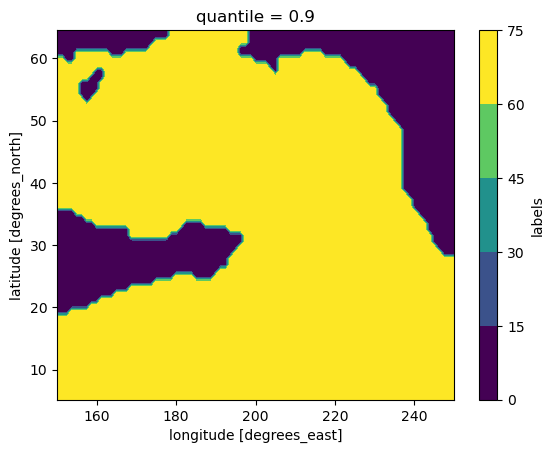

In [196]:
onlyone_in.max(dim='time').plot.contourf()

In [86]:
specific_ssta = da_ssta.__xarray_dataarray_variable__.sel(
    ensemble_member = 1, 
    time=slice(times_with_blob_analog_only.dropna(dim='time').time[0], times_with_blob_analog_only.dropna(dim='time').time[-1])).compute()
specific_mhwobj = da_mhwobj_labels.sel(
    ensemble_member = 1, 
    time=slice(times_with_blob_analog_only.dropna(dim='time').time[0], times_with_blob_analog_only.dropna(dim='time').time[-1])).compute()

specific_ssta[0,:,:].plot.contourf(vmin=-1.5, vmax=1.5, levels=31, cmap=cmocean.cm.balance); plt.show()
specific_ssta[1,:,:].plot.contourf(vmin=-1.5, vmax=1.5, levels=31, cmap=cmocean.cm.balance); plt.show()

specific_mhwobj[0,:,:].plot.contourf()
mask_3.plot.contour(c='k'); plt.show()
specific_mhwobj[1,:,:].plot.contourf()
mask_3.plot.contour(c='k'); plt.show()


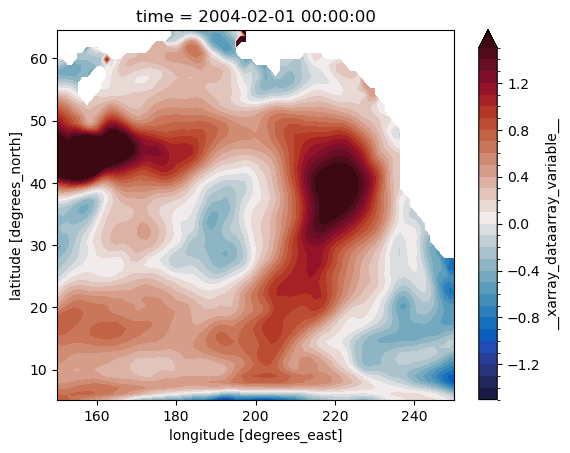

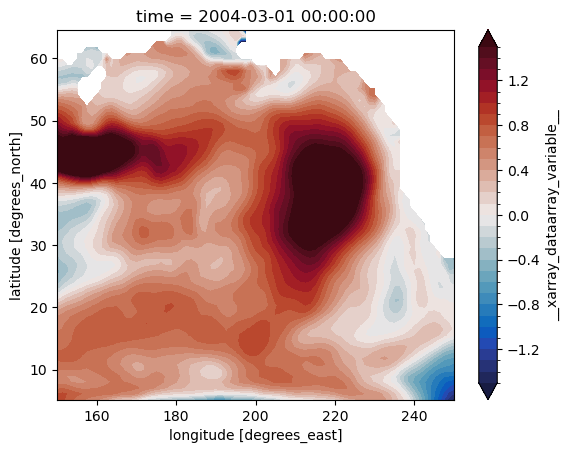

/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/xarray/plot/dataarray_plot.py:2007: UserWarning: The following kwargs were not used by contour: 'c'
  primitive = ax.contour(x, y, z, **kwargs)


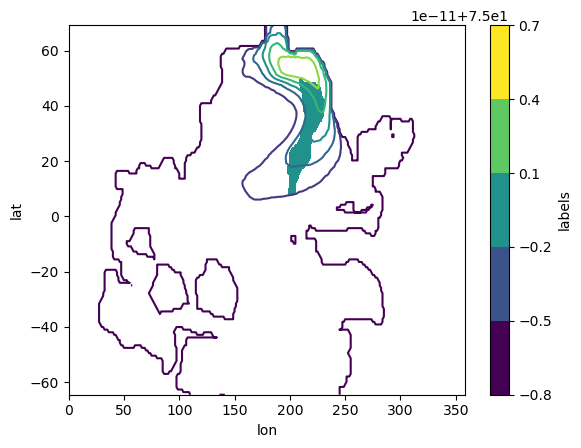

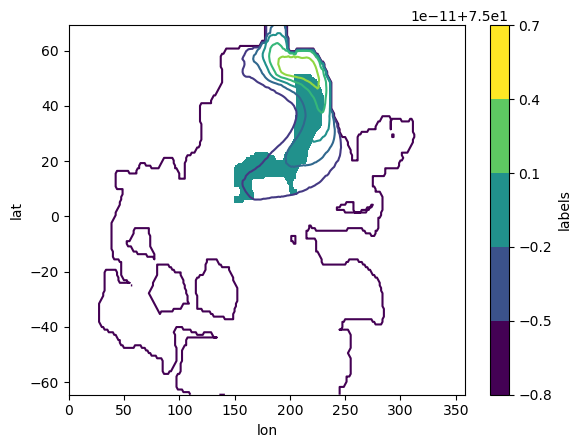

In [89]:
specific_ssta[0,:,:].plot.contourf(vmin=-1.5, vmax=1.5, levels=31, cmap=cmocean.cm.balance); plt.show()
specific_ssta[1,:,:].plot.contourf(vmin=-1.5, vmax=1.5, levels=31, cmap=cmocean.cm.balance); plt.show()

specific_mhwobj[0,:,:].plot.contourf()
mask_3.plot.contour(c='k'); plt.show()
specific_mhwobj[1,:,:].plot.contourf()
mask_3.plot.contour(c='k'); plt.show()

In [48]:
indices = 75. #blob_like_ids[4][ens_memb_index]
onlyone_in = da_mhwobj_labels[0].where(da_mhwobj_labels[0].isin(indices), False)
times_with_blob_analog = onlyone_in.max(dim=('lat','lon'))
times_with_blob_analog_only = xr.where(times_with_blob_analog > 0., 1., np.nan)
        
blob_indices = np.where(times_with_blob_analog_only == 1)[0]
blob_indices = blob_indices[blob_indices < len(anomalies.time)]  # Filter out indices that are too large
        
if len(blob_indices) == 0:
    print(f"No valid blob events found for member {ens_memb_index}")
    # vertical_structure_event_full.append([])
            
breaks = np.where(np.diff(blob_indices) > 1)[0] + 1
groups = np.split(blob_indices, breaks)
        
vertical_structure_event = []
for group in groups:
    if len(group) == 0:
                
        # Calculate time bounds with boundary checks
        start_idx = max(0, group[0]-4)
        start = anomalies.time[start_idx].item()
        start_real = anomalies.time[group[0]].item()
                
        end_idx = min(len(anomalies.time)-1, group[-1]+4)
        end = anomalies.time[end_idx].item()
        end_real = anomalies.time[group[-1]].item()
                
        print(f"Event found: {start_real} to {end_real} (extended: {start} to {end})")
                
        one_event_with_prior = anomalies.mean(dim=('nlat','nlon')).isel(z_t=slice(0,25)).sel(time=slice(start,end)).transpose()
        vertical_structure_event.append(one_event_with_prior)
            


## ANALYSIS

In [10]:
file_list = [
    'blob_analog_events.nc',
    'blob_analog_events_10_20.nc',
    'blob_analog_events_20_30.nc',
    'blob_analog_events_30_60.nc',
    'blob_analog_events_60_100.nc'
]

all_events_list = []

for file in file_list:
    if '30_60' in file:
        offset = 30
    elif '60_100' in file:
        offset = 60
    elif '10_20' in file:
        offset = 10
    elif '20_30' in file:
        offset = 20
    else:  # for blob_analog_events.nc
        offset = 0
    
    event_indices = []
    all_datasets = []
    
    with nc4.Dataset(file) as f:
        group_names = list(f.groups.keys())
    
    for group in group_names:
        match = re.match(r'ens_(\d+)_event_(\d+)', group)
        if match:
            ens_idx = int(match.group(1))
            event_idx = int(match.group(2))
            event_indices.append((ens_idx, event_idx))
            
            ds = xr.open_dataset(file, group=group)
            all_datasets.append(ds)
    
    if all_datasets:
        events = xr.concat(all_datasets, dim='event')
        events = events.assign_coords(
            ens_idx=('event', [x[0] + offset for x in event_indices]),
            event_idx=('event', [x[1] for x in event_indices])
        )
        all_events_list.append(events)

if all_events_list:
    final_events = xr.concat(all_events_list, dim='event')
else:
    final_events = None

In [ ]:
all_events = final_events

# Initialize lists to store ALL phases AND indices
all_pre = []
all_mid1 = []
all_mid2 = []
all_post = []
all_ens_idx = []  # To store ensemble indices
all_event_idx = []  # To store event indices

# Loop through each event
for event_id in range(385):
    # Extract one event's data along time and z_t (or lat/lon)
    event_data = all_events.isel(event=event_id).dropna(dim='time')

    # Extract ensemble and event indices from variables
    ens_idx = all_events['ens_idx'].isel(event=event_id).item()
    original_event_idx = all_events['event_idx'].isel(event=event_id).item()

    # Normalize time axis
    new_time = np.linspace(0, 11, num=event_data.sizes['time'])
    event_normalized = event_data.assign_coords(time=new_time)

    # Split into 4 equal phases and average within each
    n_steps = event_normalized.sizes['time']
    pre = event_normalized.isel(time=slice(0, n_steps // 4)).mean(dim='time')
    mid1 = event_normalized.isel(time=slice(n_steps // 4, n_steps // 2)).mean(dim='time')
    mid2 = event_normalized.isel(time=slice(n_steps // 2, 3 * n_steps // 4)).mean(dim='time')
    post = event_normalized.isel(time=slice(3 * n_steps // 4, None)).mean(dim='time')

    # Append data AND indices
    all_pre.append(pre)
    all_mid1.append(mid1)
    all_mid2.append(mid2)
    all_post.append(post)
    all_ens_idx.append(ens_idx)
    all_event_idx.append(original_event_idx)

# Combine phases into one DataArray with phase and event dimensions
combined = xr.concat(
    [
        xr.concat(all_pre, dim="event"),
        xr.concat(all_mid1, dim="event"),
        xr.concat(all_mid2, dim="event"),
        xr.concat(all_post, dim="event"),
    ],
    dim=xr.DataArray(["pre", "mid1", "mid2", "post"], dims="phase")
).assign_coords(
    ens_idx=("event", all_ens_idx),
    original_event_idx=("event", all_event_idx)
)

In [20]:
event_max_var = combined['__xarray_dataarray_variable__'].max(dim='phase')

# Now get the index of the max value along the z_t dimension
max_depths = event_max_var.argmax(dim='z_t')
z_t_meters = combined.z_t
max_z_t = z_t_meters[max_depths]

# Bin by depth
depth_bins = [0, 5000, 15000, np.inf]
depth_labels = ["surface", "mid", "deep"]

depth_category = xr.DataArray(
    pd.cut(max_z_t, bins=depth_bins, labels=depth_labels),
    dims=["event"],
    name="depth_category"
)

# Group by depth category
grouped = combined.groupby(depth_category)

# Example: print out grouped indices
for name, group in grouped:
    print(f"\nGroup: {name}")
    print("Ensemble indices:", group.ens_idx.values)
    print("Event indices:", group.original_event_idx.values)


Group: deep
Ensemble indices: [ 1  4  5  5  9  9 10 12 12 13 16 17 20 25 26 27 27 28 28 36 36 37 37 38
 38 43 43 43 47 47 48 48 51 54 55 56 64 66 66 72 72 73 73 74 77 81 83 84
 86 86 87 90 96 97]
Event indices: [1 1 0 2 0 2 1 0 1 0 2 2 1 0 0 0 3 1 5 0 1 0 1 1 3 1 2 5 1 3 1 2 1 1 1 1 2
 0 1 1 2 1 2 4 0 1 2 2 2 4 1 3 1 0]

Group: mid
Ensemble indices: [ 0  0  0  1  2  2  2  2  2  3  3  4  4  4  6  7  7  8  8  9 10 11 12 14
 14 15 15 16 17 17 18 19 20 20 21 21 21 21 22 22 22 23 23 24 25 25 25 26
 26 26 27 28 28 28 29 30 31 32 32 32 32 33 33 34 35 36 37 38 39 40 41 41
 42 43 44 44 45 45 46 47 47 49 49 50 51 51 52 52 53 53 54 55 55 56 57 57
 58 58 59 59 60 60 61 61 63 64 64 66 66 66 67 67 67 67 67 68 69 69 70 70
 71 72 73 73 74 74 75 76 76 77 77 78 78 78 78 78 79 79 79 80 80 81 81 81
 82 82 83 84 84 84 85 85 85 86 88 88 88 89 90 90 91 91 92 92 92 92 93 93
 93 93 94 94 94 95 95 96 96 98 98 99 99 99]
Event indices: [0 1 2 0 0 1 2 4 5 0 1 0 2 4 0 0 2 1 2 1 2 0 3 1 2 2 3 1 1 3 2 0 2 3 0 1 2
 3

In [24]:
surface_ds = grouped["surface"].__xarray_dataarray_variable__
mid_ds = grouped["mid"].__xarray_dataarray_variable__
deep_ds = grouped["deep"].__xarray_dataarray_variable__

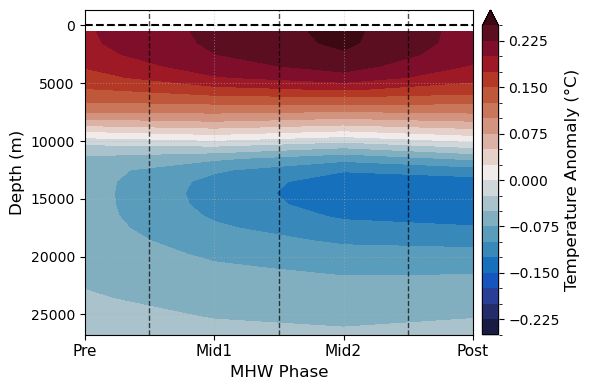

In [33]:
new_combined = surface_ds.mean(dim='event')

if new_combined["z_t"].units == "cm":  # Check your actual units
    new_combined["z_t"] = combined["z_t"] / 100
    new_combined["z_t"].attrs["units"] = "m"

fig, ax = plt.subplots(figsize=(6, 4))

# Contour plot with reversed y-axis
contour = new_combined.transpose().plot.contourf(
    ax=ax,
    yincrease=False,                # Depth increases downward
    cmap=cmocean.cm.balance,                  # Red-Blue diverging colormap
    robust=True,                    # Ignore outliers in color scaling
    levels=21, 
    vmin=-0.25, vmax=0.25,
    add_colorbar=False              # We'll add it manually later
)

# Add vertical lines between phases
ax.axvline(0.5, color='black', linestyle='--', linewidth=1, alpha=0.7)  # pre|mid1
ax.axvline(1.5, color='black', linestyle='--', linewidth=1, alpha=0.7)  # mid1|mid2
ax.axvline(2.5, color='black', linestyle='--', linewidth=1, alpha=0.7)  # mid2|post

# Customize colorbar
cbar = plt.colorbar(contour, ax=ax, pad=0.02)
cbar.set_label("Temperature Anomaly (°C)", fontsize=12)

# Labels and title
ax.set_xlabel("MHW Phase", fontsize=12)
ax.set_ylabel("Depth (m)", fontsize=12)
ax.set_xticks([0, 1, 2, 3])
ax.set_xticklabels(["Pre", "Mid1", "Mid2", "Post"], fontsize=11)
ax.grid(True, linestyle=':', alpha=0.5)
plt.axhline(y=0, c='k', linestyle='dashed')

# plt.title("Marine Heatwave Vertical Structure", fontsize=14, pad=20)
plt.tight_layout()
plt.show()

In [6]:
mean_image_pop_files = [f'/glade/derecho/scratch/cassiacai/mean_image_{i}_POP.nc' for i in range(1, 8)]
mean_images_pop = [xr.open_dataset(file) for file in mean_image_pop_files]
masks_pop = [xr.where(image.__xarray_dataarray_variable__ > 0.1, 1, 0) for image in mean_images_pop]
NEPac_mask = masks_pop[2].isel(nlat=slice(200,350), nlon=slice(170, 251))

var = 'TEMP'
comp = 'ocn'
directory = f'/glade/campaign/cgd/cesm/CESM2-LE/{comp}/proc/tseries/month_1/{var}/'

In [7]:
NEPac_mask = masks_pop[2].isel(nlat=slice(200,350), nlon=slice(170, 251))

In [257]:
vertical_structure_event_full = []
for ens_memb_index in range(2):
    print(ens_memb_index)
    ds_var_hist_TEMP, ds_var_fut_TEMP = get_ds_var(directory, 'TEMP', comp, ens_memb_index) 
    CESMLENS_TEMP_hist_time_slice = ds_var_hist_TEMP.TEMP.isel(z_t=slice(0, 28)).sel(time=slice('1979-01-01', '2015-01-01')).isel(nlat=slice(200,350), nlon=slice(170, 251))
    CESMLENS_TEMP_fut_time_slice = ds_var_fut_TEMP.TEMP.isel(z_t=slice(0, 28)).sel(time=slice('2015-02-01', '2020-12-01')).isel(nlat=slice(200,350), nlon=slice(170, 251))
    CESMLENS_TEMP_ds = xr.concat([CESMLENS_TEMP_hist_time_slice, CESMLENS_TEMP_fut_time_slice], dim='time')
            
    CESMLENS_TEMP_ds_computed = CESMLENS_TEMP_ds.compute()
    mean, trend, seas, features, anomalies = calculate_anomalies_trend_features_4d(CESMLENS_TEMP_ds_computed)

    ##### 
    indices = blob_like_ids[4][ens_memb_index]
    onlyone_in = da_mhwobj_labels[ens_memb_index].where(da_mhwobj_labels[ens_memb_index].isin(indices), False)
    times_with_blob_analog = onlyone_in.max(dim=('lat','lon'))
    times_with_blob_analog_only = xr.where(times_with_blob_analog > 0., 1., np.nan)

    labels = times_with_blob_analog
    unique_labels = np.unique(labels.where(labels > 0, drop=True))
    
    events = []
    for label in unique_labels:
        label_indices = np.where(labels == label)[0]
        
        first_time_extended = xr.where(da_mhwobj_labels[1] == label, 1., np.nan).max(dim=('lat','lon')).dropna(dim='time').time[0] - xr.coding.cftime_offsets.to_offset("3MS")
        last_time_extended = xr.where(da_mhwobj_labels[1] == label, 1., np.nan).max(dim=('lat','lon')).dropna(dim='time').time[-1] + xr.coding.cftime_offsets.to_offset("3MS")
        
        for group in groups:
            if len(group) > 0:
                events.append({
                    'label': float(label),
                    'first_index': group[0],
                    'last_index': group[-1],
                    'first_time-3': first_time_extended,
                    'last_time+3': last_time_extended,
                })
    
    events.sort(key=lambda x: x['first_index'])

    vertical_structure_event = []
    for event in events:
        extended_start = event['first_time-3']
        extended_end = event['last_time+3']
        try:
            
            masked_anomalies = anomalies * NEPac_mask
            one_event_with_prior = (anomalies.mean(dim=('nlat','nlon'))
                                  .isel(z_t=slice(0,25))
                                  .sel(time=slice(extended_start, extended_end))
                                  .transpose())
            vertical_structure_event.append({
                'label': event['label'],
                'data': one_event_with_prior,
                'extended_period': (start, end)
            })
            
        except Exception as e:
            print(f"Error processing event {event['label']}: {str(e)}")
            continue
    vertical_structure_event_full.append(vertical_structure_event)

0


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


1


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


In [10]:
blob_like_ids = json.load(open('object_id_ls_greenmask.json'))

In [36]:
indices = blob_like_ids[4][ens_memb_index]
onlyone_in = da_mhwobj_labels[ens_memb_index].where(da_mhwobj_labels[ens_memb_index].isin(indices), False)
times_with_blob_analog = onlyone_in.max(dim=('lat','lon'))
times_with_blob_analog_only = xr.where(times_with_blob_analog > 0., 1., np.nan)

labels = times_with_blob_analog
unique_labels = np.unique(labels.where(labels > 0, drop=True))

events = []
for label in unique_labels:
    label_indices = np.where(labels == label)[0]
    print(label_indices)
            
    if len(label_indices) == 0:
        continue
    first_time = labels.time[label_indices[0]].values.item()
    last_time = labels.time[label_indices[-1]].values.item()
    print(first_time)
    print(last_time)

    first_time_extended = first_time - xr.coding.cftime_offsets.to_offset("3MS")
    last_time_extended = last_time + xr.coding.cftime_offsets.to_offset("3MS")

    # Convert comparison dates to CFTime
    min_time = CESMLENS_TEMP_ds.time[0].values.item()
    max_time = CESMLENS_TEMP_ds.time[-1].values.item()

    if (last_time_extended > max_time) and (first_time_extended < min_time):
        continue
    events.append({
                'label': float(label),
                'first_index': label_indices[0],
                'last_index': label_indices[-1],
                'first_time': first_time,
                'last_time': last_time,
                'first_time-3': first_time_extended,
                'last_time+3': last_time_extended,
                'duration': len(label_indices)
            })

    # Process each event
    vertical_structure_event = []
    for event in events:
        extended_start = event['first_time-3']
        extended_end = event['last_time+3']
                    
        masked_anomalies = anomalies * NEPac_mask
        one_event_with_prior = (masked_anomalies.mean(dim=('nlat','nlon'))
                                          .isel(z_t=slice(0,25))
                                          .sel(time=slice(extended_start, extended_end))
                                          .transpose())                
        vertical_structure_event.append({
                        'label': event['label'],
                        'data': one_event_with_prior,
                        'core_period': (event['first_time'], event['last_time']),
                        'extended_period': (extended_start, extended_end)
                    })
    vertical_structure_event_full.append(vertical_structure_event)


[149 150 151 152]
1991-06-01 00:00:00
1991-09-01 00:00:00
[185 186 187 190 191]
1994-06-01 00:00:00
1994-12-01 00:00:00
[188 189]
1994-09-01 00:00:00
1994-10-01 00:00:00
[220 221 222 223 224 225]
1997-05-01 00:00:00
1997-10-01 00:00:00
[291 292 293 294 295 296 297 298 299 300 301 302 303 304 305 306 307 308
 309 310]
2003-04-01 00:00:00
2004-11-01 00:00:00
[413 414 415 416 417 418 419]
2013-06-01 00:00:00
2013-12-01 00:00:00


In [ ]:
for ens_memb_index in range(85,100):
    print(f"Processing ensemble member {ens_memb_index}")
    
    ds_var_hist_TEMP, ds_var_fut_TEMP = get_ds_var(directory, 'TEMP', comp, ens_memb_index) 
    CESMLENS_TEMP_hist_time_slice = ds_var_hist_TEMP.TEMP.isel(z_t=slice(0, 28)).sel(time=slice('1979-01-01', '2015-01-01')).isel(nlat=slice(200,350), nlon=slice(170, 251))
    CESMLENS_TEMP_fut_time_slice = ds_var_fut_TEMP.TEMP.isel(z_t=slice(0, 28)).sel(time=slice('2015-02-01', '2020-12-01')).isel(nlat=slice(200,350), nlon=slice(170, 251))
    CESMLENS_TEMP_ds = xr.concat([CESMLENS_TEMP_hist_time_slice, CESMLENS_TEMP_fut_time_slice], dim='time')
        
    CESMLENS_TEMP_ds_computed = CESMLENS_TEMP_ds.compute()
    mean, trend, seas, features, anomalies = calculate_anomalies_trend_features_4d(CESMLENS_TEMP_ds_computed)

    indices = blob_like_ids[0][ens_memb_index]
    onlyone_in = da_mhwobj_labels[ens_memb_index].where(da_mhwobj_labels[ens_memb_index].isin(indices), False)
    times_with_blob_analog = onlyone_in.max(dim=('lat','lon'))
    times_with_blob_analog_only = xr.where(times_with_blob_analog > 0., 1., np.nan)
        
    labels = times_with_blob_analog
    unique_labels = np.unique(labels.where(labels > 0, drop=True))
        
    events = []
    for label in unique_labels:
        label_indices = np.where(labels == label)[0]
                    
        if len(label_indices) == 0:
            continue
        first_time = labels.time[label_indices[0]].values.item()
        last_time = labels.time[label_indices[-1]].values.item()

        first_time_extended = first_time - xr.coding.cftime_offsets.to_offset("3MS")
        last_time_extended = last_time + xr.coding.cftime_offsets.to_offset("3MS")
        
        # Convert comparison dates to CFTime
        min_time = CESMLENS_TEMP_ds.time[0].values.item()
        max_time = CESMLENS_TEMP_ds.time[-1].values.item()

        if (last_time_extended > max_time) and (first_time_extended < min_time):
            continue
    
        events.append({
                    'label': float(label),
                    'first_index': label_indices[0],
                    'last_index': label_indices[-1],
                    'first_time': first_time,
                    'last_time': last_time,
                    'first_time-3': first_time_extended,
                    'last_time+3': last_time_extended,
                    'duration': len(label_indices)
                })

    # Process each event
    vertical_structure_event = []
    for event in events:
        extended_start = event['first_time-3']
        extended_end = event['last_time+3']
                    
        masked_anomalies = anomalies * NEPac_mask
        one_event_with_prior = (masked_anomalies.mean(dim=('nlat','nlon'))
                                          .isel(z_t=slice(0,25))
                                          .sel(time=slice(extended_start, extended_end))
                                          .transpose())                
        vertical_structure_event.append({
                        'label': event['label'],
                        'data': one_event_with_prior,
                        'core_period': (event['first_time'], event['last_time']),
                        'extended_period': (extended_start, extended_end)
                    })
        
    data_list = vertical_structure_event
    
    # Create a Dataset containing ALL events
    events = []
    labels = []
    core_periods = []
    extended_periods = []
    
    for item in data_list:
        events.append(item['data'])
        labels.append(item['label'])
        core_periods.append(str(item['core_period']))
        extended_periods.append(str(item['extended_period']))
    
    # Combine into one Dataset with a new dimension 'event'
    ds = xr.Dataset({
        'data': xr.concat(events, dim='event'),  # Stack all data arrays
        'label': ('event', labels)               # Store labels as coordinate
    })
    
    # Add attributes for each event
    ds['event'] = range(len(data_list))  # Add event index dimension
    ds['core_period'] = ('event', core_periods)
    ds['extended_period'] = ('event', extended_periods)
    
    # Add global attributes (like ensemble member index)
    ds.attrs['ens_memb_index'] = ens_memb_index  # Replace with your actual ensemble index
    
    # Save with ensemble member in filename
    output_dir = '/glade/derecho/scratch/cassiacai/'
    os.makedirs(output_dir, exist_ok=True)
    filename = f"10_perc_overlap_vertical_structure_events_ens_{ds.attrs['ens_memb_index']}.nc"
    print(filename)
    ds.to_netcdf(os.path.join(output_dir, filename))

Processing ensemble member 85


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


10_perc_overlap_vertical_structure_events_ens_85.nc
Processing ensemble member 86


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


10_perc_overlap_vertical_structure_events_ens_86.nc
Processing ensemble member 87


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


10_perc_overlap_vertical_structure_events_ens_87.nc
Processing ensemble member 88


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


10_perc_overlap_vertical_structure_events_ens_88.nc
Processing ensemble member 89


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


10_perc_overlap_vertical_structure_events_ens_89.nc
Processing ensemble member 90


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


10_perc_overlap_vertical_structure_events_ens_90.nc
Processing ensemble member 91


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


10_perc_overlap_vertical_structure_events_ens_91.nc
Processing ensemble member 92


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


10_perc_overlap_vertical_structure_events_ens_92.nc
Processing ensemble member 93


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


10_perc_overlap_vertical_structure_events_ens_93.nc
Processing ensemble member 94


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


10_perc_overlap_vertical_structure_events_ens_94.nc
Processing ensemble member 95


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


10_perc_overlap_vertical_structure_events_ens_95.nc
Processing ensemble member 96


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


10_perc_overlap_vertical_structure_events_ens_96.nc
Processing ensemble member 97


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


10_perc_overlap_vertical_structure_events_ens_97.nc
Processing ensemble member 98


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


10_perc_overlap_vertical_structure_events_ens_98.nc
Processing ensemble member 99


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


In [233]:
ds_var_hist_TEMP, ds_var_fut_TEMP = get_ds_var(directory, 'TEMP', comp, ens_memb_index) 
CESMLENS_TEMP_hist_time_slice = ds_var_hist_TEMP.TEMP.isel(z_t=slice(0, 28)).sel(time=slice('1979-01-01', '2015-01-01')).isel(nlat=slice(200,350), nlon=slice(170, 251))
CESMLENS_TEMP_fut_time_slice = ds_var_fut_TEMP.TEMP.isel(z_t=slice(0, 28)).sel(time=slice('2015-02-01', '2020-12-01')).isel(nlat=slice(200,350), nlon=slice(170, 251))
CESMLENS_TEMP_ds = xr.concat([CESMLENS_TEMP_hist_time_slice, CESMLENS_TEMP_fut_time_slice], dim='time')
        
CESMLENS_TEMP_ds_computed = CESMLENS_TEMP_ds.compute()
mean, trend, seas, features, anomalies = calculate_anomalies_trend_features_4d(CESMLENS_TEMP_ds_computed)

indices = blob_like_ids[4][ens_memb_index]
onlyone_in = da_mhwobj_labels[ens_memb_index].where(da_mhwobj_labels[ens_memb_index].isin(indices), False)
times_with_blob_analog = onlyone_in.max(dim=('lat','lon'))
times_with_blob_analog_only = xr.where(times_with_blob_analog > 0., 1., np.nan)

/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


In [251]:
labels = times_with_blob_analog
unique_labels = np.unique(labels.where(labels > 0, drop=True))

events = []
for label in unique_labels:
    label_indices = np.where(labels == label)[0]
    
    first_time_extended = xr.where(da_mhwobj_labels[1] == label, 1., np.nan).max(dim=('lat','lon')).dropna(dim='time').time[0] - xr.coding.cftime_offsets.to_offset("3MS")
    last_time_extended = xr.where(da_mhwobj_labels[1] == label, 1., np.nan).max(dim=('lat','lon')).dropna(dim='time').time[-1] + xr.coding.cftime_offsets.to_offset("3MS")
    
    for group in groups:
        if len(group) > 0:
            events.append({
                'label': float(label),
                'first_index': group[0],
                'last_index': group[-1],
                'first_time-3': first_time_extended,
                'last_time+3': last_time_extended,
            })

events.sort(key=lambda x: x['first_index'])

for event in events:
    print(f"Label {event['label']}:")
    print(f"  First occurrence: index {event['first_index']} at {event['first_time-3']}")
    print(f"  Last occurrence: index {event['last_index']} at {event['last_time+3']}")
    print()

Label 49.0:
  First occurrence: index 306 at <xarray.DataArray 'time' ()> Size: 8B
array(cftime.DatetimeNoLeap(1995, 3, 1, 0, 0, 0, 0, has_year_zero=True),
      dtype=object)
Coordinates:
    time      object 8B 1995-06-01 00:00:00
    quantile  float64 8B 0.9
  Last occurrence: index 307 at <xarray.DataArray 'time' ()> Size: 8B
array(cftime.DatetimeNoLeap(1996, 3, 1, 0, 0, 0, 0, has_year_zero=True),
      dtype=object)
Coordinates:
    time      object 8B 1995-12-01 00:00:00
    quantile  float64 8B 0.9

Label 75.0:
  First occurrence: index 306 at <xarray.DataArray 'time' ()> Size: 8B
array(cftime.DatetimeNoLeap(2003, 11, 1, 0, 0, 0, 0, has_year_zero=True),
      dtype=object)
Coordinates:
    time      object 8B 2004-02-01 00:00:00
    quantile  float64 8B 0.9
  Last occurrence: index 307 at <xarray.DataArray 'time' ()> Size: 8B
array(cftime.DatetimeNoLeap(2006, 10, 1, 0, 0, 0, 0, has_year_zero=True),
      dtype=object)
Coordinates:
    time      object 8B 2006-07-01 00:00:00
    

In [256]:
vertical_structure_event = []
for event in events:
    extended_start = event['first_time-3']
    extended_end = event['last_time+3']
    try:
        
        masked_anomalies = anomalies * NEPac_mask
        one_event_with_prior = (anomalies.mean(dim=('nlat','nlon'))
                              .isel(z_t=slice(0,25))
                              .sel(time=slice(extended_start, extended_end))
                              .transpose())
        vertical_structure_event.append({
            'label': event['label'],
            'data': one_event_with_prior,
            'extended_period': (start, end)
        })
        
    except Exception as e:
        print(f"Error processing event {event['label']}: {str(e)}")
        continue

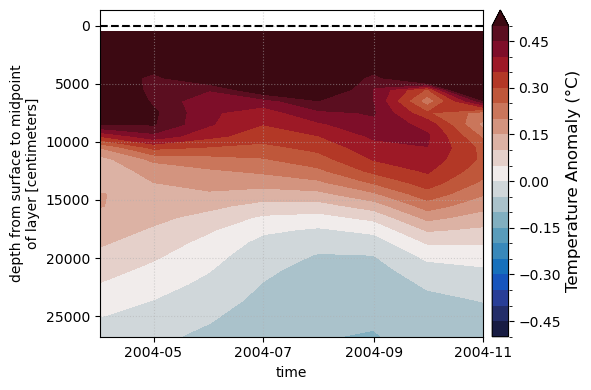

In [255]:
new_combined = vertical_structure_event[2]['data']
fig, ax = plt.subplots(figsize=(6, 4))

# Contour plot with reversed y-axis
contour = new_combined.plot.contourf(
    ax=ax,
    yincrease=False,                # Depth increases downward
    cmap=cmocean.cm.balance,                  # Red-Blue diverging colormap
    robust=True,                    # Ignore outliers in color scaling
    levels=21, 
    vmin=-0.5, vmax=.5,
    add_colorbar=False              # We'll add it manually later
)

# # Add vertical lines between phases
# ax.axvline(0.5, color='black', linestyle='--', linewidth=1, alpha=0.7)  # pre|mid1
# ax.axvline(1.5, color='black', linestyle='--', linewidth=1, alpha=0.7)  # mid1|mid2
# ax.axvline(2.5, color='black', linestyle='--', linewidth=1, alpha=0.7)  # mid2|post

# # Customize colorbar
cbar = plt.colorbar(contour, ax=ax, pad=0.02)
cbar.set_label("Temperature Anomaly (°C)", fontsize=12)

# # Labels and title
# ax.set_xlabel("MHW Phase", fontsize=12)
# ax.set_ylabel("Depth (m)", fontsize=12)
# ax.set_xticks([0, 1, 2, 3])
# ax.set_xticklabels(["Pre", "Mid1", "Mid2", "Post"], fontsize=11)
ax.grid(True, linestyle=':', alpha=0.5)
plt.axhline(y=0, c='k', linestyle='dashed')

# plt.title("Marine Heatwave Vertical Structure", fontsize=14, pad=20)
plt.tight_layout()
plt.show()

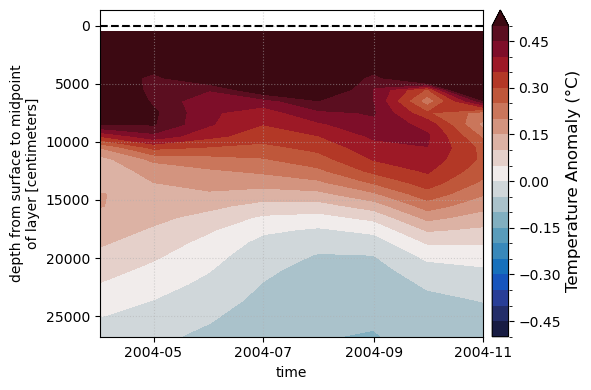

In [243]:
new_combined = vertical_structure_event[2]['data']
fig, ax = plt.subplots(figsize=(6, 4))

# Contour plot with reversed y-axis
contour = new_combined.plot.contourf(
    ax=ax,
    yincrease=False,                # Depth increases downward
    cmap=cmocean.cm.balance,                  # Red-Blue diverging colormap
    robust=True,                    # Ignore outliers in color scaling
    levels=21, 
    vmin=-0.5, vmax=.5,
    add_colorbar=False              # We'll add it manually later
)

# # Add vertical lines between phases
# ax.axvline(0.5, color='black', linestyle='--', linewidth=1, alpha=0.7)  # pre|mid1
# ax.axvline(1.5, color='black', linestyle='--', linewidth=1, alpha=0.7)  # mid1|mid2
# ax.axvline(2.5, color='black', linestyle='--', linewidth=1, alpha=0.7)  # mid2|post

# # Customize colorbar
cbar = plt.colorbar(contour, ax=ax, pad=0.02)
cbar.set_label("Temperature Anomaly (°C)", fontsize=12)

# # Labels and title
# ax.set_xlabel("MHW Phase", fontsize=12)
# ax.set_ylabel("Depth (m)", fontsize=12)
# ax.set_xticks([0, 1, 2, 3])
# ax.set_xticklabels(["Pre", "Mid1", "Mid2", "Post"], fontsize=11)
ax.grid(True, linestyle=':', alpha=0.5)
plt.axhline(y=0, c='k', linestyle='dashed')

# plt.title("Marine Heatwave Vertical Structure", fontsize=14, pad=20)
plt.tight_layout()
plt.show()

# New vertical structure

In [11]:
#### CESM LENS2 for GRIDDING PURPOSES
var = 'SST'
comp = 'atm'
directory = f'/glade/campaign/cgd/cesm/CESM2-LE/{comp}/proc/tseries/month_1/{var}/'
ens_memb_index = 0
ds_var_hist_SST, ds_var_fut_SST = get_ds_var(directory, 'SST','atm', ens_memb_index) 

# selecting our observational time period overlap with ERA5 (1979 to 2022)
CESMLENS_SST_hist_time_slice = ds_var_hist_SST.SST.sel(time=slice('1979-01-01', '2015-01-01'))
    
CESMLENS_SST_fut_time_slice = ds_var_fut_SST.SST.sel(time=slice('2015-02-01', '2020-12-01'))

CESMLENS_SST_ds = xr.concat([CESMLENS_SST_hist_time_slice, CESMLENS_SST_fut_time_slice], dim='time')
CESMLENS_SST = CESMLENS_SST_ds.compute()

In [12]:
filepaths = [f'/glade/work/cmendiola/data_conv_lin_trend/ens_{i}_mhwobj.nc' for i in range(100)]
da_mhwobj = xr.open_mfdataset(filepaths, combine='nested', concat_dim='ensemble_member')
da_mhwobj_labels = da_mhwobj.labels.sel(radius = 1).sel(time=slice('1979-01', '2020-12')).compute()

filepaths = [f'/glade/work/cmendiola/data_conv_lin_trend/ens_{i}_ssta.nc' for i in range(100)]
da_ssta = xr.open_mfdataset(filepaths, combine='nested', concat_dim='ensemble_member').__xarray_dataarray_variable__

file_path = 'object_id_ls_greenmask_linearr2.json'
with open(file_path, 'r') as file:
    linr2_data = json.load(file)

In [7]:
ens_memb_index = 0

In [8]:
%%time
var = 'TEMP'
comp = 'ocn'
directory = f'/glade/campaign/cgd/cesm/CESM2-LE/{comp}/proc/tseries/month_1/{var}/'

ds_var_hist_TEMP, ds_var_fut_TEMP = get_ds_var(directory, 'TEMP', comp, ens_memb_index) 
CESMLENS_TEMP_hist_time_slice = ds_var_hist_TEMP.TEMP.isel(z_t=slice(0, 20)).sel(time=slice('1979-01-01', '2015-01-01'))#.isel(nlat=slice(200,350), nlon=slice(170, 251))
CESMLENS_TEMP_fut_time_slice = ds_var_fut_TEMP.TEMP.isel(z_t=slice(0, 20)).sel(time=slice('2015-02-01', '2020-12-01'))#.isel(nlat=slice(200,350), nlon=slice(170, 251))
CESMLENS_TEMP_ds = xr.concat([CESMLENS_TEMP_hist_time_slice, CESMLENS_TEMP_fut_time_slice], dim='time')

deg1_wzeros_temp = regrid_SMYLE(CESMLENS_TEMP_ds)

deg1_wzeros_temp_nan = deg1_wzeros_temp.where(deg1_wzeros_temp!=0, np.nan)
regridder_temp = xe.Regridder(deg1_wzeros_temp_nan, CESMLENS_SST[:,:,:], 'nearest_s2d', periodic=True)
regridded_temp = regridder_temp(deg1_wzeros_temp_nan)
smaller_region_temp = regridded_temp.sel(lat = slice(12, 65), lon=slice(155, 245))
smaller_region_temp = smaller_region_temp.compute()

mean, trend, seas, features, anomalies = calculate_anomalies_trend_features_4d(smaller_region_temp)
anomalies_region_nan = xr.where(anomalies == 0., np.nan, anomalies)

/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


CPU times: user 1min 34s, sys: 4.28 s, total: 1min 39s
Wall time: 3min 54s


In [9]:
%%time
var = 'HMXL'
comp = 'ocn'
directory = f'/glade/campaign/cgd/cesm/CESM2-LE/{comp}/proc/tseries/month_1/{var}/'

ds_var_hist_MLD, ds_var_fut_MLD = get_ds_var(directory, var, comp, ens_memb_index) 
CESMLENS_MLD_hist_time_slice = ds_var_hist_MLD.HMXL
CESMLENS_MLD_fut_time_slice = ds_var_fut_MLD.HMXL
CESMLENS_MLD_ds = xr.concat([CESMLENS_MLD_hist_time_slice, CESMLENS_MLD_fut_time_slice], dim='time')
CESMLENS_MLD_ds_computed = CESMLENS_MLD_ds.compute()

deg1_wzeros_mld = regrid_SMYLE(CESMLENS_MLD_ds_computed)

deg1_wzeros_mld_nan = deg1_wzeros_mld.where(deg1_wzeros_mld!=0, np.nan)
regridder_mld = xe.Regridder(deg1_wzeros_mld_nan, CESMLENS_SST[:,:,:], 'nearest_s2d', periodic=True)
regridded_mld = regridder_mld(deg1_wzeros_mld_nan)
smaller_region_mld = regridded_mld.sel(lat = slice(12, 65), lon=slice(155, 245))

CPU times: user 12.3 s, sys: 1.85 s, total: 14.2 s
Wall time: 32.3 s


In [13]:
mask_3 = xr.open_dataset('mean_mask_3.nc').mhw_obj
mask_3 = xr.where(mask_3 > 0.1, 1, 0)
# mhw_obj_mask = mask_3
smaller_region_mask = mask_3.sel(
    lat = slice(5, 65), lon=slice(150, 250))

In [14]:
# I did 52 with MLD

******** 62 **********


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


66.0
4
<xarray.DataArray (time: 37)> Size: 296B
array([ 5,  7,  9,  0,  0,  2,  0,  3,  5,  6,  9,  4,  5,  0,  0,  3,  4,
        1,  2,  3,  5,  6,  2,  4,  5,  7,  8,  4,  4,  6,  8,  3,  5,  6,
        8, 11,  5])
Coordinates:
  * time     (time) object 296B 2011-03-01 00:00:00 ... 2014-03-01 00:00:00
great
great


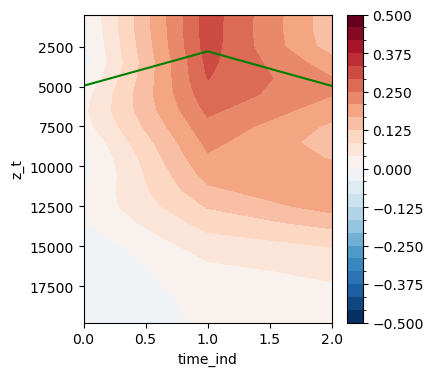

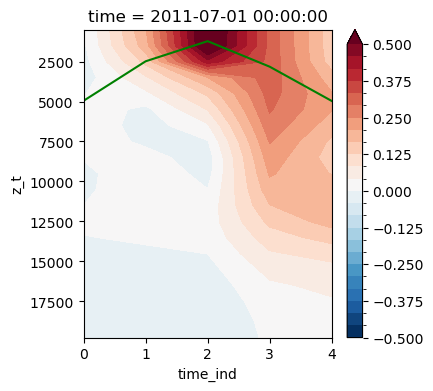

/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_0320_ls62.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_0320_ls62.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_0320_ls62.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_0320_ls62.nc


In [19]:
for ens_memb_index in range(62, 63):
    print('********',ens_memb_index,'**********')
    ################## TEMP
    var = 'TEMP'
    comp = 'ocn'
    directory = f'/glade/campaign/cgd/cesm/CESM2-LE/{comp}/proc/tseries/month_1/{var}/'
    
    ds_var_hist_TEMP, ds_var_fut_TEMP = get_ds_var(directory, 'TEMP', comp, ens_memb_index) 
    CESMLENS_TEMP_hist_time_slice = ds_var_hist_TEMP.TEMP.isel(z_t=slice(0, 20)).sel(time=slice('1979-01-01', '2015-01-01'))#.isel(nlat=slice(200,350), nlon=slice(170, 251))
    CESMLENS_TEMP_fut_time_slice = ds_var_fut_TEMP.TEMP.isel(z_t=slice(0, 20)).sel(time=slice('2015-02-01', '2020-12-01'))#.isel(nlat=slice(200,350), nlon=slice(170, 251))
    CESMLENS_TEMP_ds = xr.concat([CESMLENS_TEMP_hist_time_slice, CESMLENS_TEMP_fut_time_slice], dim='time')
    
    deg1_wzeros_temp = regrid_SMYLE(CESMLENS_TEMP_ds)
    
    deg1_wzeros_temp_nan = deg1_wzeros_temp.where(deg1_wzeros_temp!=0, np.nan)
    regridder_temp = xe.Regridder(deg1_wzeros_temp_nan, CESMLENS_SST[:,:,:], 'nearest_s2d', periodic=True)
    regridded_temp = regridder_temp(deg1_wzeros_temp_nan)
    smaller_region_temp = regridded_temp.sel(lat = slice(12, 65), lon=slice(155, 245))
    smaller_region_temp = smaller_region_temp.compute()
    
    mean, trend, seas, features, anomalies = calculate_anomalies_trend_features_4d(smaller_region_temp)
    anomalies_region_nan = xr.where(anomalies == 0., np.nan, anomalies)
    ################## HMXL
    var = 'HMXL'
    comp = 'ocn'
    directory = f'/glade/campaign/cgd/cesm/CESM2-LE/{comp}/proc/tseries/month_1/{var}/'
    
    ds_var_hist_MLD, ds_var_fut_MLD = get_ds_var(directory, var, comp, ens_memb_index) 
    CESMLENS_MLD_hist_time_slice = ds_var_hist_MLD.HMXL
    CESMLENS_MLD_fut_time_slice = ds_var_fut_MLD.HMXL
    CESMLENS_MLD_ds = xr.concat([CESMLENS_MLD_hist_time_slice, CESMLENS_MLD_fut_time_slice], dim='time')
    CESMLENS_MLD_ds_computed = CESMLENS_MLD_ds.compute()
    
    deg1_wzeros_mld = regrid_SMYLE(CESMLENS_MLD_ds_computed)
    
    deg1_wzeros_mld_nan = deg1_wzeros_mld.where(deg1_wzeros_mld!=0, np.nan)
    regridder_mld = xe.Regridder(deg1_wzeros_mld_nan, CESMLENS_SST[:,:,:], 'nearest_s2d', periodic=True)
    regridded_mld = regridder_mld(deg1_wzeros_mld_nan)
    smaller_region_mld = regridded_mld.sel(lat = slice(12, 65), lon=slice(155, 245))

    mld_data_3phase_ls = []
    temp_data_3phase_ls = []
    
    temp_data_5phase_ls = []
    mld_data_5phase_ls = []
    max_depth_by_time_ls = []
    for mhw_ind in linr2_data[4][ens_memb_index]:
        print(mhw_ind)
    
        ##### Timing
        first_time = da_mhwobj_labels[ens_memb_index,:,:,:].where(
            da_mhwobj_labels[ens_memb_index,:,:,:] == mhw_ind, drop=True).time[0] - xr.coding.cftime_offsets.to_offset("2MS")
        last_time = da_mhwobj_labels[ens_memb_index,:,:,:].where(
            da_mhwobj_labels[ens_memb_index,:,:,:] == mhw_ind, drop=True).time[-1] + xr.coding.cftime_offsets.to_offset("2MS")
        
        ssta = da_ssta.sel(ensemble_member=ens_memb_index).sel(time=slice(first_time, last_time))
    
        blob_region = ssta*smaller_region_mask
        blob_region_nan = xr.where(blob_region == 0., np.nan, blob_region)
        mean_ssta = blob_region_nan.mean(dim=('lat','lon')).compute()
            
        peak_time = mean_ssta.argmax().item()
        print(peak_time)
    
        ssta_mhw_region = blob_region_nan.compute()
        mld_mhw_region = smaller_region_mld.sel(time=slice(first_time, last_time))*smaller_region_mask
        mld_mhw_region_area_average = mld_mhw_region.mean(dim=('lat','lon'))
        vert_anomalies_region = anomalies_region_nan.sel(time=slice(first_time, last_time))*smaller_region_mask
        vert_anomalies_areaaverage = vert_anomalies_region.mean(dim=('lat','lon'))
        # max_vert_idx = vert_anomalies_region.sel(time=slice(da_mhwobj_labels[ens_memb_index,:,:,:].where(
        #     da_mhwobj_labels[ens_memb_index,:,:,:] == mhw_ind, drop=True).time[0], da_mhwobj_labels[ens_memb_index,:,:,:].where(
        #     da_mhwobj_labels[ens_memb_index,:,:,:] == mhw_ind, drop=True).time[-1])).mean(dim=('lat','lon')).argmax(dim='time')
        # max_vert_idx_by_ind.append(max_vert_idx)
        # print(max_vert_idx)
        max_depth_by_time = vert_anomalies_region.mean(dim=('lat','lon')).argmax(dim='z_t')
        print(max_depth_by_time)
        fp_temp_data = five_phases(vert_anomalies_areaaverage, peak_time)
        fp_mld_data = five_phases(mld_mhw_region_area_average, peak_time)
        
        tp_temp_data = three_phases(vert_anomalies_areaaverage)
        tp_mld_data = three_phases(mld_mhw_region_area_average)
    
        ########### PLOTTING
        fig, ax = plt.subplots(figsize=(4, 4))
    
        tp_mld_data.plot(c='green', linewidth=1.5)
        tp_temp_data[:,:].transpose().plot.contourf(
            ax=ax,
            yincrease=False,
            cmap='RdBu_r',
            robust=True,
            levels=25, 
            vmin=-0.5, vmax=0.5,
            add_colorbar=True
        )
        plt.show()
        ########### PLOTTING
        fig, ax = plt.subplots(figsize=(4, 4))
    
        fp_mld_data.plot(c='green', linewidth=1.5)
        fp_temp_data[:,:].transpose().plot.contourf(
            ax=ax,
            yincrease=False,
            cmap='RdBu_r',
            robust=True,
            levels=25, 
            vmin=-0.5, vmax=0.5,
            add_colorbar=True
        )
        
        plt.show()
        ########### PLOTTING
        mld_data_3phase_ls.append(tp_mld_data)
        mld_data_5phase_ls.append(fp_mld_data)
    
        temp_data_5phase_ls.append(fp_temp_data)
        temp_data_3phase_ls.append(tp_temp_data)
        max_depth_by_time_ls.append(max_depth_by_time)
    if len(temp_data_3phase_ls) > 0:
        ds_temp_data_3phase_ls = xr.concat(temp_data_3phase_ls, dim='mhw_event_ind')
        filename = '/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_0320_ls{}.nc'.format(ens_memb_index)
        ds_temp_data_3phase_ls.to_netcdf(filename)
        print(filename)
    if len(temp_data_5phase_ls) > 0:
        ds_temp_data_5phase_ls = xr.concat(temp_data_5phase_ls, dim='mhw_event_ind')
        filename = '/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_0320_ls{}.nc'.format(ens_memb_index)
        ds_temp_data_5phase_ls.to_netcdf(filename)
        print(filename)

    if len(mld_data_3phase_ls) > 0:
        ds_mld_data_3phase_ls = xr.concat(mld_data_3phase_ls, dim='mhw_event_ind')
        filename = '/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_0320_ls{}.nc'.format(ens_memb_index)
        ds_mld_data_3phase_ls.to_netcdf(filename)
        print(filename)
    if len(mld_data_5phase_ls) > 0:
        ds_mld_data_5phase_ls = xr.concat(mld_data_5phase_ls, dim='mhw_event_ind')
        filename = '/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_0320_ls{}.nc'.format(ens_memb_index)
        ds_mld_data_5phase_ls.to_netcdf(filename)
        print(filename)
    
    with open('/glade/derecho/scratch/cassiacai/vertical_phases/new_depth_phase_data{}.pkl'.format(ens_memb_index), 'wb') as f:
        pickle.dump(max_depth_by_time_ls, f)

In [23]:
ens_memb_index = 67

1.0
6
<xarray.DataArray (z_t: 20)> Size: 160B
array([6, 6, 6, 7, 7, 7, 7, 7, 4, 4, 5, 5, 5, 6, 6, 7, 7, 7, 7, 7])
Coordinates:
  * z_t      (z_t) float32 80B 500.0 1.5e+03 2.5e+03 ... 1.863e+04 1.977e+04
great
great


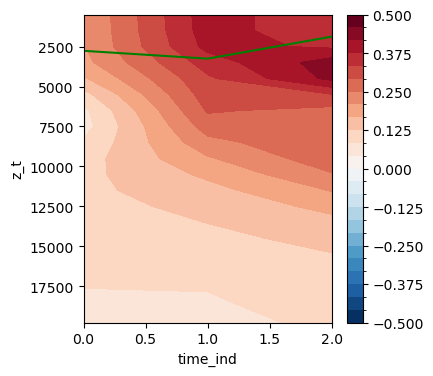

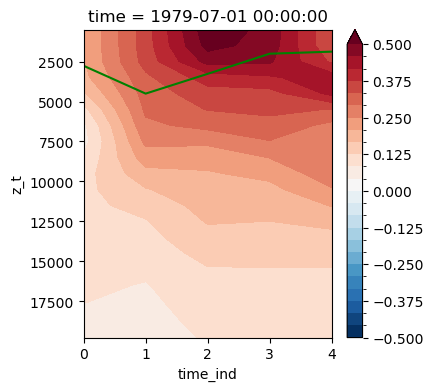

69.0
8
<xarray.DataArray (z_t: 20)> Size: 160B
array([ 6,  6,  6,  6,  7,  7,  8,  8,  9,  9, 10, 10, 10,  8,  8,  9,  9,
       10,  0,  0])
Coordinates:
  * z_t      (z_t) float32 80B 500.0 1.5e+03 2.5e+03 ... 1.863e+04 1.977e+04
great
great


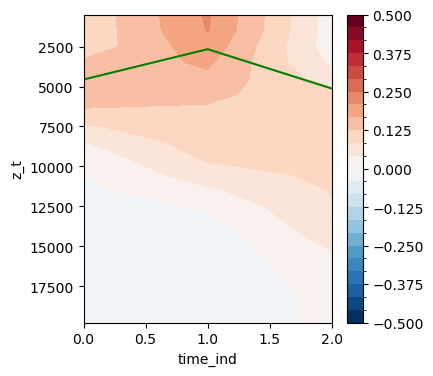

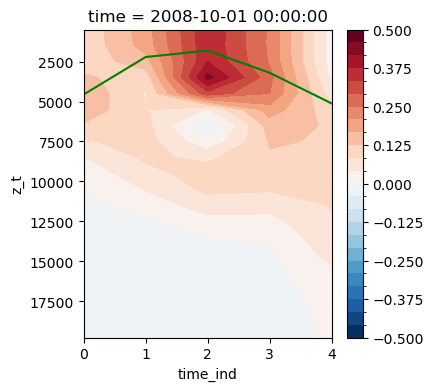

70.0
6
<xarray.DataArray (z_t: 20)> Size: 160B
array([4, 4, 4, 4, 4, 2, 2, 3, 3, 3, 4, 4, 4, 4, 4, 3, 3, 3, 3, 3])
Coordinates:
  * z_t      (z_t) float32 80B 500.0 1.5e+03 2.5e+03 ... 1.863e+04 1.977e+04
great
great


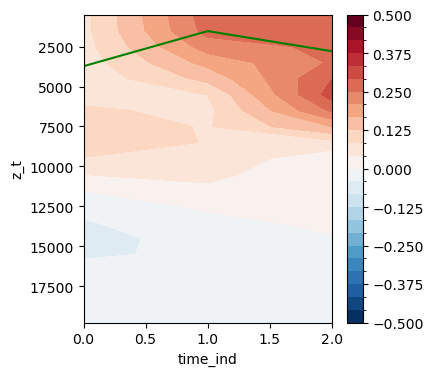

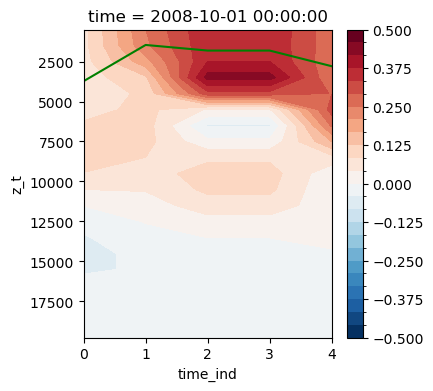

72.0
10
<xarray.DataArray (z_t: 20)> Size: 160B
array([ 8,  8,  8,  8,  9,  9, 10, 10, 11, 11, 12, 12, 13, 13, 13, 14, 14,
       14, 14, 14])
Coordinates:
  * z_t      (z_t) float32 80B 500.0 1.5e+03 2.5e+03 ... 1.863e+04 1.977e+04
great
great


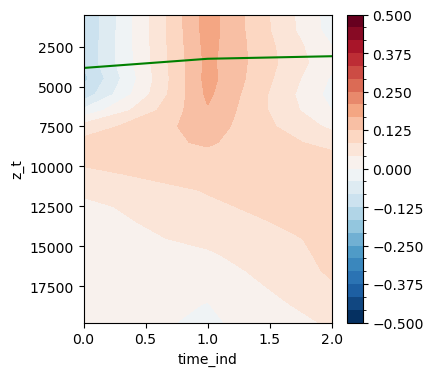

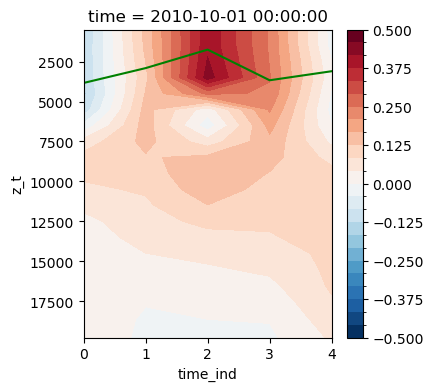

73.0
2
<xarray.DataArray (z_t: 20)> Size: 160B
array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])
Coordinates:
  * z_t      (z_t) float32 80B 500.0 1.5e+03 2.5e+03 ... 1.863e+04 1.977e+04
yeah
yeah


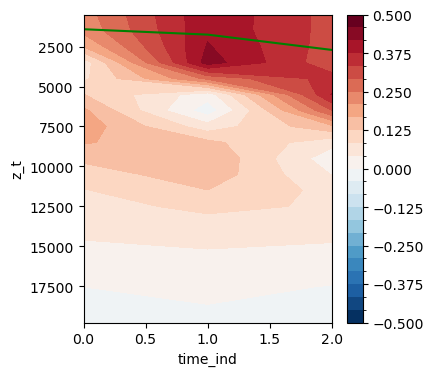

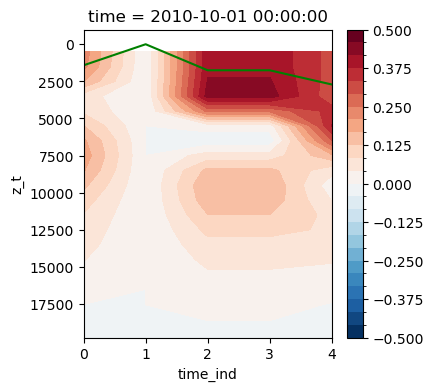

80.0
3
<xarray.DataArray (z_t: 20)> Size: 160B
array([1, 1, 1, 1, 2, 2, 3, 3, 0, 4, 4, 1, 2, 5, 6, 7, 7, 7, 0, 0])
Coordinates:
  * z_t      (z_t) float32 80B 500.0 1.5e+03 2.5e+03 ... 1.863e+04 1.977e+04
great
great


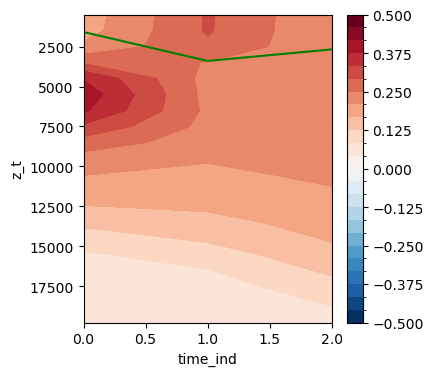

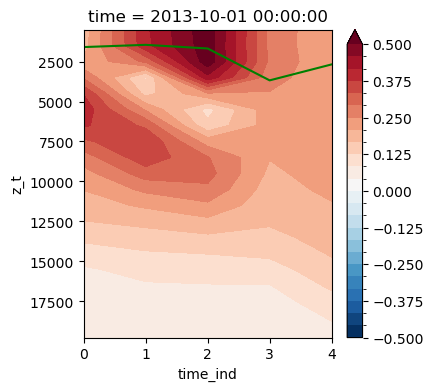

85.0
9
<xarray.DataArray (z_t: 20)> Size: 160B
array([ 7,  7,  7,  7,  7,  7,  8,  8,  9,  9, 10,  1,  1,  1,  1,  1,  0,
        0,  1,  7])
Coordinates:
  * z_t      (z_t) float32 80B 500.0 1.5e+03 2.5e+03 ... 1.863e+04 1.977e+04
great
great


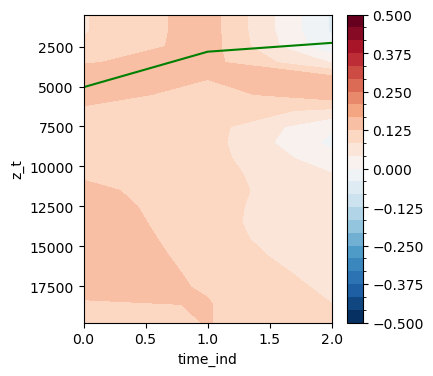

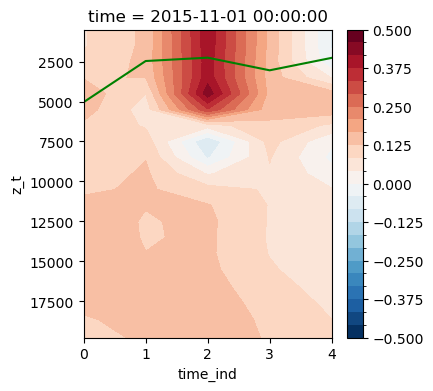

88.0
2
<xarray.DataArray (z_t: 20)> Size: 160B
array([0, 0, 0, 0, 0, 0, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0])
Coordinates:
  * z_t      (z_t) float32 80B 500.0 1.5e+03 2.5e+03 ... 1.863e+04 1.977e+04
yeah
yeah


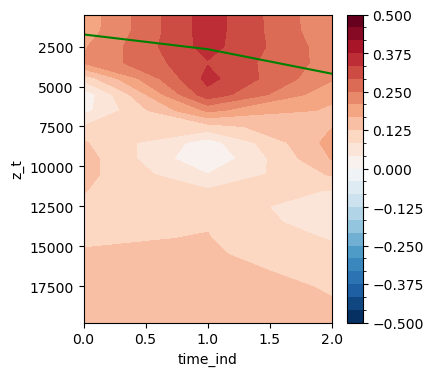

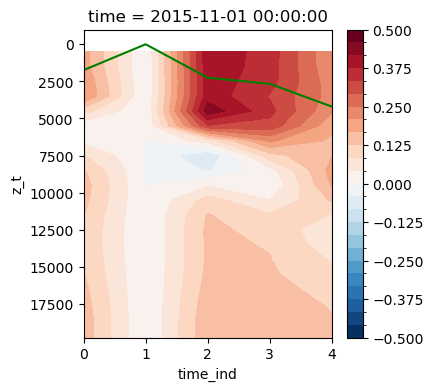

In [24]:
mld_data_3phase_ls = []
temp_data_3phase_ls = []

temp_data_5phase_ls = []
mld_data_5phase_ls = []

max_vert_idx_by_ind = []
for mhw_ind in linr2_data[4][ens_memb_index]:
    print(mhw_ind)

    ##### Timing
    first_time = da_mhwobj_labels[ens_memb_index,:,:,:].where(
        da_mhwobj_labels[ens_memb_index,:,:,:] == mhw_ind, drop=True).time[0] - xr.coding.cftime_offsets.to_offset("2MS")
    last_time = da_mhwobj_labels[ens_memb_index,:,:,:].where(
        da_mhwobj_labels[ens_memb_index,:,:,:] == mhw_ind, drop=True).time[-1] + xr.coding.cftime_offsets.to_offset("2MS")
    
    ssta = da_ssta.sel(ensemble_member=ens_memb_index).sel(time=slice(first_time, last_time))

    blob_region = ssta*smaller_region_mask
    blob_region_nan = xr.where(blob_region == 0., np.nan, blob_region)
    mean_ssta = blob_region_nan.mean(dim=('lat','lon')).compute()
        
    peak_time = mean_ssta.argmax().item()
    print(peak_time)

    ssta_mhw_region = blob_region_nan.compute()
    mld_mhw_region = smaller_region_mld.sel(time=slice(first_time, last_time))*smaller_region_mask
    mld_mhw_region_area_average = mld_mhw_region.mean(dim=('lat','lon'))
    vert_anomalies_region = anomalies_region_nan.sel(time=slice(first_time, last_time))*smaller_region_mask
    vert_anomalies_areaaverage = vert_anomalies_region.mean(dim=('lat','lon'))
    max_vert_idx = vert_anomalies_region.sel(time=slice(da_mhwobj_labels[ens_memb_index,:,:,:].where(
        da_mhwobj_labels[ens_memb_index,:,:,:] == mhw_ind, drop=True).time[0], da_mhwobj_labels[ens_memb_index,:,:,:].where(
        da_mhwobj_labels[ens_memb_index,:,:,:] == mhw_ind, drop=True).time[-1])).mean(dim=('lat','lon')).argmax(dim='time')
    max_vert_idx_by_ind.append(max_vert_idx)
    print(max_vert_idx)
    
    fp_temp_data = five_phases(vert_anomalies_areaaverage, peak_time)
    fp_mld_data = five_phases(mld_mhw_region_area_average, peak_time)
    
    tp_temp_data = three_phases(vert_anomalies_areaaverage)
    tp_mld_data = three_phases(mld_mhw_region_area_average)

    ########### PLOTTING
    fig, ax = plt.subplots(figsize=(4, 4))

    tp_mld_data.plot(c='green', linewidth=1.5)
    tp_temp_data[:,:].transpose().plot.contourf(
        ax=ax,
        yincrease=False,
        cmap='RdBu_r',
        robust=True,
        levels=25, 
        vmin=-0.5, vmax=0.5,
        add_colorbar=True
    )
    plt.show()
    ########### PLOTTING
    fig, ax = plt.subplots(figsize=(4, 4))

    fp_mld_data.plot(c='green', linewidth=1.5)
    fp_temp_data[:,:].transpose().plot.contourf(
        ax=ax,
        yincrease=False,
        cmap='RdBu_r',
        robust=True,
        levels=25, 
        vmin=-0.5, vmax=0.5,
        add_colorbar=True
    )
    
    plt.show()
    ########### PLOTTING
    mld_data_3phase_ls.append(tp_mld_data)
    mld_data_5phase_ls.append(fp_mld_data)

    temp_data_5phase_ls.append(fp_temp_data)
    temp_data_3phase_ls.append(tp_temp_data)

In [17]:
if len(temp_data_3phase_ls) > 0:
    ds_temp_data_3phase_ls = xr.concat(temp_data_3phase_ls, dim='mhw_event_ind')
    filename = '/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_0319_ls{}.nc'.format(ens_memb_index)
    ds_temp_data_3phase_ls.to_netcdf(filename)
    print(filename)
if len(temp_data_5phase_ls) > 0:
    ds_temp_data_5phase_ls = xr.concat(temp_data_5phase_ls, dim='mhw_event_ind')
    filename = '/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_0319_ls{}.nc'.format(ens_memb_index)
    ds_temp_data_5phase_ls.to_netcdf(filename)
    print(filename)

with open('/glade/derecho/scratch/cassiacai/vertical_phases/depth_phase_data{}.pkl'.format(ens_memb_index), 'wb') as f:
    pickle.dump(max_vert_idx_by_ind, f)

/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_0319_ls8.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_0319_ls8.nc


In [332]:
with open('/glade/derecho/scratch/cassiacai/vertical_phases/depth_phase_data{}.pkl'.format(ens_memb_index), 'wb') as f:
    pickle.dump(max_vert_idx_by_ind, f)

In [25]:
mhw_ind = 72.0

In [26]:
first_time = da_mhwobj_labels[ens_memb_index,:,:,:].where(
    da_mhwobj_labels[ens_memb_index,:,:,:] == mhw_ind, drop=True).time[0] - xr.coding.cftime_offsets.to_offset("2MS")
last_time = da_mhwobj_labels[ens_memb_index,:,:,:].where(
    da_mhwobj_labels[ens_memb_index,:,:,:] == mhw_ind, drop=True).time[-1] + xr.coding.cftime_offsets.to_offset("2MS")

ssta = da_ssta.sel(ensemble_member=ens_memb_index).sel(time=slice(first_time, last_time))

In [27]:
blob_region = ssta*smaller_region_mask
blob_region_nan = xr.where(blob_region == 0., np.nan, blob_region)
mean_ssta = blob_region_nan.mean(dim=('lat','lon')).compute()
    
peak_time = mean_ssta.argmax().item()
print(peak_time)

10


In [28]:
ssta_mhw_region = blob_region_nan.compute()

In [29]:
mld_mhw_region = smaller_region_mld.sel(time=slice(first_time, last_time))*smaller_region_mask

In [30]:
mld_mhw_region_area_average = mld_mhw_region.mean(dim=('lat','lon'))

In [31]:
vert_anomalies_region = anomalies_region_nan.sel(time=slice(first_time, last_time))*smaller_region_mask

In [69]:
max_depth_by_time = vert_anomalies_region.mean(dim=('lat','lon')).argmax(dim='z_t')


In [44]:
max_vert_idx = vert_anomalies_region.sel(time=slice(da_mhwobj_labels[ens_memb_index,:,:,:].where(
    da_mhwobj_labels[ens_memb_index,:,:,:] == mhw_ind, drop=True).time[0], da_mhwobj_labels[ens_memb_index,:,:,:].where(
    da_mhwobj_labels[ens_memb_index,:,:,:] == mhw_ind, drop=True).time[-1])).mean(dim=('lat','lon')).argmax(dim='time')

In [56]:
max_vert_idx

<xarray.DataArray (z_t: 20)> Size: 160B
array([ 8,  8,  8,  8,  9,  9, 10, 10, 11, 11, 12, 12, 13, 13, 13, 14, 14,
       14, 14, 14])
Coordinates:
  * z_t      (z_t) float32 80B 500.0 1.5e+03 2.5e+03 ... 1.863e+04 1.977e+04

In [70]:
depths_in_cm = np.asarray(max_vert_idx_depth.z_t)
corresponding_depths = depths_in_cm[max_depth_by_time]


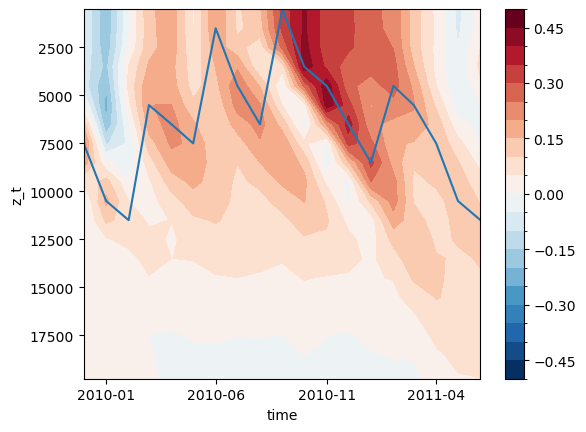

In [72]:
vert_anomalies_region.mean(dim=('lat','lon')).transpose().plot.contourf(
    yincrease=False, cmap='RdBu_r', vmin=-0.5, vmax=0.5, levels=21)
plt.plot(vert_anomalies_region.mean(dim=('lat','lon')).time, corresponding_depths)

In [34]:
max_vert_idx

<xarray.DataArray (z_t: 20)> Size: 160B
array([ 8,  8,  8,  8,  9,  9, 10, 10, 11, 11, 12, 12, 13, 13, 13, 14, 14,
       14, 14, 14])
Coordinates:
  * z_t      (z_t) float32 80B 500.0 1.5e+03 2.5e+03 ... 1.863e+04 1.977e+04

In [328]:
fp_temp_data = five_phases(vert_anomalies_areaaverage, peak_time)
fp_mld_data = five_phases(mld_mhw_region_area_average, peak_time)

tp_temp_data = three_phases(vert_anomalies_areaaverage)
tp_mld_data = three_phases(mld_mhw_region_area_average)

great
great


In [329]:
fp_temp_data

<xarray.DataArray (time_ind: 5, z_t: 20)> Size: 800B
array([[-0.05842596, -0.06129367, -0.07753504, -0.1164047 , -0.13186994,
        -0.10922053, -0.07154165, -0.03885124, -0.02918125, -0.03872488,
        -0.05861686, -0.08213662, -0.10584919, -0.12724141, -0.13696487,
        -0.12611325, -0.09769445, -0.06421314, -0.03398968, -0.01003619],
       [ 0.14876697,  0.1484392 ,  0.14388261,  0.11831228,  0.09954328,
         0.08518277,  0.06815513,  0.05454158,  0.04094218,  0.02654524,
         0.01132482, -0.00672572, -0.02683645, -0.0472272 , -0.06447426,
        -0.07636168, -0.08235917, -0.08279482, -0.07831061, -0.06999383],
       [ 0.40524195,  0.4031712 ,  0.39937619,  0.42007987,  0.45588437,
         0.47078687,  0.4521994 ,  0.40268177,  0.32130389,  0.22364122,
         0.13950884,  0.08813597,  0.05723099,  0.02611533, -0.00392835,
        -0.03290646, -0.05543781, -0.07295798, -0.08713427, -0.09687007],
       [ 0.364055  ,  0.36508314,  0.36206379,  0.35419747,  0.36186203,
         0.38095125,  0.3949879 ,  0.39157828,  0.35848998,  0.29706906,
         0.22041967,  0.1475366 ,  0.09029718,  0.04424755,  0.00874894,
        -0.01992474, -0.04186338, -0.05969671, -0.07439049, -0.08510319],
       [ 0.27190343,  0.27404103,  0.29547519,  0.32401382,  0.34599614,
         0.34622629,  0.33606069,  0.31792938,  0.30558681,  0.29205871,
         0.26545408,  0.21799946,  0.15743371,  0.09610082,  0.04459917,
         0.00524347, -0.02242283, -0.04217584, -0.05635134, -0.06683201]])
Coordinates:
  * z_t      (z_t) float32 80B 500.0 1.5e+03 2.5e+03 ... 1.863e+04 1.977e+04
    time     object 8B 1996-03-01 00:00:00
Dimensions without coordinates: time_ind

In [15]:
def three_phases(region_area_data):
    pre_mhw_event_mld = region_area_data.isel(time=slice(0,2)).mean(dim='time')
    duration_mhw_mld = region_area_data.isel(time=slice(2,-2)).mean(dim='time')
    post_mhw_event_mld = region_area_data.isel(time=slice(-2,None)).mean(dim='time')
    
    var_dataxr = [pre_mhw_event_mld, 
                  duration_mhw_mld,
                  post_mhw_event_mld
                 ]

    var_data = xr.concat(var_dataxr, dim='time_ind')
    return var_data

In [16]:
def five_phases(region_area_data, peak_time):
    if peak_time == 2:
        print('yeah')
        pre_mhw_event_mld = region_area_data.isel(time=slice(0,2)).mean(dim='time')
        lead_up_mhw_event_mld = pre_mhw_event_mld*0
        max_mhw_event_mld = region_area_data.isel(time=peak_time)
        decline_mhw_event_mld = region_area_data.isel(time=slice(peak_time, -2)).mean(dim='time')
        post_mhw_event_mld = region_area_data.isel(time=slice(-2,None)).mean(dim='time')
    elif peak_time > 2 and peak_time < len(region_area_data.time)-2:
        print('great')
        pre_mhw_event_mld = region_area_data.isel(time=slice(0,2)).mean(dim='time')
        lead_up_mhw_event_mld = region_area_data.isel(time=slice(2,peak_time)).mean(dim='time')
        max_mhw_event_mld = region_area_data.isel(time=peak_time)
        decline_mhw_event_mld = region_area_data.isel(time=slice(peak_time, -2)).mean(dim='time')
        post_mhw_event_mld = region_area_data.isel(time=slice(-2,None)).mean(dim='time')
    elif peak_time == len(region_area_data.time)-2:
        print('not so great')
        pre_mhw_event_mld = region_area_data.isel(time=slice(0,2)).mean(dim='time')
        lead_up_mhw_event_mld = region_area_data.isel(time=slice(2,peak_time)).mean(dim='time')
        max_mhw_event_mld = region_area_data.isel(time=peak_time)
        decline_mhw_event_mld = pre_mhw_event_mld*0
        post_mhw_event_mld = region_area_data.isel(time=slice(-2,None)).mean(dim='time')
    else:
        print('excellent')
        pre_mhw_event_mld = region_area_data.isel(time=slice(0,2)).mean(dim='time')
        lead_up_mhw_event_mld = region_area_data.isel(time=slice(2,peak_time)).mean(dim='time')
        max_mhw_event_mld = region_area_data.isel(time=peak_time)
        decline_mhw_event_mld = region_area_data.isel(time=slice(peak_time, -2)).mean(dim='time')
        post_mhw_event_mld = region_area_data.isel(time=slice(-2,None)).mean(dim='time')

    var_dataxr = [pre_mhw_event_mld, 
                  lead_up_mhw_event_mld, 
                  max_mhw_event_mld, 
                  decline_mhw_event_mld,
                  post_mhw_event_mld
                 ]

    var_data = xr.concat(var_dataxr, dim='time_ind')
    return var_data

# Trying it out

In [174]:
if peak_time == 2:
    print('yeah')
    pre_mhw_event_mld = mld_mhw_region_area_average[0:2].mean().item()
    lead_up_mhw_event_mld = 0
    max_mhw_event_mld = mld_mhw_region_area_average[peak_time]
    decline_mhw_event_mld = mld_mhw_region_area_average[peak_time:-2].mean().item()
    post_mhw_event_mld = mld_mhw_region_area_average[-2:None].mean().item()
elif peak_time > 2 and peak_time < len(mld_mhw_region_area_average.time)-2:
    print('great')
    pre_mhw_event_mld = mld_mhw_region_area_average[0:2].mean().item()
    lead_up_mhw_event_mld = mld_mhw_region_area_average[2:peak_time].mean().item()
    max_mhw_event_mld = mld_mhw_region_area_average[peak_time]
    decline_mhw_event_mld = mld_mhw_region_area_average[peak_time:-2].mean().item()
    post_mhw_event_mld = mld_mhw_region_area_average[-2:None].mean().item()
elif peak_time == len(mld_mhw_region_area_average.time)-2:
    print('not so great')
    pre_mhw_event_mld = mld_mhw_region_area_average[0:2].mean().item()
    lead_up_mhw_event_mld = mld_mhw_region_area_average[2:peak_time].mean().item()
    max_mhw_event_mld = mld_mhw_region_area_average[peak_time]
    decline_mhw_event_mld = 0
    post_mhw_event_mld = mld_mhw_region_area_average[-2:None].mean().item()

yeah


In [172]:
len(mld_mhw_region_area_average.time)-2

6

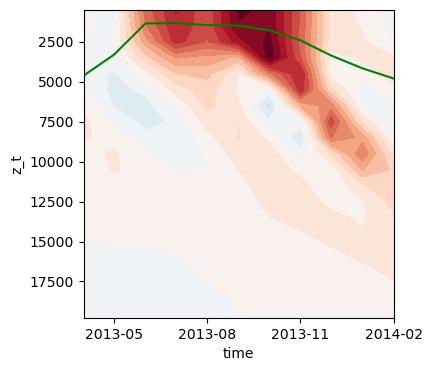

In [133]:
fig, ax = plt.subplots(figsize=(4, 4))

mld_mhw_region_area_average.plot(c='green', linewidth=1.5)
vert_anomalies_areaaverage[:,:].transpose().plot.contourf(
    ax=ax,
    yincrease=False,
    cmap='RdBu_r',
    robust=True,
    levels=25, 
    vmin=-0.5, vmax=0.5,
    add_colorbar=False
)


plt.show()

In [ ]:
        if len(mhw_event_temp_anomalies.time)<=6:
            print('3PHASE')
            temp_data_3phase, mld_data_3phase = calc_vertical_temperature_mld_structure_3_phases(
                peak_time, mhw_event_temp_anomalies, smaller_region_mld, first_time, last_time, blobs_nan)
    
            mld_data_3phase_ls.append(mld_data_3phase)
            temp_data_3phase_ls.append(temp_data_3phase)
            
        elif peak_time == 3:
            print('4phase LU')
            temp_data_4phase_LU, mld_data_4phase_LU = calc_vertical_temperature_mld_structure_4_fast_leadup_phases(
                peak_time, mhw_event_temp_anomalies, smaller_region_mld, first_time, last_time, blob_region_nan)
    
            mld_data_4phase_LU_ls.append(mld_data_4phase_LU)
            temp_data_4phase_LU_ls.append(temp_data_4phase_LU)
            
            temp_data_3phase, mld_data_3phase = calc_vertical_temperature_mld_structure_3_phases(
                peak_time, mhw_event_temp_anomalies, smaller_region_mld, first_time, last_time, blobs_nan)
    
            mld_data_3phase_ls.append(mld_data_3phase)
            temp_data_3phase_ls.append(temp_data_3phase)
        
        elif (peak_time+2) == len(mhw_event_temp_anomalies.time) - 2:
            print('4phase DE')
            temp_data_4phase_DE, mld_data_4phase_DE = calc_vertical_temperature_mld_structure_4_fast_decline_phases(
                peak_time, mhw_event_temp_anomalies, smaller_region_mld, first_time, last_time, blob_region_nan)
    
            mld_data_4phase_DE_ls.append(mld_data_4phase_DE)
            temp_data_4phase_DE_ls.append(temp_data_4phase_DE)
            
            temp_data_3phase, mld_data_3phase = calc_vertical_temperature_mld_structure_3_phases(
                peak_time, mhw_event_temp_anomalies, smaller_region_mld, first_time, last_time, blobs_nan)
    
            mld_data_3phase_ls.append(mld_data_3phase)
            temp_data_3phase_ls.append(temp_data_3phase)
    
        elif len(mhw_event_temp_anomalies.time) > 6: 
            print('5phase')
            temp_data_5phase, mld_data_5phase = calc_vertical_temperature_mld_structure_5_phases(
                peak_time, mhw_event_temp_anomalies, smaller_region_mld, first_time, last_time, blobs_nan)
            temp_data_3phase, mld_data_3phase = calc_vertical_temperature_mld_structure_3_phases(
                peak_time, mhw_event_temp_anomalies, smaller_region_mld, first_time, last_time, blobs_nan)
        
            mld_data_3phase_ls.append(mld_data_3phase)
            mld_data_5phase_ls.append(mld_data_5phase)
    
            temp_data_5phase_ls.append(temp_data_5phase)
            temp_data_3phase_ls.append(temp_data_3phase)

In [ ]:
for i in range(len(linr2_data[4][ens_memb_ind])):
    mhw_ind = linr2_data[4][ens_memb_ind][i]
    print('************')
    first_time = da_mhwobj_labels[ens_memb_ind,:,:,:].where(
    da_mhwobj_labels[ens_memb_ind,:,:,:] == mhw_ind, drop=True).time[0] - xr.coding.cftime_offsets.to_offset("2MS")
    last_time = da_mhwobj_labels[ens_memb_ind,:,:,:].where(
    da_mhwobj_labels[ens_memb_ind,:,:,:] == mhw_ind, drop=True).time[-1] + xr.coding.cftime_offsets.to_offset("2MS")
            
    ssta = da_ssta.sel(ensemble_member=ens_memb_ind).sel(time=slice(first_time, last_time))
        
    blob_region = ssta*smaller_region_mask
    blob_region_nan = xr.where(blob_region == 0., np.nan, blob_region)
    mean_ssta = blob_region_nan.mean(dim=('lat','lon')).compute()
    
    peak_time = mean_ssta.argmax().item()
    print(peak_time)
    
    blobs = da_mhwobj_labels.isel(ensemble_member = ens_memb_ind)
    object_count_per_time = (blobs == mhw_ind).sum(dim=['lat', 'lon'])
    true_time_steps = object_count_per_time.time.where(object_count_per_time > 0, drop=True)
                
    one_obj = blobs.sel(time=true_time_steps.time)
    blobs_nan = xr.where(one_obj == mhw_ind, 1., 0.)
    
    mhw_event_temp_anomalies = anomalies_region_nan.sel(time=slice(first_time, last_time)) * blob_region_nan[0]

In [10]:
mask_3 = xr.open_dataset('mean_mask_3.nc').mhw_obj
mask_3 = xr.where(mask_3 > 0.1, 1, 0)
# mhw_obj_mask = mask_3
smaller_region_mask = mask_3.sel(
    lat = slice(5, 65), lon=slice(150, 250))

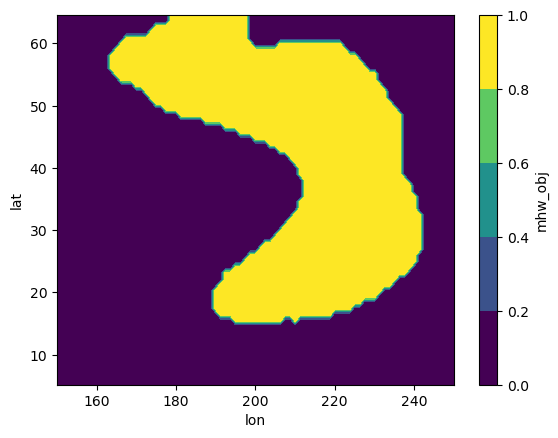

In [22]:
smaller_region_mask.plot.contourf()

In [ ]:
for ens_memb_ind in range(5,50):
    ##### ----------- TEMPERATURE
    var = 'TEMP'
    comp = 'ocn'
    directory = f'/glade/campaign/cgd/cesm/CESM2-LE/{comp}/proc/tseries/month_1/{var}/'
    
    ds_var_hist_TEMP, ds_var_fut_TEMP = get_ds_var(directory, 'TEMP', comp, ens_memb_index) 
    CESMLENS_TEMP_hist_time_slice = ds_var_hist_TEMP.TEMP.isel(z_t=slice(0, 20)).sel(time=slice('1979-01-01', '2015-01-01'))#.isel(nlat=slice(200,350), nlon=slice(170, 251))
    CESMLENS_TEMP_fut_time_slice = ds_var_fut_TEMP.TEMP.isel(z_t=slice(0, 20)).sel(time=slice('2015-02-01', '2020-12-01'))#.isel(nlat=slice(200,350), nlon=slice(170, 251))
    CESMLENS_TEMP_ds = xr.concat([CESMLENS_TEMP_hist_time_slice, CESMLENS_TEMP_fut_time_slice], dim='time')
    
    deg1_wzeros_temp = regrid_SMYLE(CESMLENS_TEMP_ds)
    
    deg1_wzeros_temp_nan = deg1_wzeros_temp.where(deg1_wzeros_temp!=0, np.nan)
    regridder_temp = xe.Regridder(deg1_wzeros_temp_nan, CESMLENS_SST[:,:,:], 'nearest_s2d', periodic=True)
    regridded_temp = regridder_temp(deg1_wzeros_temp_nan)
    smaller_region_temp = regridded_temp.sel(lat = slice(12, 65), lon=slice(155, 245))
    smaller_region_temp = smaller_region_temp.compute()
    
    mean, trend, seas, features, anomalies = calculate_anomalies_trend_features_4d(smaller_region_temp)
    anomalies_region_nan = xr.where(anomalies == 0., np.nan, anomalies)

    ##### ----------- MLD
    var = 'HMXL'
    comp = 'ocn'
    directory = f'/glade/campaign/cgd/cesm/CESM2-LE/{comp}/proc/tseries/month_1/{var}/'
    
    ds_var_hist_MLD, ds_var_fut_MLD = get_ds_var(directory, var, comp, ens_memb_index) 
    CESMLENS_MLD_hist_time_slice = ds_var_hist_MLD.HMXL
    CESMLENS_MLD_fut_time_slice = ds_var_fut_MLD.HMXL
    CESMLENS_MLD_ds = xr.concat([CESMLENS_MLD_hist_time_slice, CESMLENS_MLD_fut_time_slice], dim='time')
    CESMLENS_MLD_ds_computed = CESMLENS_MLD_ds.compute()
    
    deg1_wzeros_mld = regrid_SMYLE(CESMLENS_MLD_ds_computed)
    
    deg1_wzeros_mld_nan = deg1_wzeros_mld.where(deg1_wzeros_mld!=0, np.nan)
    regridder_mld = xe.Regridder(deg1_wzeros_mld_nan, CESMLENS_SST[:,:,:], 'nearest_s2d', periodic=True)
    regridded_mld = regridder_mld(deg1_wzeros_mld_nan)
    smaller_region_mld = regridded_mld.sel(lat = slice(12, 65), lon=slice(155, 245))

    mld_data_4phase_LU_ls = []
    temp_data_4phase_LU_ls = []
    
    mld_data_4phase_DE_ls = []
    temp_data_4phase_DE_ls = []
    
    mld_data_3phase_ls = []
    temp_data_3phase_ls = []
    
    temp_data_5phase_ls = []
    mld_data_5phase_ls = []
    for i in range(len(linr2_data[4][ens_memb_ind])):
        mhw_ind = linr2_data[4][ens_memb_ind][i]
        print('************')
        first_time = da_mhwobj_labels[ens_memb_ind,:,:,:].where(
        da_mhwobj_labels[ens_memb_ind,:,:,:] == mhw_ind, drop=True).time[0] - xr.coding.cftime_offsets.to_offset("2MS")
        last_time = da_mhwobj_labels[ens_memb_ind,:,:,:].where(
        da_mhwobj_labels[ens_memb_ind,:,:,:] == mhw_ind, drop=True).time[-1] + xr.coding.cftime_offsets.to_offset("2MS")
            
        ssta = da_ssta.sel(ensemble_member=ens_memb_ind).sel(time=slice(first_time, last_time))
        
        blob_region = ssta*smaller_region_mask
        blob_region_nan = xr.where(blob_region == 0., np.nan, blob_region)
        mean_ssta = blob_region_nan.mean(dim=('lat','lon')).compute()
    
        peak_time = mean_ssta.argmax().item()
        print(peak_time)
    
        blobs = da_mhwobj_labels.isel(ensemble_member = ens_memb_ind)
        object_count_per_time = (blobs == mhw_ind).sum(dim=['lat', 'lon'])
        true_time_steps = object_count_per_time.time.where(object_count_per_time > 0, drop=True)
                
        one_obj = blobs.sel(time=true_time_steps.time)
        blobs_nan = xr.where(one_obj == mhw_ind, 1., 0.)
    
        mhw_event_temp_anomalies = anomalies_region_nan.sel(time=slice(first_time, last_time)) * blob_region_nan[0]
    
        if len(mhw_event_temp_anomalies.time)<=6:
            print('3PHASE')
            temp_data_3phase, mld_data_3phase = calc_vertical_temperature_mld_structure_3_phases(
                peak_time, mhw_event_temp_anomalies, smaller_region_mld, first_time, last_time, blobs_nan)
    
            mld_data_3phase_ls.append(mld_data_3phase)
            temp_data_3phase_ls.append(temp_data_3phase)
            
        elif peak_time == 3:
            print('4phase LU')
            temp_data_4phase_LU, mld_data_4phase_LU = calc_vertical_temperature_mld_structure_4_fast_leadup_phases(
                peak_time, mhw_event_temp_anomalies, smaller_region_mld, first_time, last_time, blob_region_nan)
    
            mld_data_4phase_LU_ls.append(mld_data_4phase_LU)
            temp_data_4phase_LU_ls.append(temp_data_4phase_LU)
            
            temp_data_3phase, mld_data_3phase = calc_vertical_temperature_mld_structure_3_phases(
                peak_time, mhw_event_temp_anomalies, smaller_region_mld, first_time, last_time, blobs_nan)
    
            mld_data_3phase_ls.append(mld_data_3phase)
            temp_data_3phase_ls.append(temp_data_3phase)
        
        elif (peak_time+2) == len(mhw_event_temp_anomalies.time) - 2:
            print('4phase DE')
            temp_data_4phase_DE, mld_data_4phase_DE = calc_vertical_temperature_mld_structure_4_fast_decline_phases(
                peak_time, mhw_event_temp_anomalies, smaller_region_mld, first_time, last_time, blob_region_nan)
    
            mld_data_4phase_DE_ls.append(mld_data_4phase_DE)
            temp_data_4phase_DE_ls.append(temp_data_4phase_DE)
            
            temp_data_3phase, mld_data_3phase = calc_vertical_temperature_mld_structure_3_phases(
                peak_time, mhw_event_temp_anomalies, smaller_region_mld, first_time, last_time, blobs_nan)
    
            mld_data_3phase_ls.append(mld_data_3phase)
            temp_data_3phase_ls.append(temp_data_3phase)
    
        elif len(mhw_event_temp_anomalies.time) > 6: 
            print('5phase')
            temp_data_5phase, mld_data_5phase = calc_vertical_temperature_mld_structure_5_phases(
                peak_time, mhw_event_temp_anomalies, smaller_region_mld, first_time, last_time, blobs_nan)
            temp_data_3phase, mld_data_3phase = calc_vertical_temperature_mld_structure_3_phases(
                peak_time, mhw_event_temp_anomalies, smaller_region_mld, first_time, last_time, blobs_nan)
        
            mld_data_3phase_ls.append(mld_data_3phase)
            mld_data_5phase_ls.append(mld_data_5phase)
    
            temp_data_5phase_ls.append(temp_data_5phase)
            temp_data_3phase_ls.append(temp_data_3phase)

    if len(mld_data_4phase_LU_ls) > 0:
        ds_mld_data_4phase_LU_ls = xr.concat(mld_data_4phase_LU_ls, dim='mhw_event_ind') 
        filename = '/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_4phase_LU_ls{}.nc'.format(ens_memb_ind)
        ds_mld_data_4phase_LU_ls.to_netcdf(filename)
        print(filename)
    if len(temp_data_4phase_LU_ls) > 0:
        ds_temp_data_4phase_LU_ls = xr.concat(temp_data_4phase_LU_ls, dim='mhw_event_ind') 
        filename = '/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_4phase_LU_ls{}.nc'.format(ens_memb_ind)
        ds_temp_data_4phase_LU_ls.to_netcdf(filename)
        print(filename)
    if len(mld_data_4phase_DE_ls) > 0:
        ds_mld_data_4phase_DE_ls = xr.concat(mld_data_4phase_DE_ls, dim='mhw_event_ind') 
        filename = '/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_4phase_DE_ls{}.nc'.format(ens_memb_ind)
        ds_mld_data_4phase_DE_ls.to_netcdf(filename)
        print(filename)
    if len(temp_data_4phase_DE_ls) > 0:
        ds_temp_data_4phase_DE_ls = xr.concat(temp_data_4phase_DE_ls, dim='mhw_event_ind')
        filename = '/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_4phase_DE_ls{}.nc'.format(ens_memb_ind)
        ds_temp_data_4phase_DE_ls.to_netcdf(filename)
        print(filename)
    if len(mld_data_3phase_ls) > 0:
        ds_mld_data_3phase_ls = xr.concat(mld_data_3phase_ls, dim='mhw_event_ind') 
        filename = '/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls{}.nc'.format(ens_memb_ind)
        ds_mld_data_3phase_ls.to_netcdf(filename)
        print(filename)
    if len(temp_data_3phase_ls) > 0:
        ds_temp_data_3phase_ls = xr.concat(temp_data_3phase_ls, dim='mhw_event_ind')
        filename = '/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls{}.nc'.format(ens_memb_ind)
        ds_temp_data_3phase_ls.to_netcdf(filename)
        print(filename)
    if len(temp_data_5phase_ls) > 0:
        ds_temp_data_5phase_ls = xr.concat(temp_data_5phase_ls, dim='mhw_event_ind')
        filename = '/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls{}.nc'.format(ens_memb_ind)
        ds_temp_data_5phase_ls.to_netcdf(filename)
        print(filename)
    if len(mld_data_5phase_ls) > 0:
        ds_mld_data_5phase_ls = xr.concat(mld_data_5phase_ls, dim='mhw_event_ind') 
        filename = '/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls{}.nc'.format(ens_memb_ind)
        ds_mld_data_5phase_ls.to_netcdf(filename)
        print(filename)

/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
6
4phase DE
************
3
4phase LU
************
9
5phase
************
7
5phase
************
12
5phase
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_4phase_LU_ls5.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_4phase_LU_ls5.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_4phase_DE_ls5.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_4phase_DE_ls5.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls5.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls5.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls5.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls5.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
19
5phase
************
8
4phase DE
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_4phase_DE_ls6.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_4phase_DE_ls6.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls6.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls6.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls6.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls6.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
4
5phase
************
6
5phase
************
9
5phase
************
3
4phase LU
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_4phase_LU_ls7.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_4phase_LU_ls7.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls7.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls7.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls7.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls7.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
5
5phase
************
5
4phase DE
************
5
5phase
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_4phase_DE_ls8.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_4phase_DE_ls8.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls8.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls8.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls8.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls8.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
11
5phase
************
9
5phase
************
7
5phase
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls9.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls9.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls9.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls9.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
4
4phase DE
************
5
5phase
************
3
4phase LU
************
6
5phase
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_4phase_LU_ls10.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_4phase_LU_ls10.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_4phase_DE_ls10.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_4phase_DE_ls10.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls10.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls10.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls10.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls10.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
7
5phase
************
11
5phase
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls11.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls11.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls11.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls11.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
5
4phase DE
************
3
4phase LU
************
7
5phase
************
6
5phase
************
9
5phase
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_4phase_LU_ls12.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_4phase_LU_ls12.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_4phase_DE_ls12.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_4phase_DE_ls12.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls12.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls12.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls12.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls12.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
12
5phase
************
7
5phase
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls13.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls13.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls13.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls13.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
10
5phase
************
8
5phase
************
5
5phase
************
8
5phase
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls14.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls14.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls14.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls14.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
13
5phase
************
8
5phase
************
12
5phase
************
10
5phase
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls15.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls15.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls15.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls15.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
3
4phase LU
************
17
5phase
************
8
5phase
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_4phase_LU_ls16.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_4phase_LU_ls16.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls16.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls16.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls16.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls16.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
4
5phase
************
8
5phase
************
4
5phase
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls17.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls17.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls17.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls17.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
9
5phase
************
4
5phase
************
11
5phase
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls18.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls18.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls18.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls18.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
7
5phase
************
6
5phase
************
5
5phase
************
3
4phase LU
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_4phase_LU_ls19.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_4phase_LU_ls19.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls19.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls19.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls19.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls19.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
3
4phase LU
************
10
5phase
************
3
4phase LU
************
3
4phase LU
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_4phase_LU_ls20.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_4phase_LU_ls20.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls20.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls20.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls20.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls20.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
5
5phase
************
18
5phase
************
4
5phase
************
6
5phase
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls21.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls21.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls21.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls21.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
5
5phase
************
12
5phase
************
11
5phase
************
6
5phase
************
21
5phase
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls22.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls22.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls22.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls22.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
8
5phase
************
3
4phase LU
************
5
5phase
************
7
5phase
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_4phase_LU_ls23.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_4phase_LU_ls23.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls23.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls23.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls23.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls23.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
7
5phase
************
17
5phase
************
17
5phase
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls24.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls24.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls24.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls24.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
4
5phase
************
8
4phase DE
************
6
5phase
************
7
5phase
************
5
5phase
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_4phase_DE_ls25.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_4phase_DE_ls25.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls25.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls25.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls25.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls25.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
3
3PHASE
************
5
5phase
************
5
5phase
************
6
5phase
************
7
5phase
************
1
5phase
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls26.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls26.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls26.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls26.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
14
5phase
************
3
4phase LU
************
18
5phase
************
14
5phase
************
4
4phase DE
************
5
5phase
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_4phase_LU_ls27.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_4phase_LU_ls27.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_4phase_DE_ls27.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_4phase_DE_ls27.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls27.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls27.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls27.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls27.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
5
5phase
************
3
4phase LU
************
7
5phase
************
3
3PHASE
************
12
5phase
************
6
5phase
************
3
4phase LU
************
2
3PHASE
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_4phase_LU_ls28.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_4phase_LU_ls28.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls28.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls28.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls28.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls28.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
9
5phase
************
20
5phase
************
9
5phase
************
14
5phase
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls29.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls29.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls29.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls29.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
9
5phase
************
4
5phase
************
7
5phase
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls30.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls30.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls30.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls30.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
0
5phase
************
5
5phase
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls31.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls31.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls31.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls31.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
3
3PHASE
************
2
5phase
************
3
4phase LU
************
2
3PHASE
************
6
5phase
************
32
5phase
************
9
5phase
************
2
3PHASE
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_4phase_LU_ls32.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_4phase_LU_ls32.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls32.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls32.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls32.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls32.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
6
4phase DE
************
0
3PHASE
************
12
5phase
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_4phase_DE_ls33.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_4phase_DE_ls33.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls33.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls33.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls33.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls33.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
8
5phase
************
10
5phase
************
7
5phase
************
9
5phase
************
9
5phase
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls34.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls34.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls34.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls34.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
4
5phase
************
4
5phase
************
5
5phase
************
8
5phase
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls35.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls35.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls35.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls35.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
10
5phase
************
9
5phase
************
5
5phase
************
3
4phase LU
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_4phase_LU_ls36.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_4phase_LU_ls36.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls36.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls36.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls36.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls36.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
4
5phase
************
0
5phase
************
4
5phase
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls37.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls37.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls37.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls37.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
5
4phase DE
************
10
5phase
************
7
5phase
************
3
3PHASE
************
9
5phase
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_4phase_DE_ls38.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_4phase_DE_ls38.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls38.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls38.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls38.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls38.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
3
4phase LU
************
6
5phase
************
5
5phase
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_4phase_LU_ls39.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_4phase_LU_ls39.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls39.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls39.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls39.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls39.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
15
5phase
************
5
5phase
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls40.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls40.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls40.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls40.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
4
5phase
************
6
5phase
************
5
5phase
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls41.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls41.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls41.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls41.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
13
5phase
************
11
5phase
************
2
3PHASE
************
2
3PHASE
************
4
5phase
************
4
4phase DE
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_4phase_DE_ls42.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_4phase_DE_ls42.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls42.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls42.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls42.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls42.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
9
5phase
************
9
5phase
************
1
3PHASE
************
9
4phase DE
************
3
4phase LU
************
13
5phase
************
2
3PHASE
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_4phase_LU_ls43.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_4phase_LU_ls43.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_4phase_DE_ls43.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_4phase_DE_ls43.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls43.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls43.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls43.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls43.nc


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


************
5
5phase
************
14
5phase
************
7
5phase
************
3
4phase LU
************
2
3PHASE
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_4phase_LU_ls44.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_4phase_LU_ls44.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_3phase_ls44.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_3phase_ls44.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_temp_data_5phase_ls44.nc
/glade/derecho/scratch/cassiacai/vertical_phases/ds_mld_data_5phase_ls44.nc


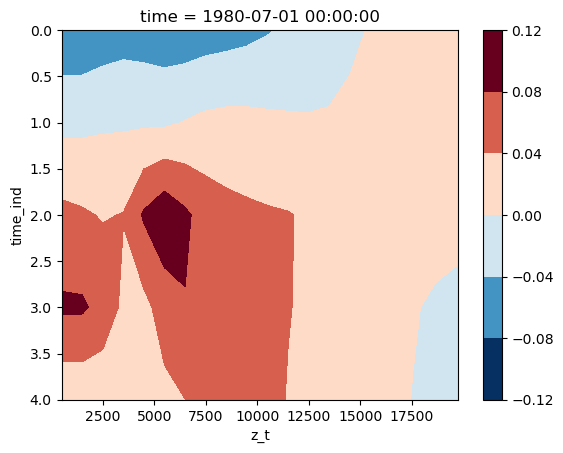

In [73]:
ds_temp_data_5phase_ls[0,:,:].plot.contourf(yincrease=False)

In [ ]:
mld_data_4phase_LU_ls
temp_data_4phase_LU_ls
    
mld_data_4phase_DE_ls
temp_data_4phase_DE_ls
    
mld_data_3phase_ls
temp_data_3phase_ls
    
temp_data_5phase_ls
mld_data_5phase_ls


In [65]:
# SCRATCH Processing
mld_data_4phase_LU_ls = []
temp_data_4phase_LU_ls = []

mld_data_4phase_DE_ls = []
temp_data_4phase_DE_ls = []

mld_data_3phase_ls = []
temp_data_3phase_ls = []

temp_data_5phase_ls = []
mld_data_5phase_ls = []
for i in range(len(linr2_data[4][ens_memb_ind])):
    mhw_ind = linr2_data[4][ens_memb_ind][i]
    print('************')
    first_time = da_mhwobj_labels[ens_memb_ind,:,:,:].where(
    da_mhwobj_labels[ens_memb_ind,:,:,:] == mhw_ind, drop=True).time[0] - xr.coding.cftime_offsets.to_offset("2MS")
    last_time = da_mhwobj_labels[ens_memb_ind,:,:,:].where(
    da_mhwobj_labels[ens_memb_ind,:,:,:] == mhw_ind, drop=True).time[-1] + xr.coding.cftime_offsets.to_offset("2MS")
        
    ssta = da_ssta.sel(ensemble_member=ens_memb_ind).sel(time=slice(first_time, last_time))
    
    blob_region = ssta*smaller_region_mask
    blob_region_nan = xr.where(blob_region == 0., np.nan, blob_region)
    mean_ssta = blob_region_nan.mean(dim=('lat','lon')).compute()

    peak_time = mean_ssta.argmax().item()
    print(peak_time)

    blobs = da_mhwobj_labels.isel(ensemble_member = ens_memb_ind)
    object_count_per_time = (blobs == mhw_ind).sum(dim=['lat', 'lon'])
    true_time_steps = object_count_per_time.time.where(object_count_per_time > 0, drop=True)
            
    one_obj = blobs.sel(time=true_time_steps.time)
    blobs_nan = xr.where(one_obj == mhw_ind, 1., 0.)

    mhw_event_temp_anomalies = anomalies_region_nan.sel(time=slice(first_time, last_time)) * blob_region_nan[0]

    if len(mhw_event_temp_anomalies.time)<=6:
        print('3PHASE')
        temp_data_3phase, mld_data_3phase = calc_vertical_temperature_mld_structure_3_phases(
            peak_time, mhw_event_temp_anomalies, smaller_region_mld, first_time, last_time, blobs_nan)

        mld_data_3phase_ls.append(mld_data_3phase)
        temp_data_3phase_ls.append(temp_data_3phase)
        
    elif peak_time == 3:
        print('4phase LU')
        temp_data_4phase_LU, mld_data_4phase_LU = calc_vertical_temperature_mld_structure_4_fast_leadup_phases(
            peak_time, mhw_event_temp_anomalies, smaller_region_mld, first_time, last_time, blob_region_nan)

        mld_data_4phase_LU_ls.append(mld_data_4phase_LU)
        temp_data_4phase_LU_ls.append(temp_data_4phase_LU)
        
        temp_data_3phase, mld_data_3phase = calc_vertical_temperature_mld_structure_3_phases(
            peak_time, mhw_event_temp_anomalies, smaller_region_mld, first_time, last_time, blobs_nan)

        mld_data_3phase_ls.append(mld_data_3phase)
        temp_data_3phase_ls.append(temp_data_3phase)
    
    elif (peak_time+2) == len(mhw_event_temp_anomalies.time) - 2:
        print('4phase DE')
        temp_data_4phase_DE, mld_data_4phase_DE = calc_vertical_temperature_mld_structure_4_fast_decline_phases(
            peak_time, mhw_event_temp_anomalies, smaller_region_mld, first_time, last_time, blob_region_nan)

        mld_data_4phase_DE_ls.append(mld_data_4phase_DE)
        temp_data_4phase_DE_ls.append(temp_data_4phase_DE)
        
        temp_data_3phase, mld_data_3phase = calc_vertical_temperature_mld_structure_3_phases(
            peak_time, mhw_event_temp_anomalies, smaller_region_mld, first_time, last_time, blobs_nan)

        mld_data_3phase_ls.append(mld_data_3phase)
        temp_data_3phase_ls.append(temp_data_3phase)

    elif len(mhw_event_temp_anomalies.time) > 6: 
        print('5phase')
        temp_data_5phase, mld_data_5phase = calc_vertical_temperature_mld_structure_5_phases(
            peak_time, mhw_event_temp_anomalies, smaller_region_mld, first_time, last_time, blobs_nan)
        temp_data_3phase, mld_data_3phase = calc_vertical_temperature_mld_structure_3_phases(
            peak_time, mhw_event_temp_anomalies, smaller_region_mld, first_time, last_time, blobs_nan)
        
        mld_data_3phase_ls.append(mld_data_3phase)
        mld_data_5phase_ls.append(mld_data_5phase)

        temp_data_5phase_ls.append(temp_data_5phase)
        temp_data_3phase_ls.append(temp_data_3phase)

    
    # # ds_temp_vert = xr.concat(new_combined_ls_new, dim='mhw_event_ind')
    # # filename = '/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens{}.nc'.format(ens_memb_index)
    # # ds_temp_vert.to_netcdf(filename)
    # # print(filename)
    
    # # filename = '/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens{}.npy'.format(ens_memb_index)
    # # np.save(filename, max_temp_depth_ind_ls)
    # # print(filename)
    
    # # filename = '/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens{}.npy'.format(ens_memb_index)
    # # np.save(filename, mld_combined_ls)
    # # print(filename)

************
3
4phase LU
************
21
5phase
************
4
3PHASE


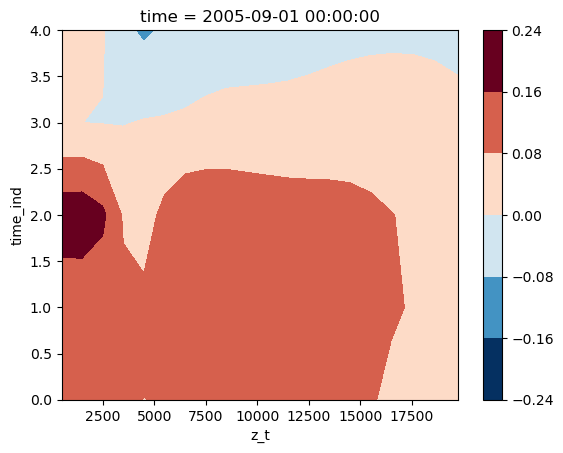

In [67]:
temp_data_5phase.plot.contourf()

In [46]:
mhw_event_temp_anomalies

<xarray.DataArray (time: 6, z_t: 20, lat: 56, lon: 73)> Size: 4MB
dask.array<multiply, shape=(6, 20, 56, 73), dtype=float64, chunksize=(6, 20, 56, 73), chunktype=numpy.ndarray>
Coordinates:
  * z_t      (z_t) float32 80B 500.0 1.5e+03 2.5e+03 ... 1.863e+04 1.977e+04
  * time     (time) object 48B 2004-05-01 00:00:00 ... 2004-10-01 00:00:00
  * lat      (lat) float64 448B 12.72 13.66 14.61 15.55 ... 62.67 63.61 64.55
  * lon      (lon) float64 584B 155.0 156.2 157.5 158.8 ... 242.5 243.8 245.0

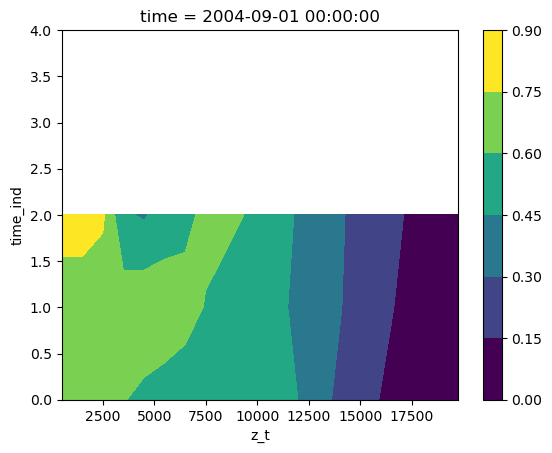

In [41]:
temp_data_5phase.plot.contourf()

In [220]:
# SCRATCH Saving
ds_mld_data_4phase_LU_ls = xr.concat(mld_data_4phase_LU_ls, dim='mhw_event_ind') 
ds_temp_data_4phase_LU_ls = xr.concat(temp_data_4phase_LU_ls, dim='mhw_event_ind') 
ds_mld_data_4phase_DE_ls = xr.concat(mld_data_4phase_DE_ls, dim='mhw_event_ind') 
ds_temp_data_4phase_DE_ls = xr.concat(temp_data_4phase_DE_ls, dim='mhw_event_ind') 

ds_mld_data_3phase_ls = xr.concat(mld_data_3phase_ls, dim='mhw_event_ind') 
ds_temp_data_3phase_ls = xr.concat(temp_data_3phase_ls, dim='mhw_event_ind') 
ds_temp_data_5phase_ls = xr.concat(temp_data_5phase_ls, dim='mhw_event_ind') 
ds_mld_data_5phase_ls = xr.concat(mld_data_5phase_ls, dim='mhw_event_ind') 

filename = '/glade/derecho/scratch/cassiacai/ds_mld_data_4phase_LU_ls{}.nc'.format(ens_memb_ind)
ds_mld_data_4phase_LU_ls.to_netcdf(filename)
print(filename)

filename = '/glade/derecho/scratch/cassiacai/ds_temp_data_4phase_LU_ls{}.nc'.format(ens_memb_ind)
ds_temp_data_4phase_LU_ls.to_netcdf(filename)
print(filename)

filename = '/glade/derecho/scratch/cassiacai/ds_mld_data_4phase_DE_ls{}.nc'.format(ens_memb_ind)
ds_mld_data_4phase_DE_ls.to_netcdf(filename)
print(filename)

filename = '/glade/derecho/scratch/cassiacai/ds_temp_data_4phase_DE_ls{}.nc'.format(ens_memb_ind)
ds_temp_data_4phase_DE_ls.to_netcdf(filename)
print(filename)

filename = '/glade/derecho/scratch/cassiacai/ds_mld_data_3phase_ls{}.nc'.format(ens_memb_ind)
ds_mld_data_3phase_ls.to_netcdf(filename)
print(filename)

filename = '/glade/derecho/scratch/cassiacai/ds_temp_data_3phase_ls{}.nc'.format(ens_memb_ind)
ds_temp_data_3phase_ls.to_netcdf(filename)
print(filename)

filename = '/glade/derecho/scratch/cassiacai/ds_temp_data_5phase_ls{}.nc'.format(ens_memb_ind)
ds_temp_data_5phase_ls.to_netcdf(filename)
print(filename)

filename = '/glade/derecho/scratch/cassiacai/ds_mld_data_5phase_ls{}.nc'.format(ens_memb_ind)
ds_mld_data_5phase_ls.to_netcdf(filename)
print(filename)

In [ ]:
mhw_event_temp_anomalies

In [61]:
def calc_vertical_temperature_mld_structure_5_phases(peak_time, anomalies, smaller_region_mld, first_time, last_time, blob_region_nan):    
    mhw_event_anomalies = anomalies.sel(time=slice(first_time, last_time)) * smaller_region_mask

    pre_mhw_anom = mhw_event_anomalies.isel(time=slice(0,2)).mean(dim=('lat','lon', 'time')).compute()
    lead_up_anom = mhw_event_anomalies.isel(time=slice(2,peak_time)).mean(dim=('lat','lon', 'time')).compute()
    max_sst_anom = mhw_event_anomalies.isel(time=peak_time).mean(dim=('lat','lon')).compute()
    decline_anom = mhw_event_anomalies.isel(time=slice(peak_time+1, -2)).mean(dim=('lat','lon', 'time')).compute()
    post_mhw_anom = mhw_event_anomalies.isel(time=slice(-2, None)).mean(dim=('lat','lon', 'time')).compute()

    mld_event = smaller_region_mld.sel(time=slice(first_time, last_time)) * smaller_region_mask
    
    pre_mhw_mld = mld_event.isel(time=slice(0,2)).mean(dim=('lat','lon', 'time')).compute()
    lead_up_mld = mld_event.isel(time=slice(2,peak_time)).mean(dim=('lat','lon', 'time')).compute()
    max_sst_mld = mld_event.isel(time=peak_time).mean(dim=('lat','lon')).compute()
    decline_mld = mld_event.isel(time=slice(peak_time+1, -2)).mean(dim=('lat','lon', 'time')).compute()
    post_mhw_mld = mld_event.isel(time=slice(-2, None)).mean(dim=('lat','lon', 'time')).compute()

    temp_anomalies_dataxr = [pre_mhw_anom, lead_up_anom, max_sst_anom, decline_anom, post_mhw_anom]
    mld_anomalies_dataxr = [pre_mhw_mld, lead_up_mld, max_sst_mld, decline_mld, post_mhw_mld]

    temp_data = xr.concat(temp_anomalies_dataxr, dim='time_ind')
    mld_data = xr.concat(mld_anomalies_dataxr, dim='time_ind')

    return temp_data, mld_data

In [62]:
def calc_vertical_temperature_mld_structure_4_fast_decline_phases(peak_time, anomalies, smaller_region_mld, first_time, last_time, blob_region_nan):    
    mhw_event_anomalies = anomalies.sel(time=slice(first_time, last_time)) * smaller_region_mask

    pre_mhw_anom = mhw_event_anomalies.isel(time=slice(0,2)).mean(dim=('lat','lon', 'time')).compute()
    lead_up_anom = mhw_event_anomalies.isel(time=slice(2,peak_time)).mean(dim=('lat','lon', 'time')).compute()
    max_sst_anom = mhw_event_anomalies.isel(time=peak_time).mean(dim=('lat','lon')).compute()
    post_mhw_anom = mhw_event_anomalies.isel(time=slice(-2, None)).mean(dim=('lat','lon', 'time')).compute()

    mld_event = smaller_region_mld.sel(time=slice(first_time, last_time)) * smaller_region_mask
    
    pre_mhw_mld = mld_event.isel(time=slice(0,2)).mean(dim=('lat','lon', 'time')).compute()
    lead_up_mld = mld_event.isel(time=slice(2,peak_time)).mean(dim=('lat','lon', 'time')).compute()
    max_sst_mld = mld_event.isel(time=peak_time).mean(dim=('lat','lon')).compute()
    post_mhw_mld = mld_event.isel(time=slice(-2, None)).mean(dim=('lat','lon', 'time')).compute()

    temp_anomalies_dataxr = [pre_mhw_anom, lead_up_anom, max_sst_anom, post_mhw_anom]
    mld_anomalies_dataxr = [pre_mhw_mld, lead_up_mld, max_sst_mld, post_mhw_mld]

    temp_data = xr.concat(temp_anomalies_dataxr, dim='time_ind')
    mld_data = xr.concat(mld_anomalies_dataxr, dim='time_ind')

    return temp_data, mld_data

In [63]:
def calc_vertical_temperature_mld_structure_4_fast_leadup_phases(peak_time, anomalies, smaller_region_mld, first_time, last_time, blob_region_nan):    
    mhw_event_anomalies = anomalies.sel(time=slice(first_time, last_time)) * smaller_region_mask

    pre_mhw_anom = mhw_event_anomalies.isel(time=slice(0,2)).mean(dim=('lat','lon', 'time')).compute()
    max_sst_anom = mhw_event_anomalies.isel(time=peak_time).mean(dim=('lat','lon')).compute()
    decline_anom = mhw_event_anomalies.isel(time=slice(peak_time+1, -1)).mean(dim=('lat','lon', 'time')).compute()
    post_mhw_anom = mhw_event_anomalies.isel(time=slice(-2, None)).mean(dim=('lat','lon', 'time')).compute()

    mld_event = smaller_region_mld.sel(time=slice(first_time, last_time)) * smaller_region_mask
    
    pre_mhw_mld = mld_event.isel(time=slice(0,2)).mean(dim=('lat','lon', 'time')).compute()
    max_sst_mld = mld_event.isel(time=peak_time).mean(dim=('lat','lon')).compute()
    decline_mld = mld_event.isel(time=slice(peak_time+1, -1)).mean(dim=('lat','lon', 'time')).compute()
    post_mhw_mld = mld_event.isel(time=slice(-2, None)).mean(dim=('lat','lon', 'time')).compute()

    temp_anomalies_dataxr = [pre_mhw_anom, max_sst_anom, decline_anom, post_mhw_anom]
    mld_anomalies_dataxr = [pre_mhw_mld, max_sst_mld, decline_mld, post_mhw_mld]

    temp_data = xr.concat(temp_anomalies_dataxr, dim='time_ind')
    mld_data = xr.concat(mld_anomalies_dataxr, dim='time_ind')

    return temp_data, mld_data

In [64]:
def calc_vertical_temperature_mld_structure_3_phases(peak_time, anomalies, smaller_region_mld, first_time, last_time, blob_region_nan):    
    mhw_event_anomalies = anomalies.sel(time=slice(first_time, last_time)) * smaller_region_mask

    pre_mhw_anom = mhw_event_anomalies.isel(time=slice(0,2)).mean(dim=('lat','lon', 'time')).compute()
    duration_anom = mhw_event_anomalies.isel(time=slice(2,-2)).mean(dim=('lat','lon', 'time')).compute()
    post_mhw_anom = mhw_event_anomalies.isel(time=slice(-2, None)).mean(dim=('lat','lon', 'time')).compute()

    mld_event = smaller_region_mld.sel(time=slice(first_time, last_time)) * smaller_region_mask
    
    pre_mhw_mld = mld_event.isel(time=slice(0,2)).mean(dim=('lat','lon', 'time')).compute()
    duration_mld = mld_event.isel(time=slice(2,-2)).mean(dim=('lat','lon', 'time')).compute()
    post_mhw_mld = mld_event.isel(time=slice(-2, None)).mean(dim=('lat','lon', 'time')).compute()

    temp_anomalies_dataxr = [pre_mhw_anom, duration_anom, post_mhw_anom]
    mld_anomalies_dataxr = [pre_mhw_mld, duration_mld, post_mhw_mld]

    temp_data = xr.concat(temp_anomalies_dataxr, dim='time_ind')
    mld_data = xr.concat(mld_anomalies_dataxr, dim='time_ind')

    return temp_data, mld_data

In [124]:
# get the MHW event
mhw_ind_obj_id =8.0
blobs = da_mhwobj_labels.isel(ensemble_member = ens_memb_index)
object_count_per_time = (blobs == mhw_ind_obj_id).sum(dim=['lat', 'lon'])
true_time_steps = object_count_per_time.time.where(object_count_per_time > 0, drop=True)
        
one_obj = blobs.sel(time=true_time_steps.time)
blobs_nan = xr.where(one_obj == mhw_ind_obj_id, 1., 0.)

In [36]:
def calc_vertical_temp_mld_structure(anomalies, blobs_nan, smaller_region_mld):
    anomalies_depth = []
    mld_depth = []
    for i in [-2, -1]:
        time_index = 0
        tmin1_anomalies = anomalies.shift(time=i).sel(time=blobs_nan.time[time_index].item())* blobs_nan[0]
        anomalies_in_region_nan = xr.where(tmin1_anomalies == 0., np.nan, tmin1_anomalies)
        anomalies_depth.append(anomalies_in_region_nan.mean(dim=('lat','lon')))
        
        mld_sel = smaller_region_mld.shift(time=i).sel(time=blobs_nan.time[time_index].item())* blobs_nan[0]
        mld_val = xr.where(mld_sel == 0., np.nan, mld_sel).mean()/100
        mld_depth.append(mld_val.item())
        
    for time_index in range(len(true_time_steps)):
        anomalies_in_region = anomalies.sel(time=blobs_nan.time[time_index].item()) * blobs_nan[time_index]
        anomalies_in_region_nan = xr.where(anomalies_in_region == 0., np.nan, anomalies_in_region)
        anomalies_depth.append(anomalies_in_region_nan.mean(dim=('lat','lon')))
        mld_sel = smaller_region_mld.shift(time=i).sel(time=blobs_nan.time[time_index].item())* blobs_nan[time_index]
        mld_val = xr.where(mld_sel == 0., np.nan, mld_sel).mean()/100
        mld_depth.append(mld_val.item())
        
    for i in [1, 2]:
        time_index = len(blobs_nan.time)-1
        tmin1_anomalies = anomalies.shift(time=i).sel(time=blobs_nan.time[time_index].item())* blobs_nan[time_index]
        anomalies_in_region_nan = xr.where(tmin1_anomalies == 0., np.nan, tmin1_anomalies)
        anomalies_depth.append(anomalies_in_region_nan.mean(dim=('lat','lon')))
        mld_sel = smaller_region_mld.shift(time=i).sel(time=blobs_nan.time[time_index].item())* blobs_nan[time_index]
        mld_val = xr.where(mld_sel == 0., np.nan, mld_sel).mean()/100
        mld_depth.append(mld_val.item())

    temp_anomalies = xr.concat(anomalies_depth, dim='time_ind')
    return mld_depth

    return temp_anomalies, new_combined, mld_combined

52


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


45.0
0


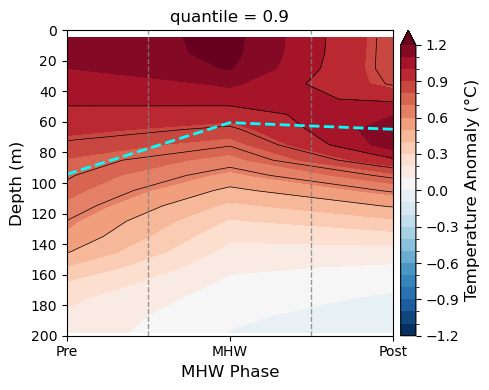

59.0
0


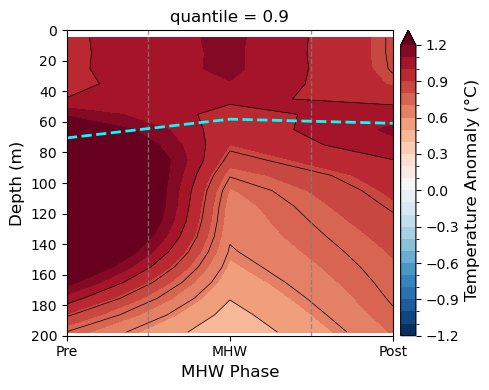

81.0
1


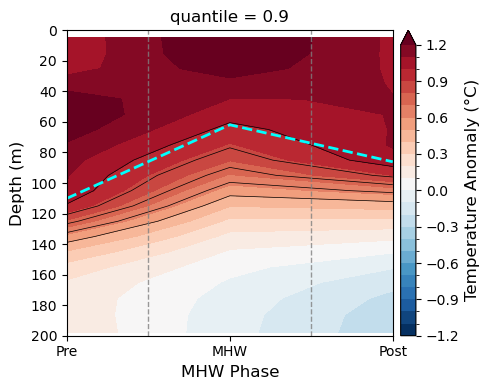

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens52.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens52.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens52.npy
53


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


40.0
0


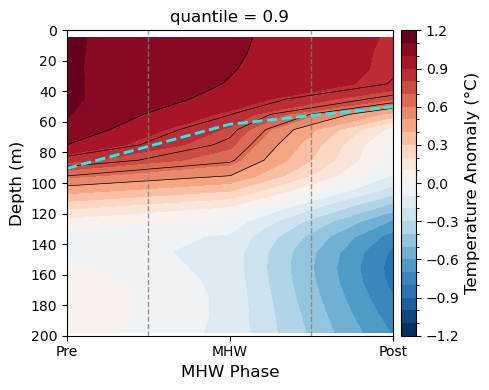

62.0
0


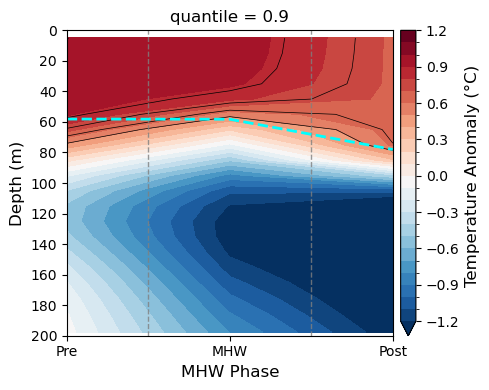

63.0
6


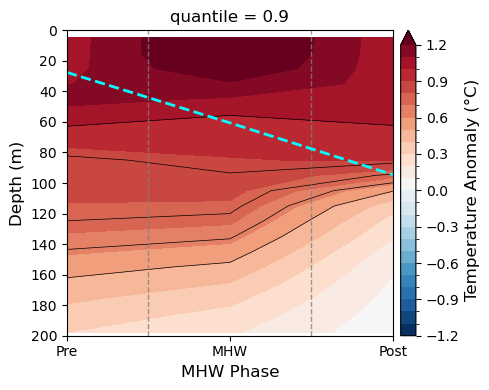

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens53.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens53.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens53.npy
54


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


10.0
0


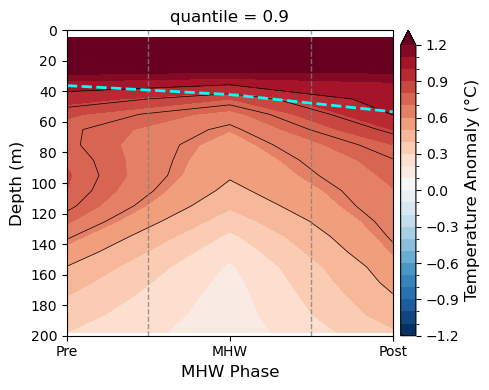

15.0
0


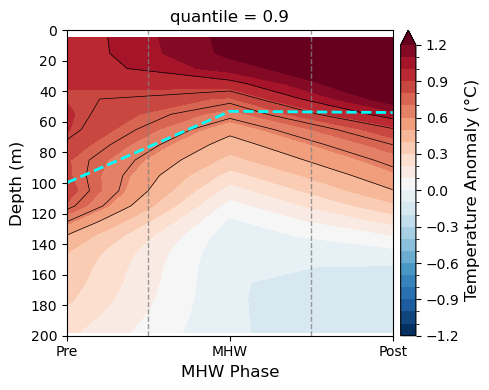

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens54.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens54.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens54.npy
55


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


5.0
3


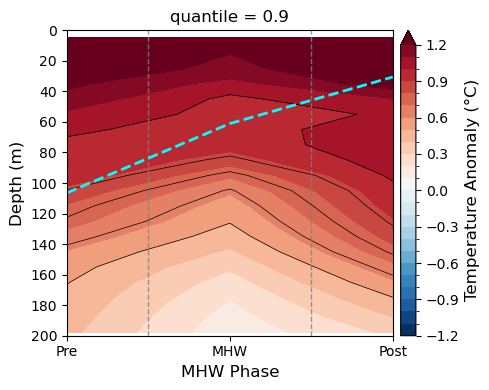

10.0
7


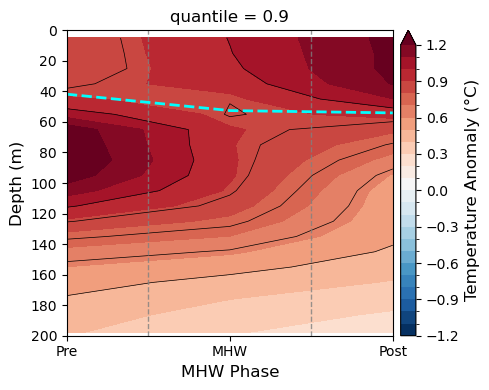

90.0
4


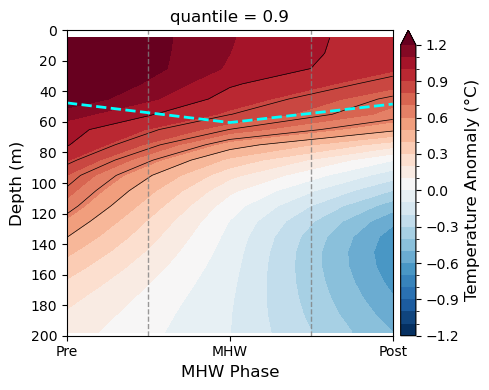

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens55.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens55.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens55.npy
56


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


1.0
6


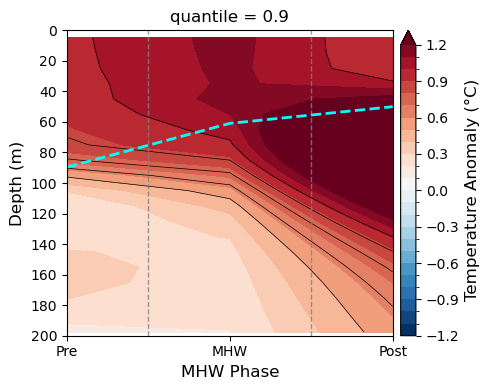

37.0
4


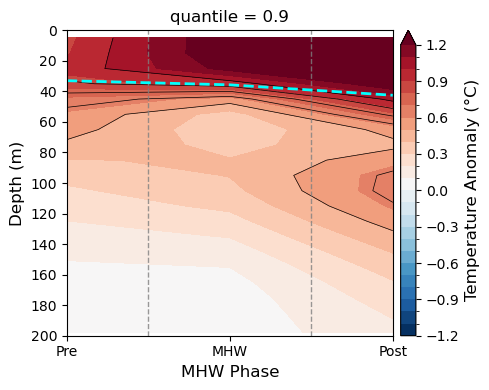

84.0
0


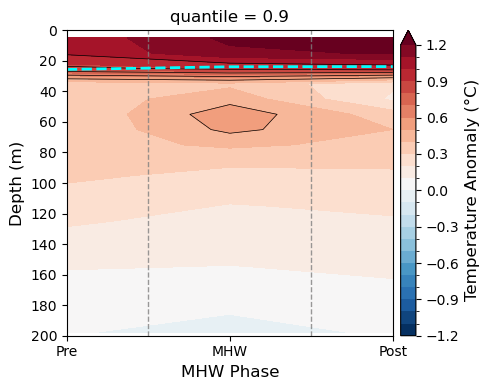

93.0
6


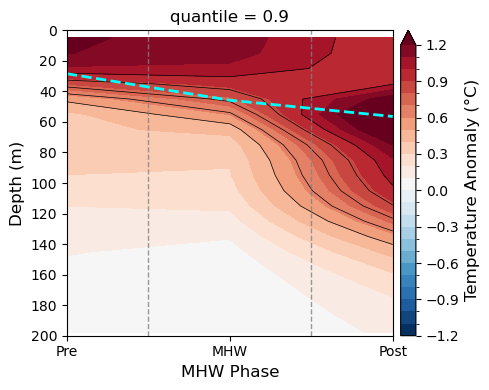

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens56.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens56.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens56.npy
57


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


1.0
0


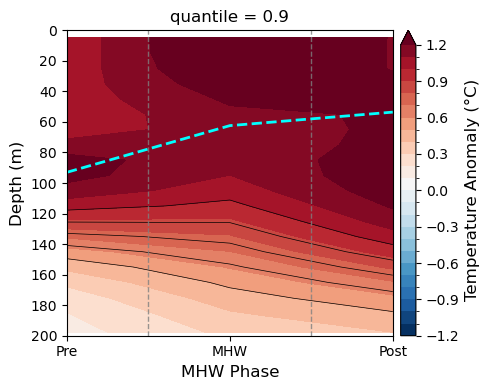

30.0
5


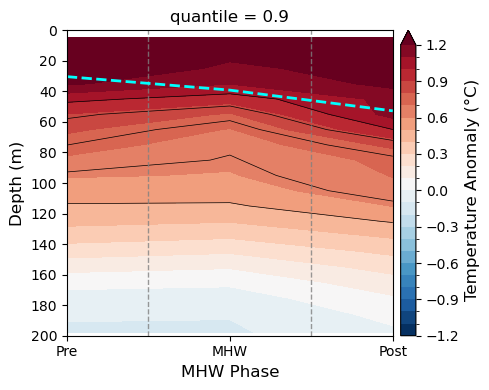

63.0
5


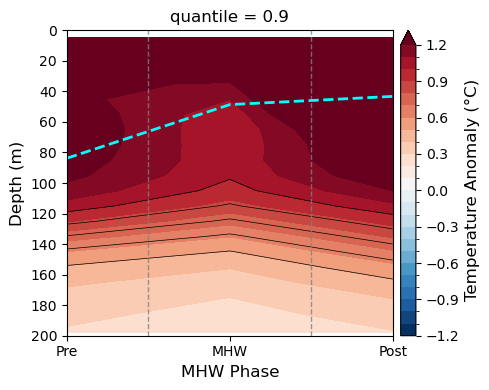

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens57.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens57.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens57.npy
58


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


23.0
3


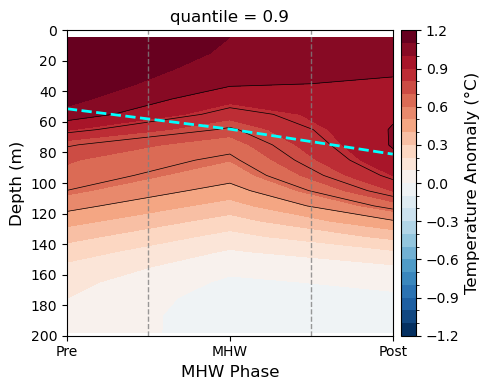

75.0
0


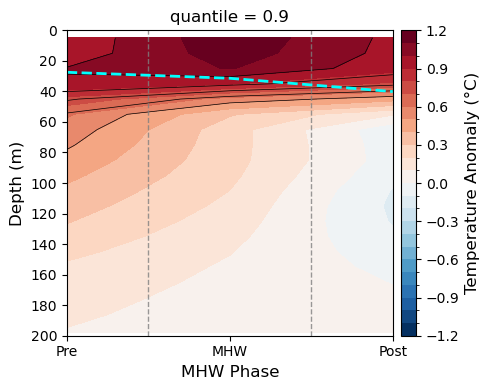

81.0
8


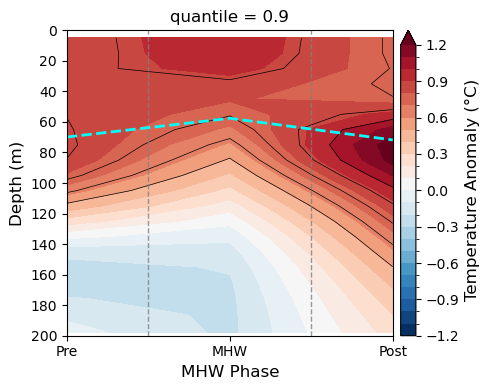

95.0
0


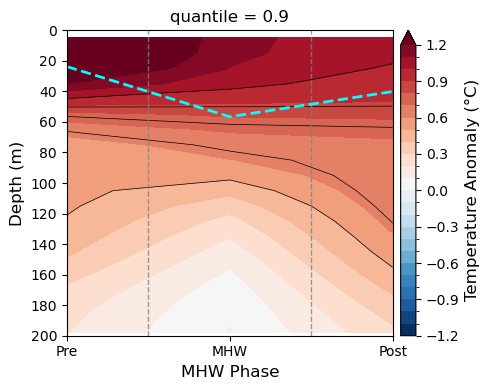

96.0
7


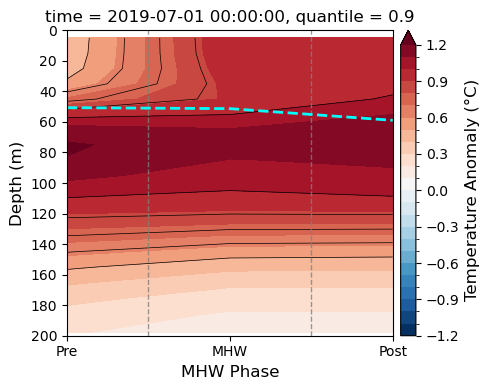

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens58.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens58.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens58.npy
59


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


7.0
5


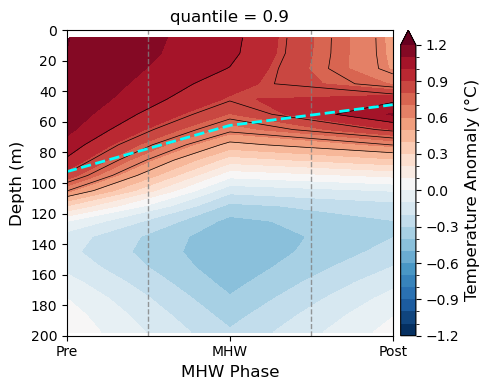

59.0
0


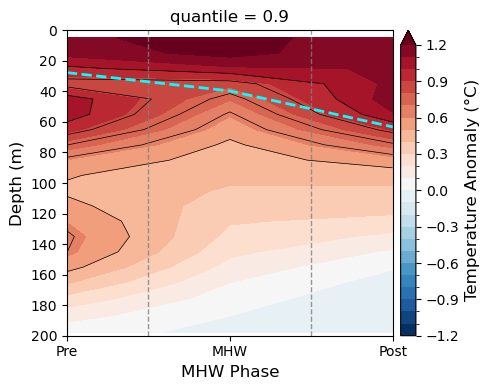

69.0
7


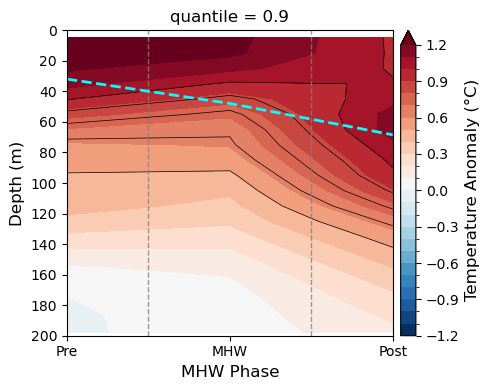

92.0
2


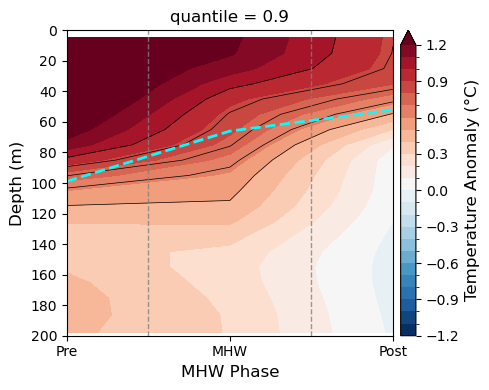

93.0
0


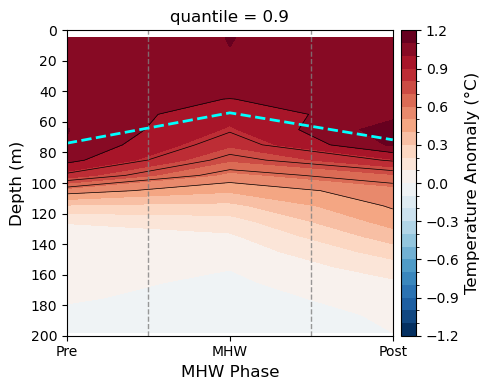

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens59.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens59.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens59.npy
60


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


2.0
10


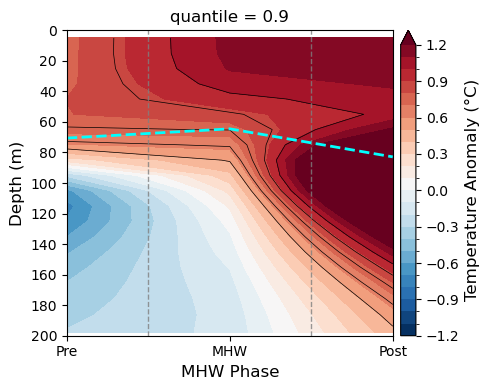

12.0
0


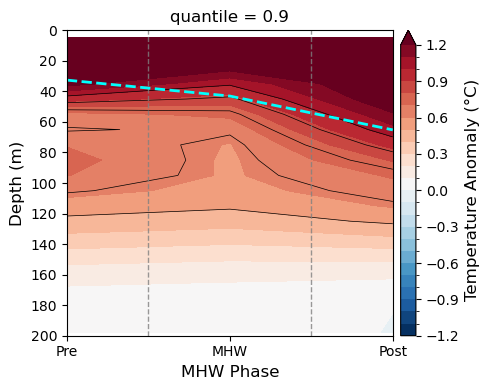

33.0
9


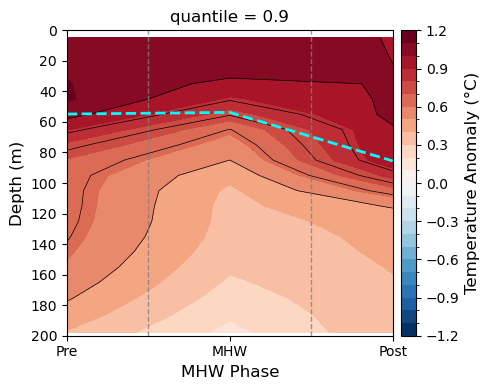

62.0
1


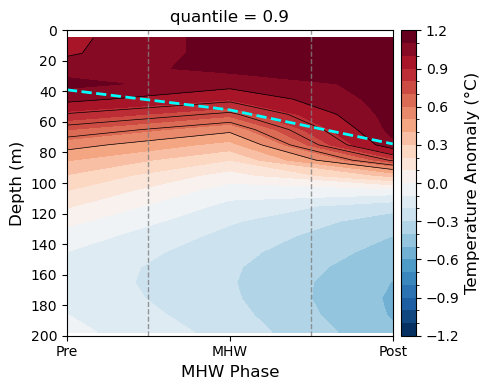

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens60.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens60.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens60.npy
61


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


68.0
8


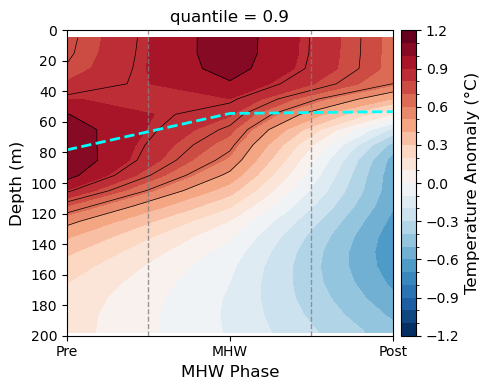

82.0
6


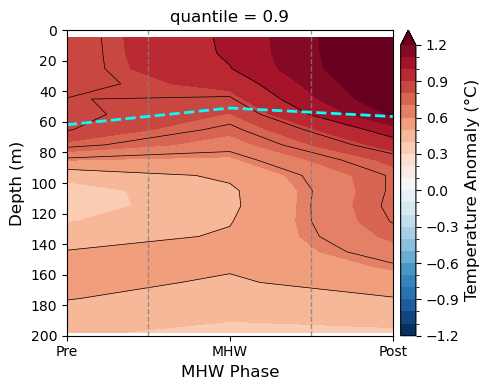

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens61.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens61.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens61.npy
62


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


66.0
3


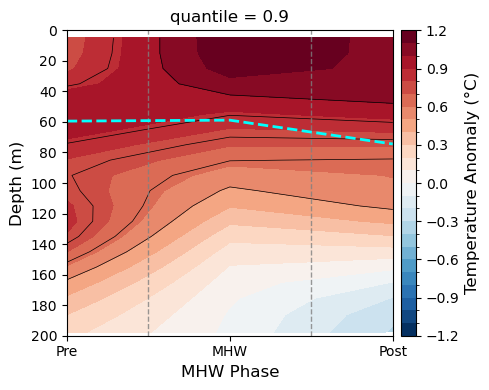

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens62.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens62.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens62.npy
63


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


89.0
0


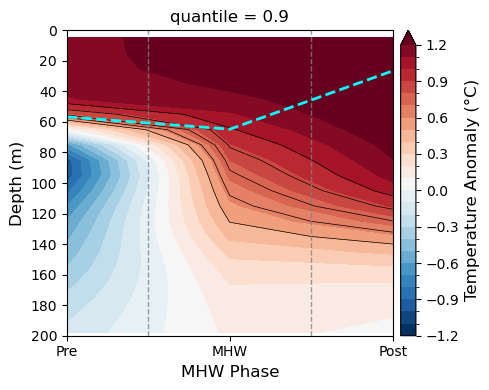

98.0
8


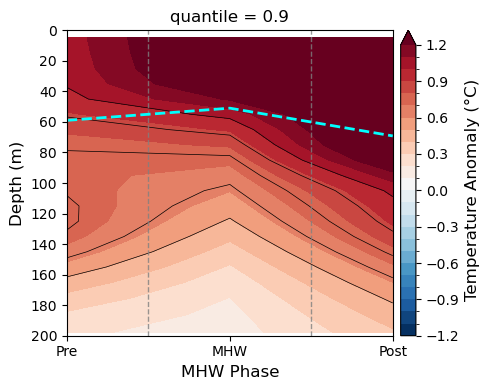

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens63.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens63.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens63.npy
64


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


54.0
0


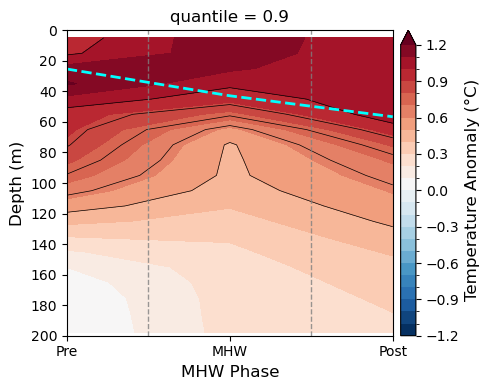

56.0
2


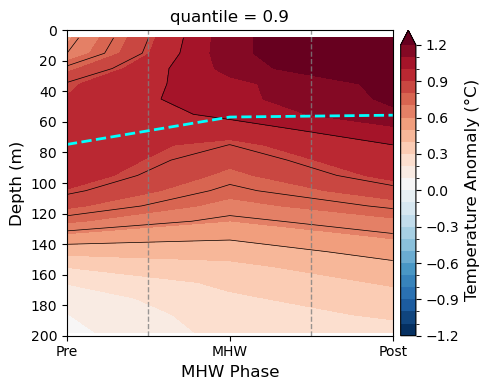

92.0
0


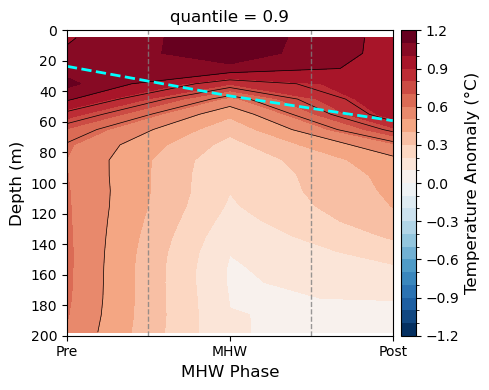

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens64.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens64.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens64.npy
65


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


8.0
2


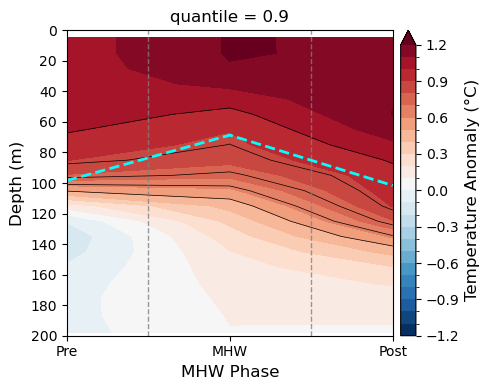

100.0
4


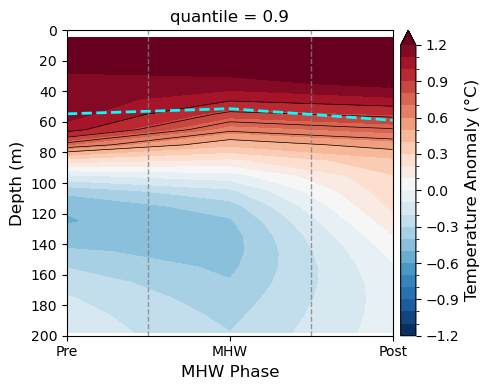

101.0
0


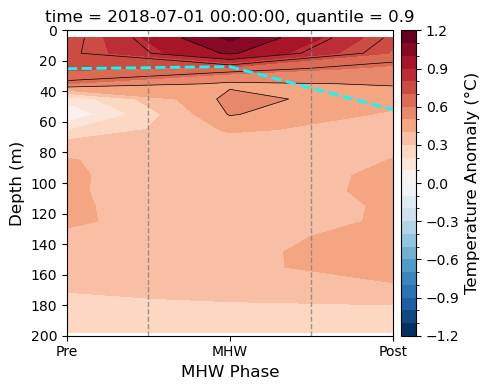

103.0
4


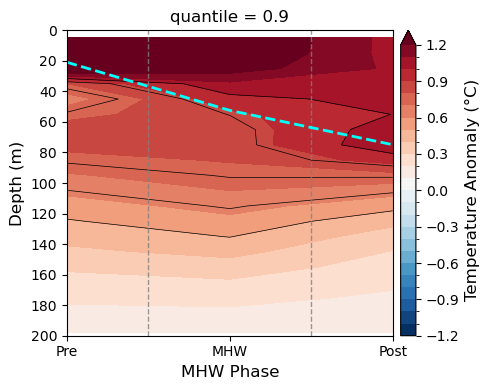

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens65.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens65.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens65.npy
66


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


16.0
4


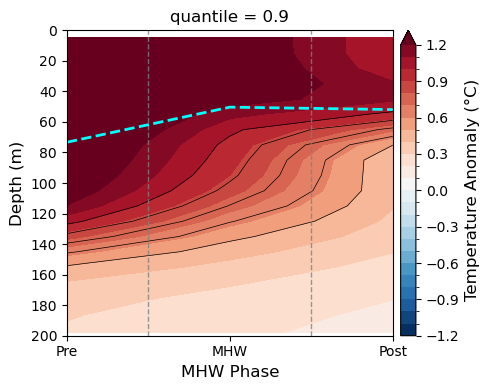

18.0
10


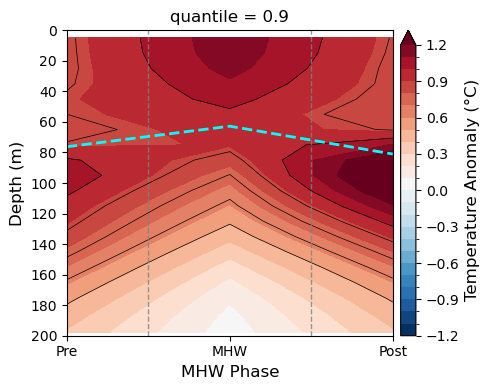

41.0
5


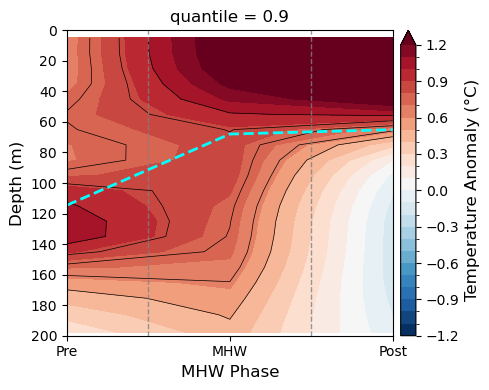

42.0
4


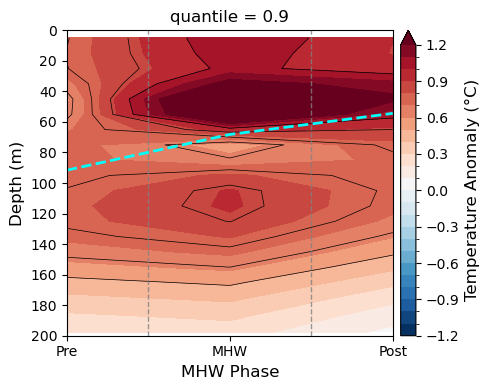

56.0
9


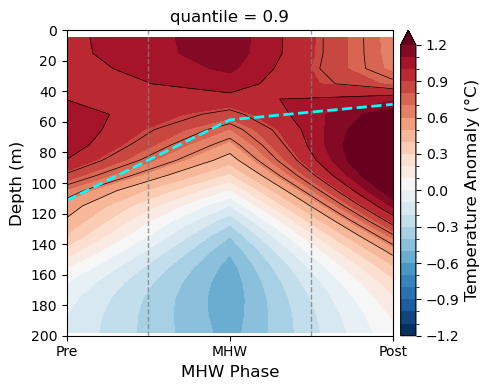

77.0
3


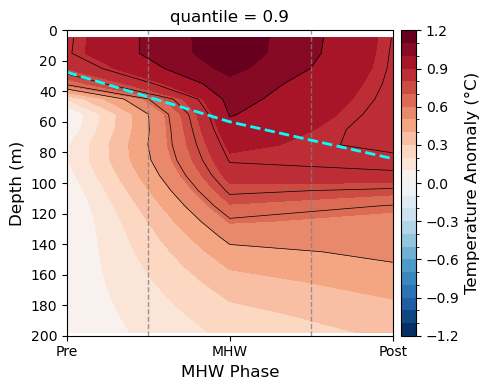

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens66.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens66.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens66.npy
67


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


1.0
0


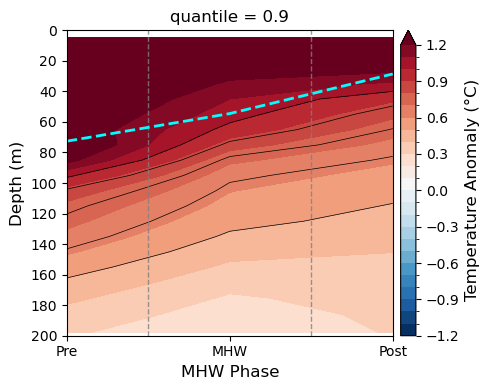

69.0
9


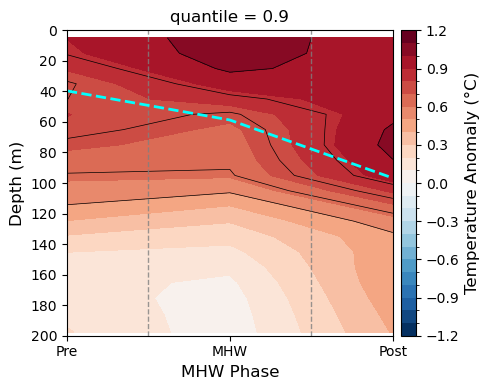

70.0
0


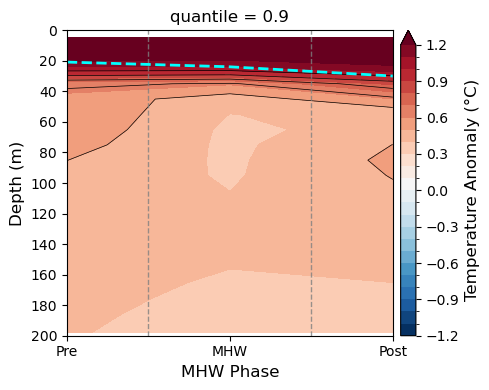

72.0
7


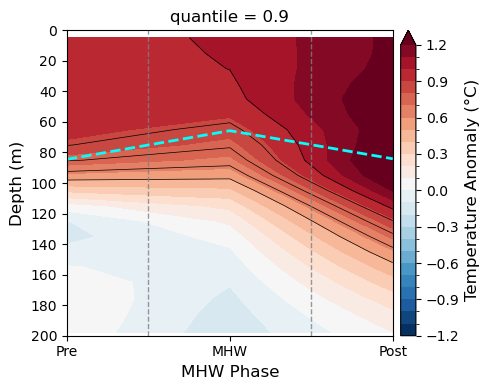

73.0
3


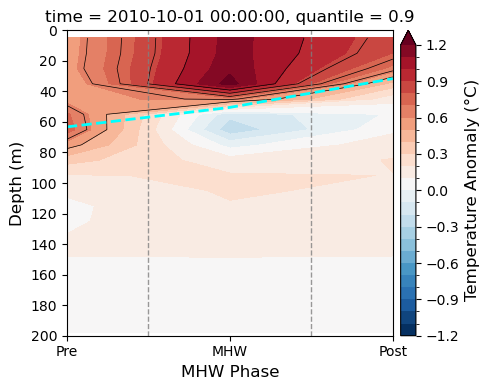

80.0
0


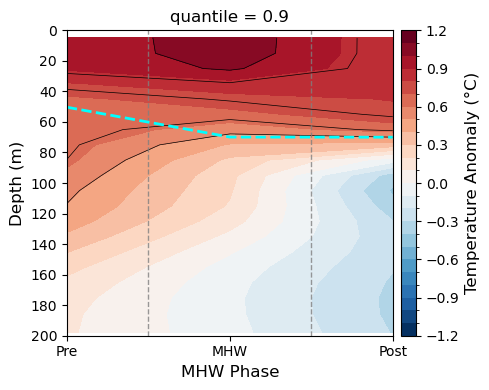

85.0
0


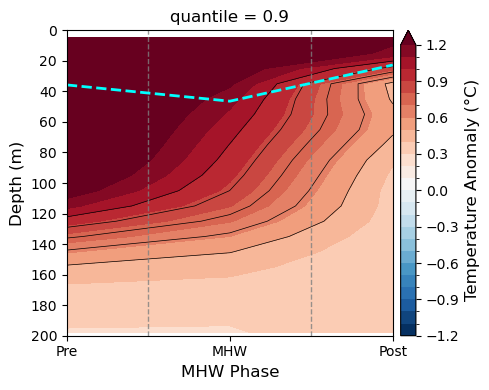

88.0
7


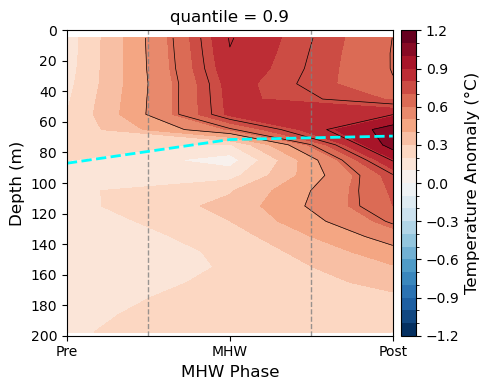

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens67.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens67.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens67.npy
68


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


29.0
0


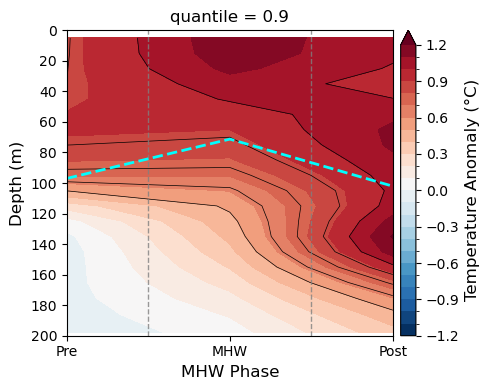

74.0
4


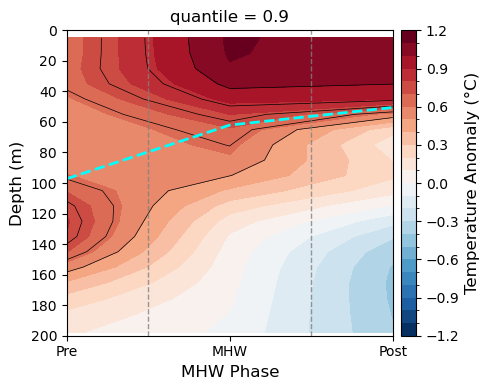

84.0
0


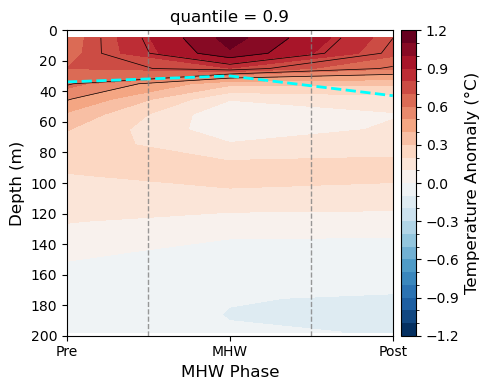

94.0
7


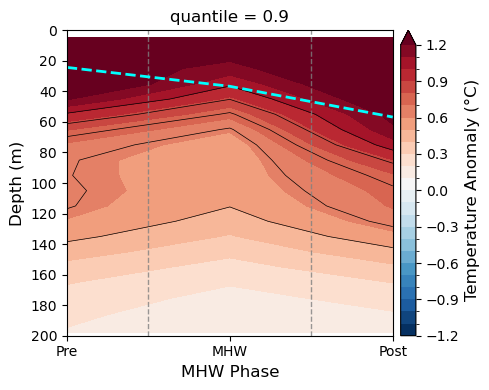

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens68.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens68.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens68.npy
69


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


55.0
0


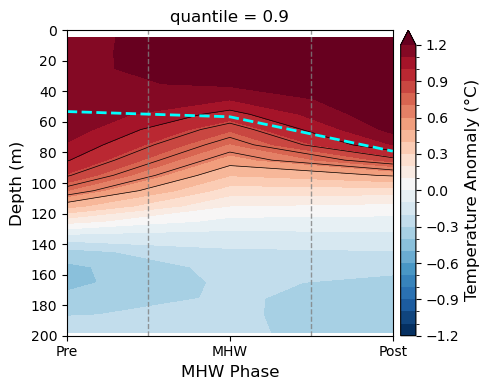

56.0
2


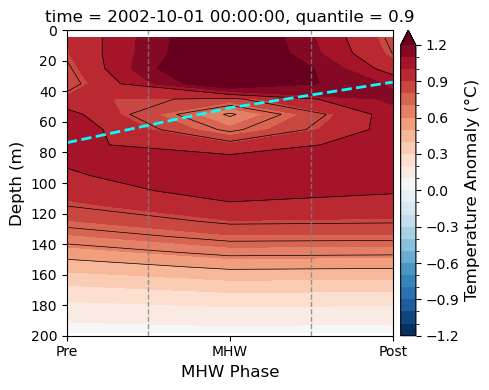

58.0
0


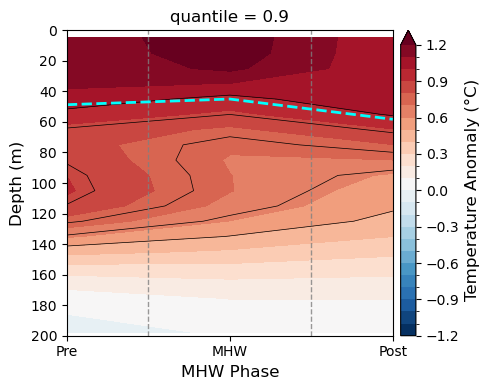

65.0
8


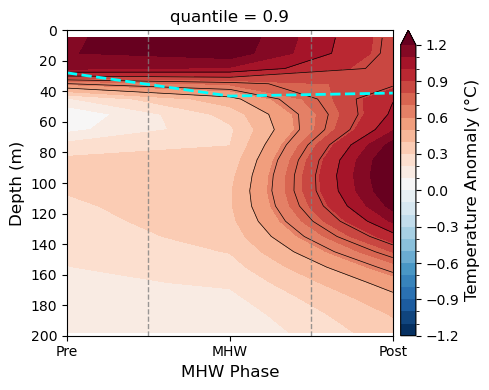

76.0
0


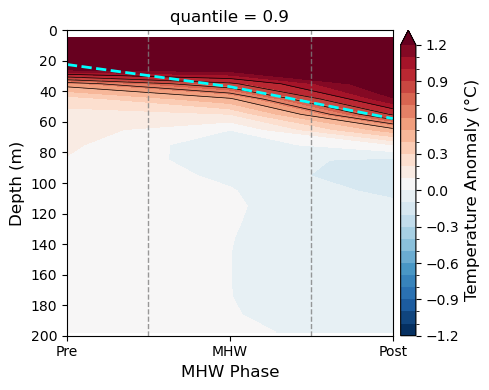

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens69.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens69.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens69.npy
70


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


23.0
2


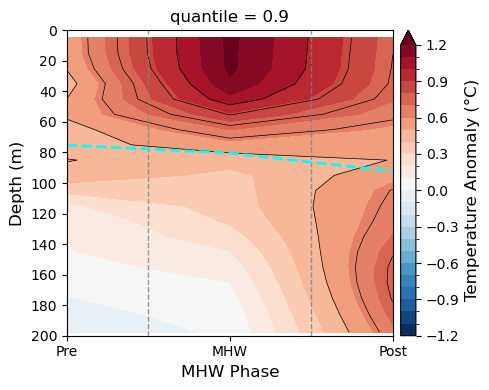

32.0
6


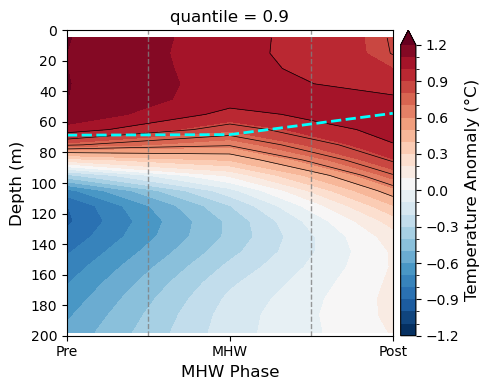

33.0
0


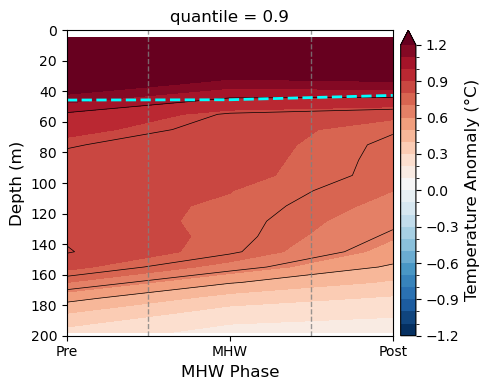

58.0
0


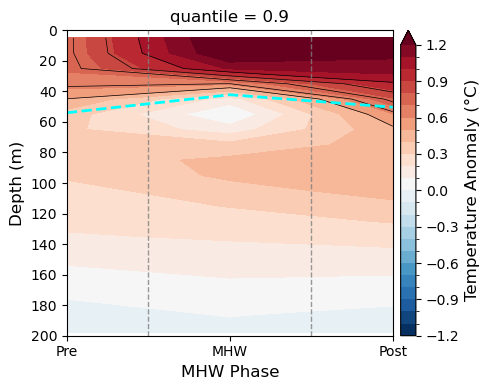

72.0
0


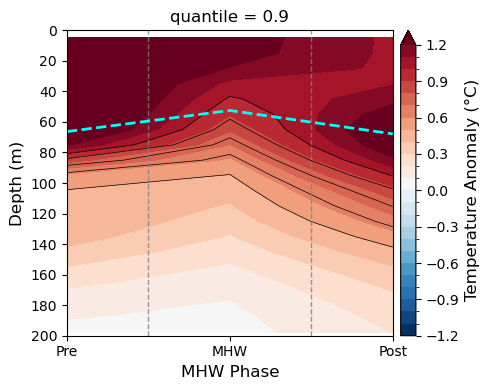

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens70.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens70.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens70.npy
71


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


38.0
0


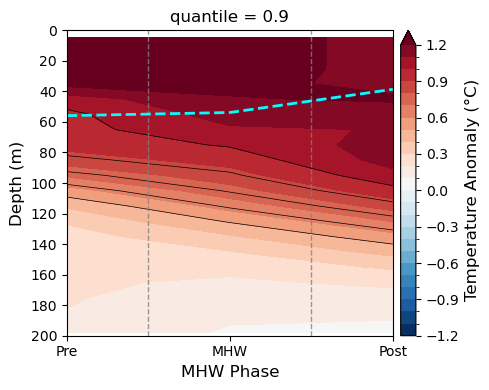

40.0
0


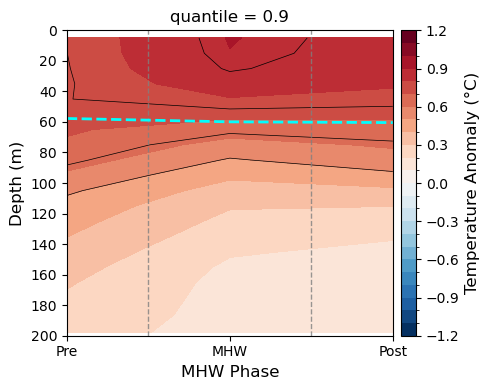

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens71.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens71.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens71.npy
72


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


13.0
0


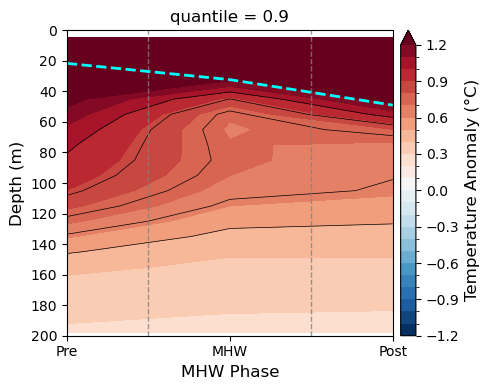

38.0
0


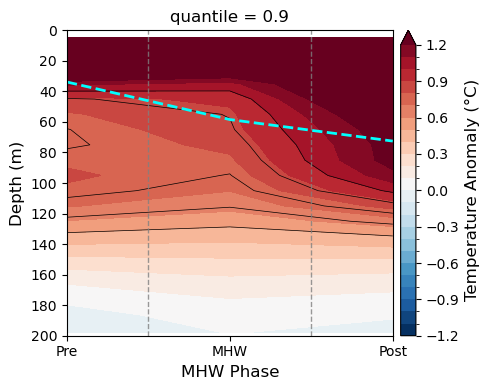

68.0
2


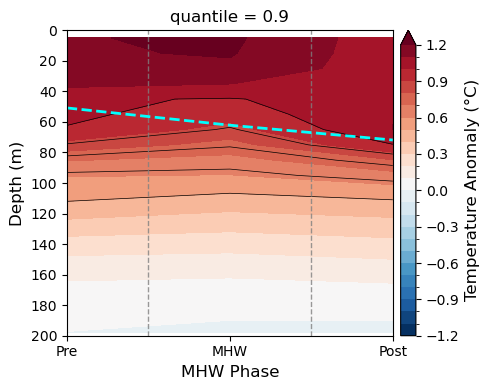

69.0
3


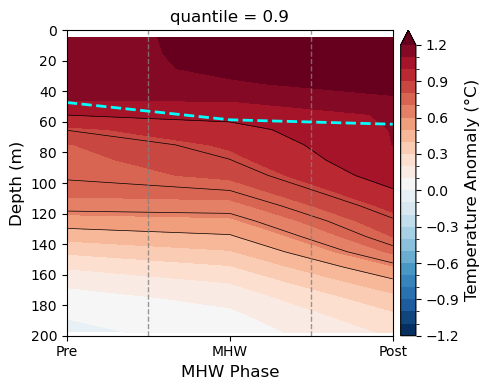

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens72.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens72.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens72.npy
73


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


26.0
0


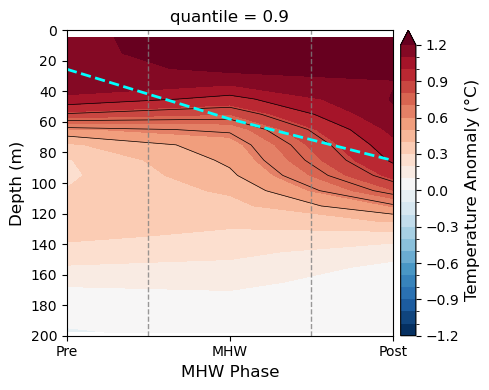

61.0
0


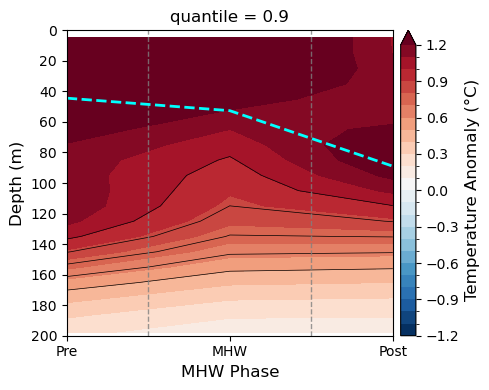

66.0
1


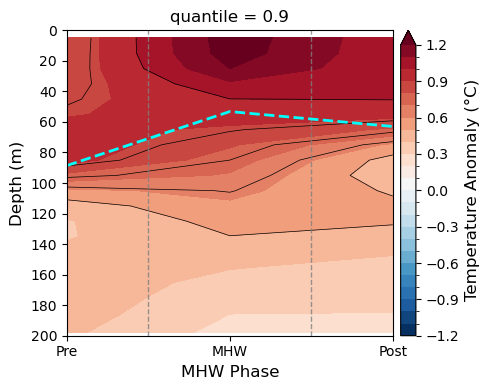

67.0
2


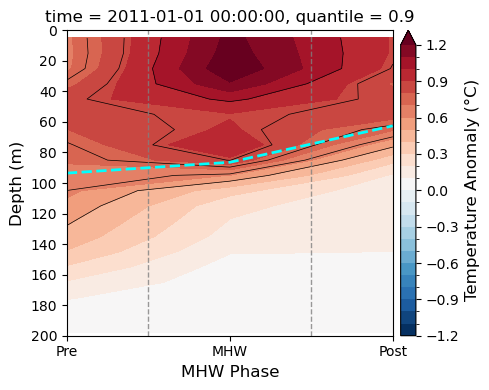

80.0
5


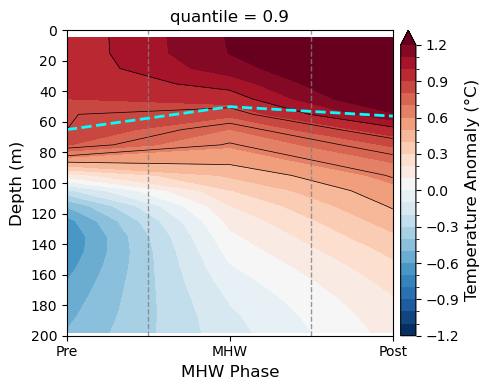

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens73.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens73.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens73.npy
74


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


1.0
0


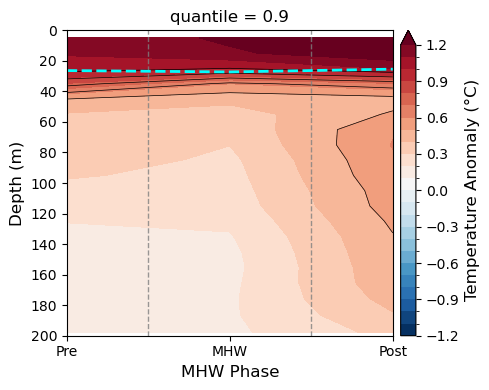

52.0
0


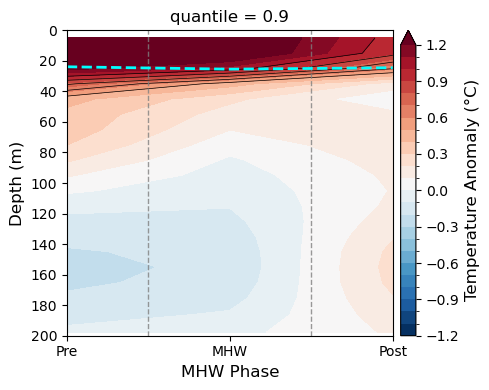

74.0
5


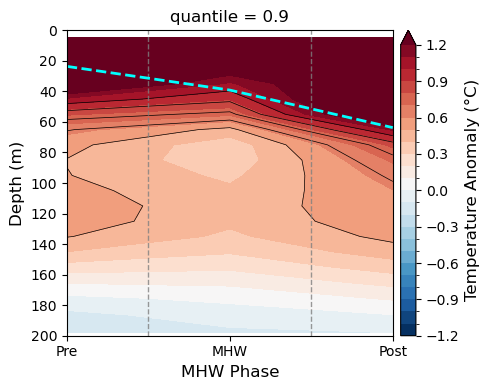

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens74.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens74.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens74.npy
75


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


1.0
5


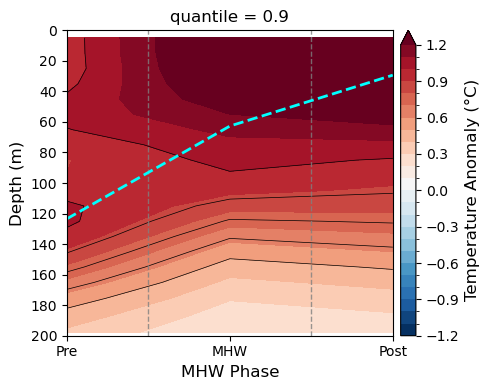

65.0
5


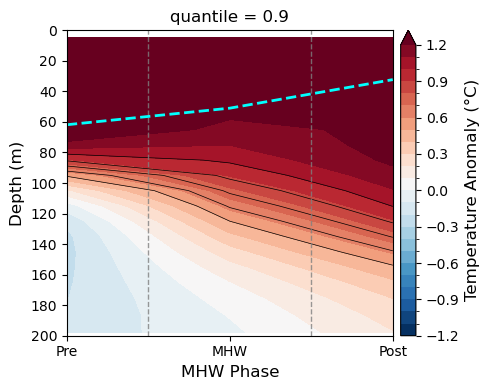

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens75.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens75.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens75.npy
76


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


31.0
0


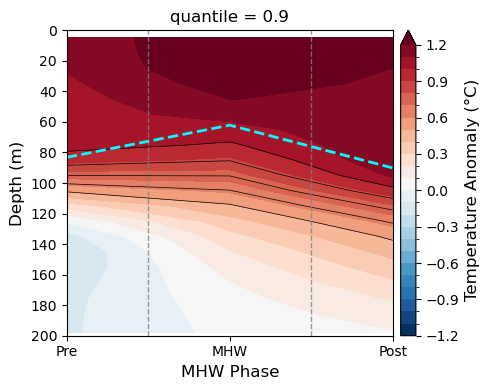

46.0
5


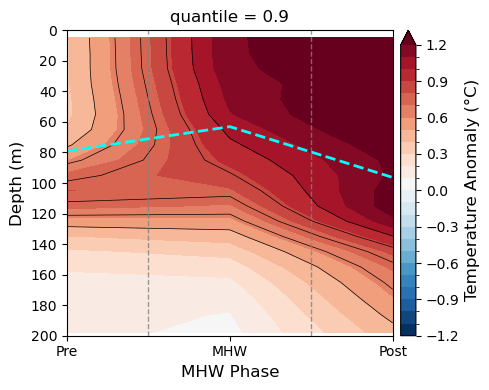

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens76.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens76.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens76.npy
77


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


1.0
12


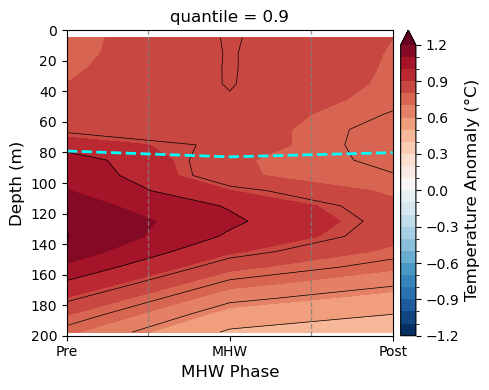

2.0
4


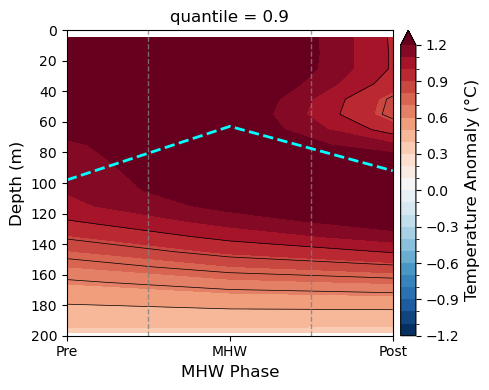

3.0
0


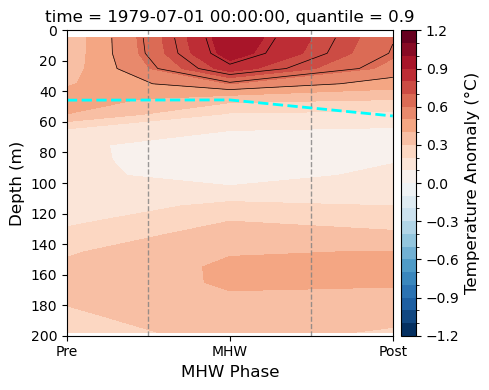

62.0
7


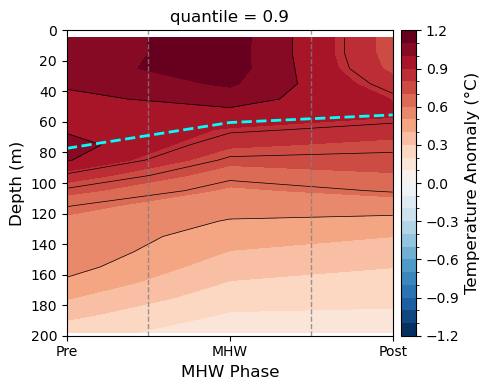

66.0
0


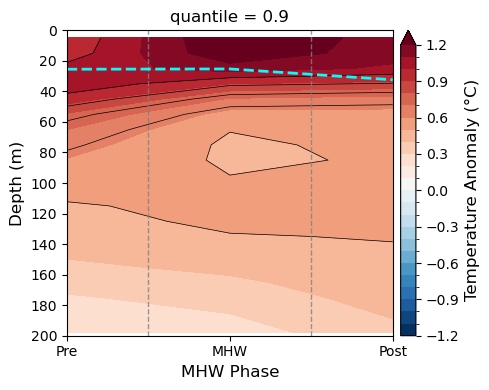

67.0
5


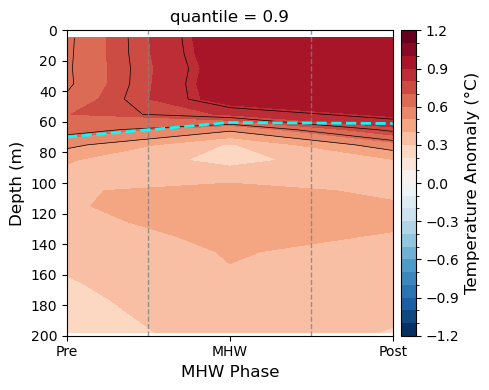

85.0
0


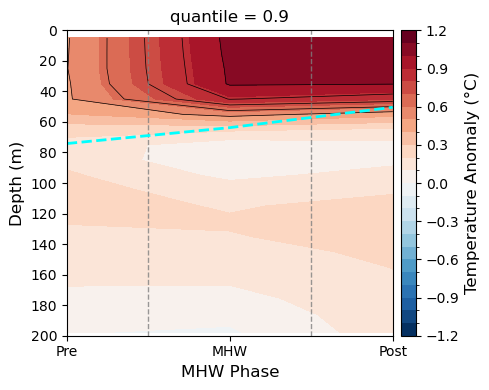

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens77.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens77.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens77.npy
78


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


3.0
8


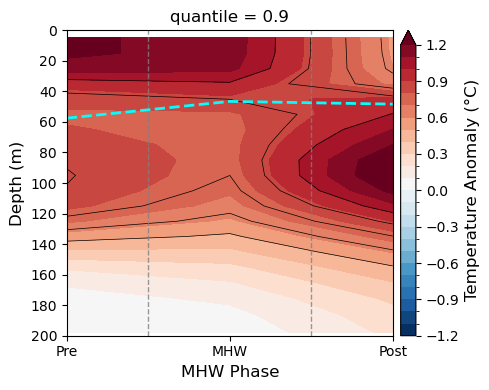

10.0
1


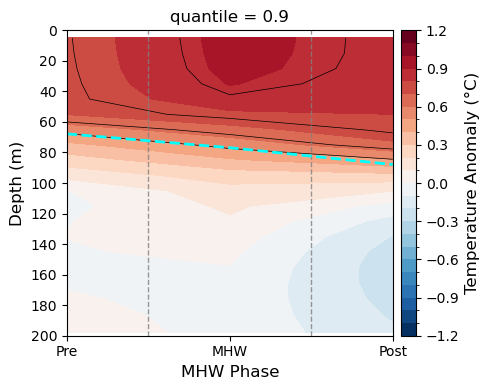

14.0
0


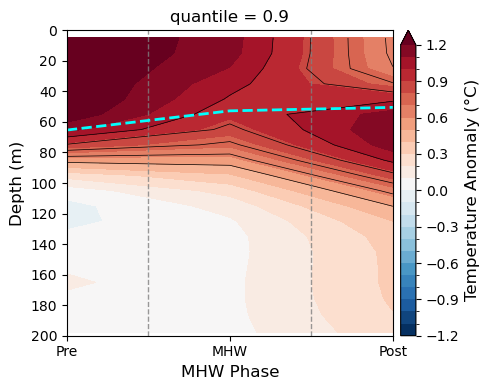

63.0
0


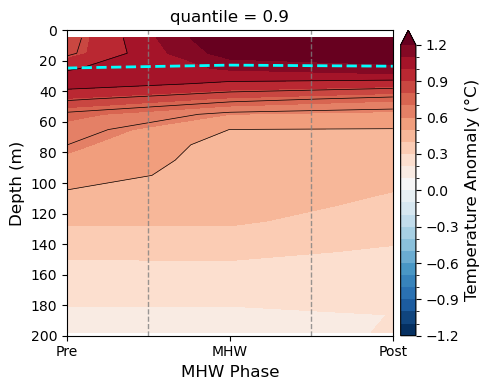

64.0
0


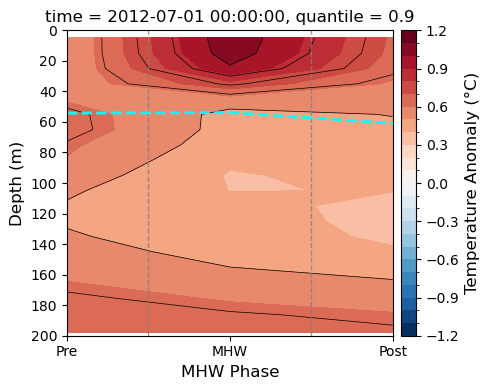

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens78.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens78.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens78.npy
79


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


46.0
10


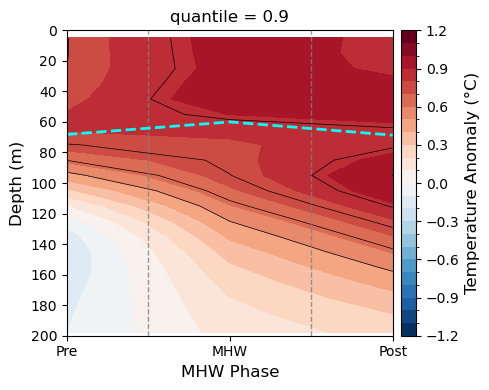

48.0
0


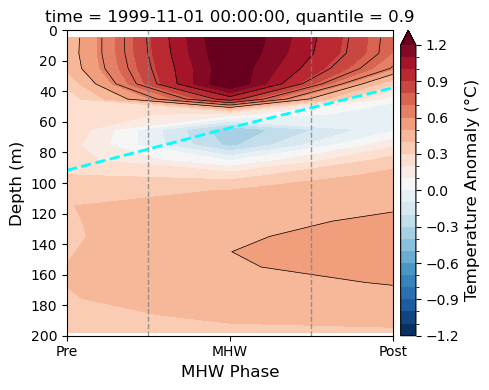

79.0
5


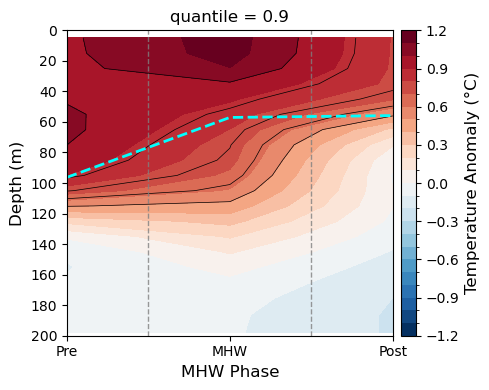

94.0
0


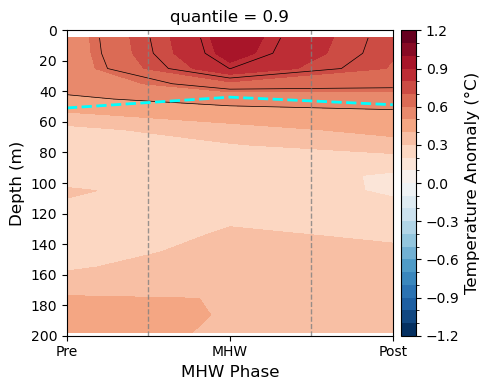

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens79.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens79.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens79.npy
80


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


4.0
0


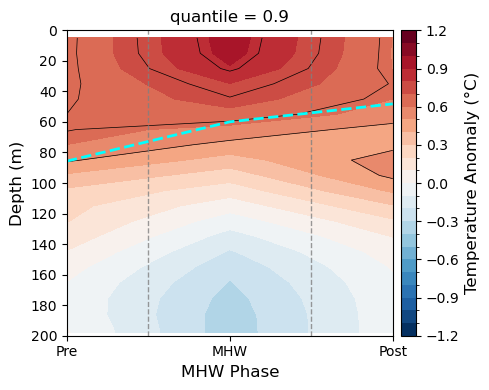

36.0
0


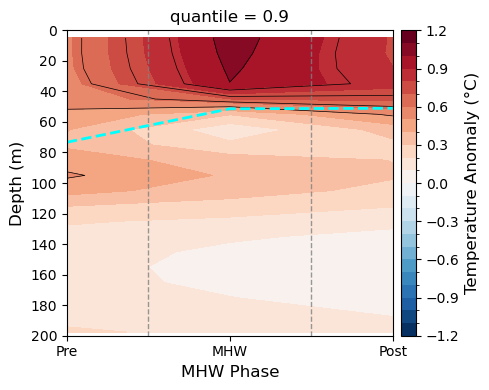

68.0
0


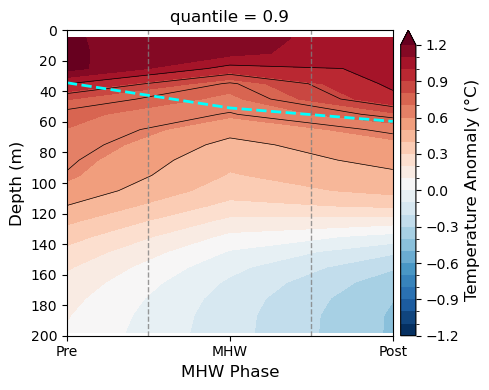

98.0
5


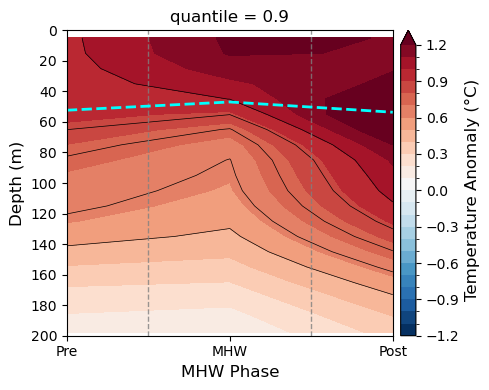

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens80.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens80.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens80.npy
81


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


14.0
0


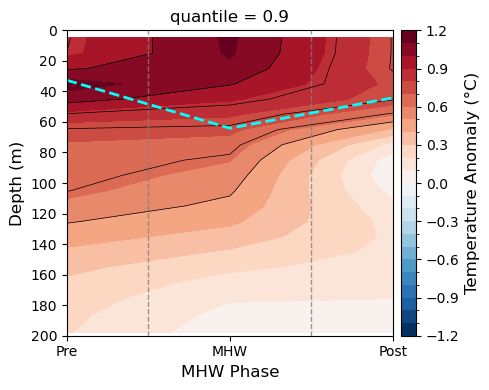

30.0
9


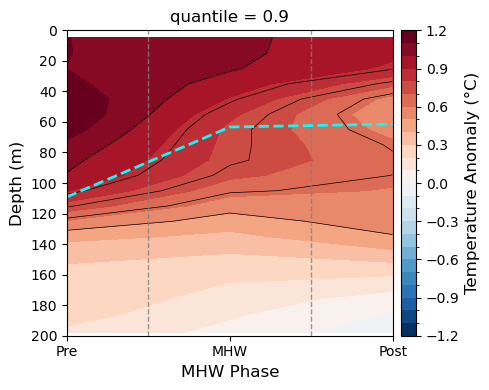

37.0
9


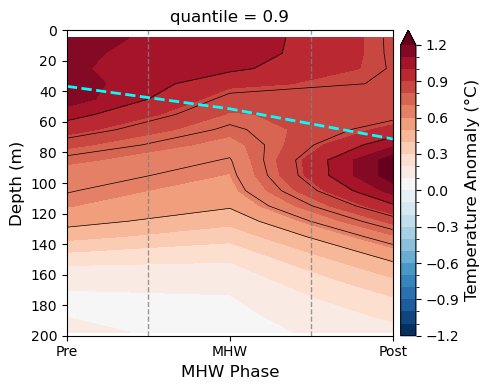

48.0
4


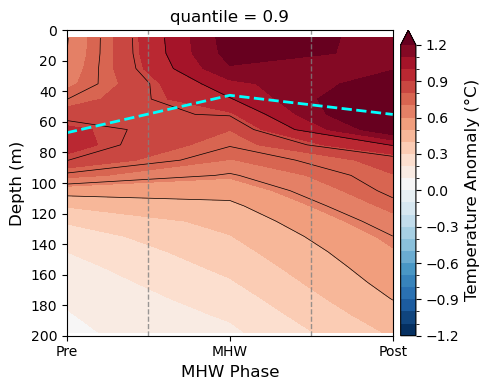

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens81.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens81.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens81.npy
82


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


1.0
4


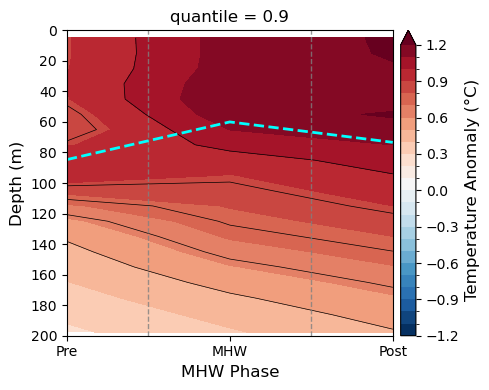

12.0
0


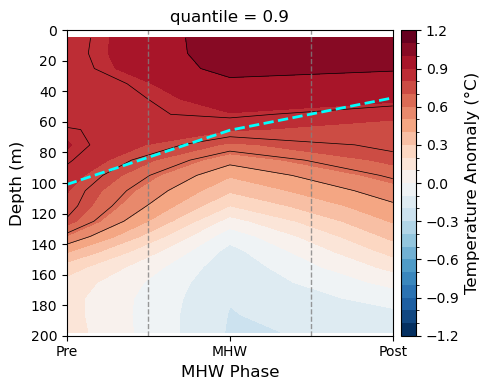

13.0
0


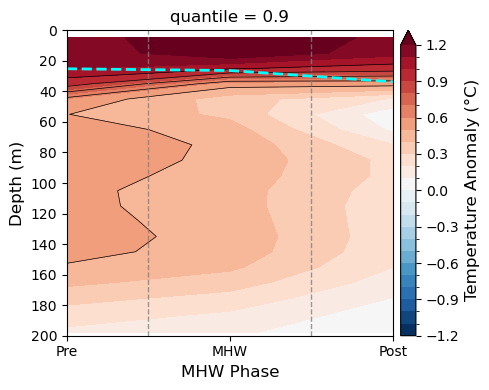

64.0
4


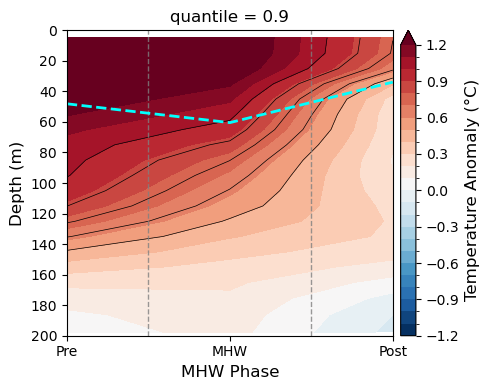

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens82.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens82.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens82.npy
83


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


4.0
9


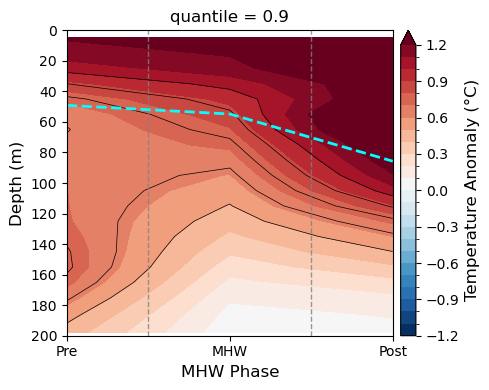

12.0
7


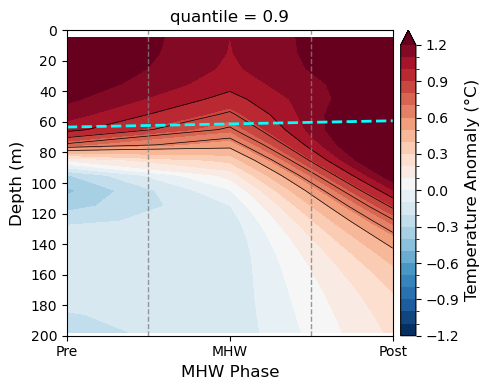

34.0
5


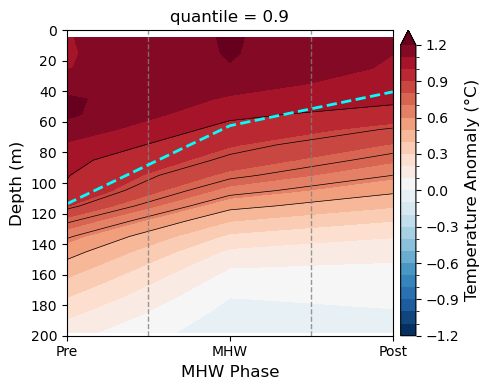

43.0
4


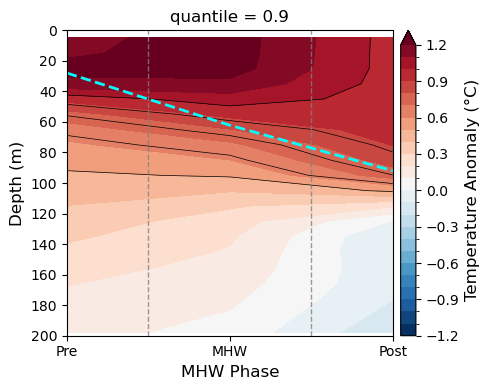

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens83.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens83.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens83.npy
84


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


1.0
0


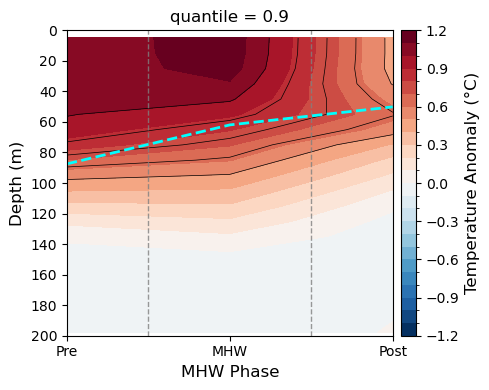

20.0
8


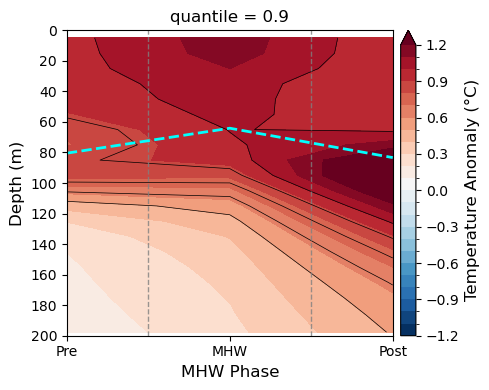

21.0
0


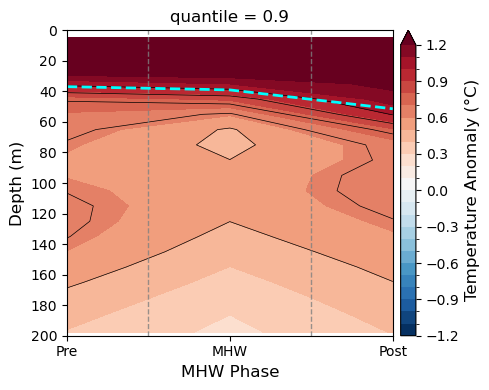

37.0
0


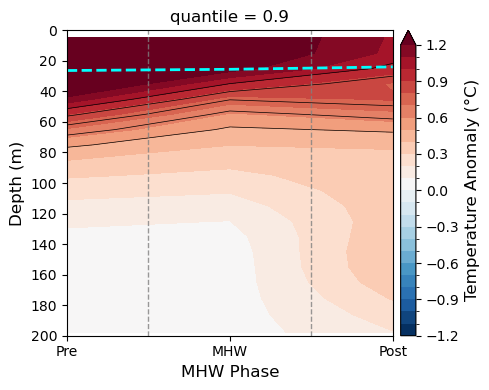

69.0
2


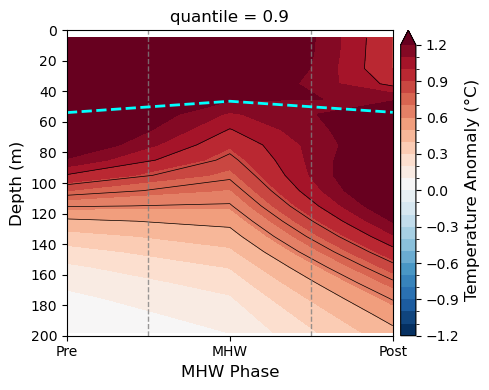

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens84.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens84.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens84.npy
85


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


2.0
6


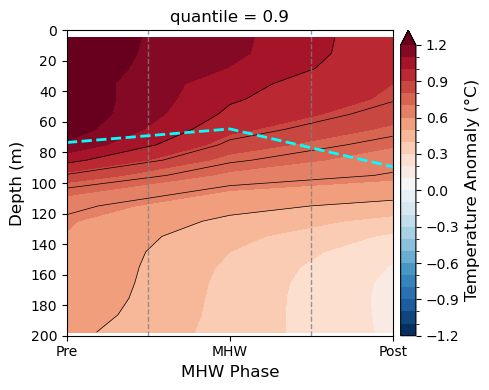

73.0
2


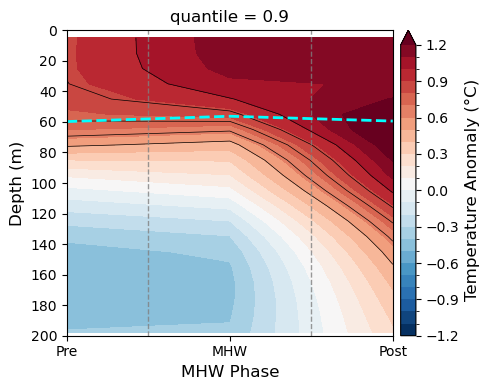

81.0
0


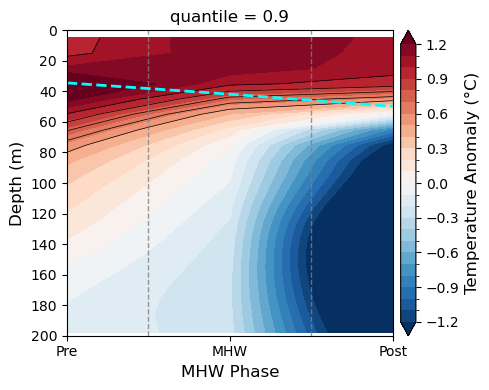

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens85.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens85.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens85.npy
86


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


9.0
0


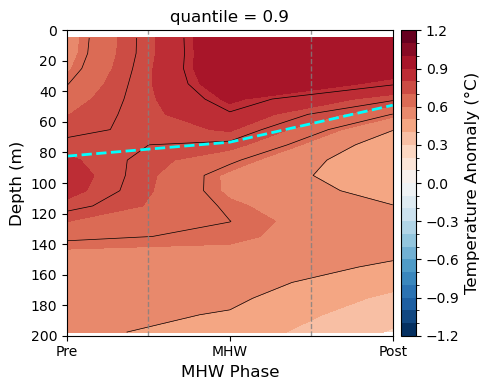

10.0
0


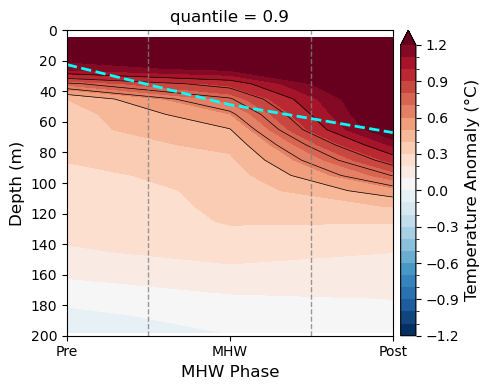

12.0
5


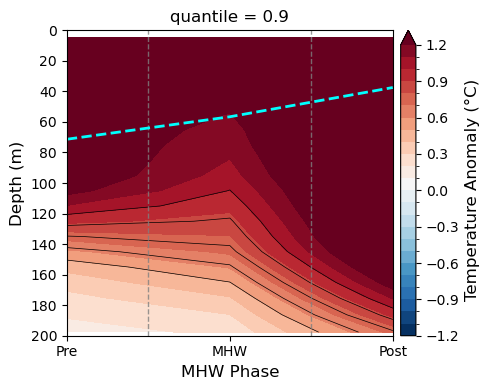

15.0
0


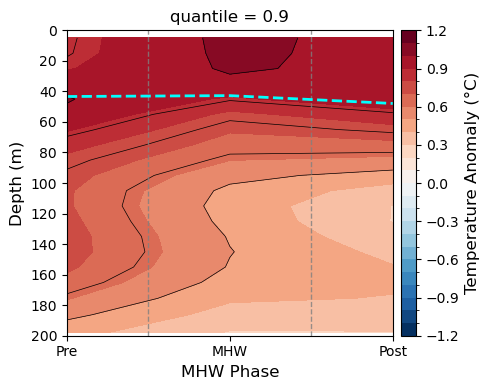

31.0
3


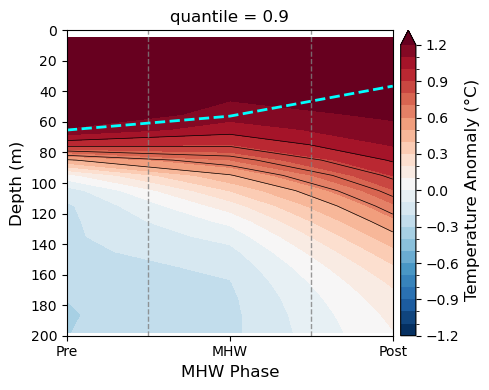

62.0
2


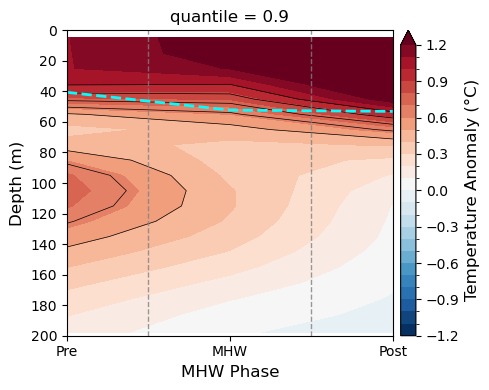

77.0
0


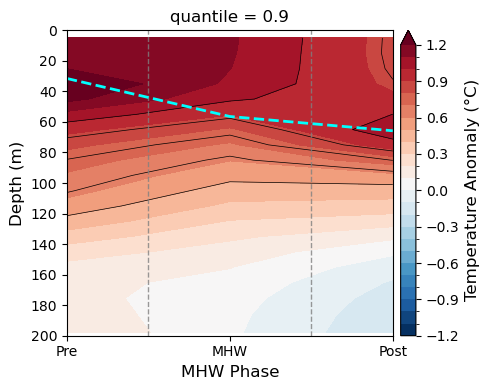

78.0
3


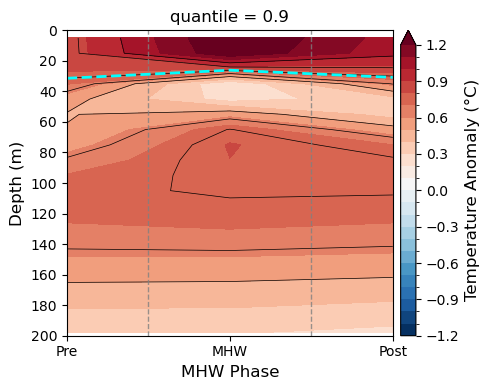

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens86.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens86.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens86.npy
87


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


20.0
3


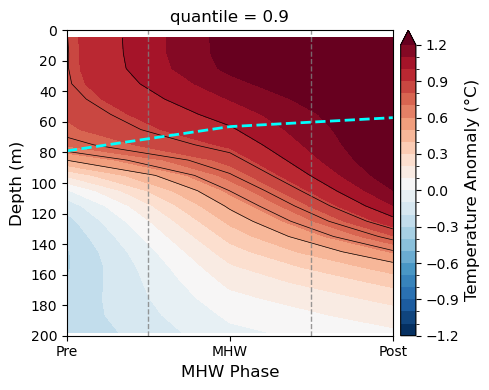

82.0
0


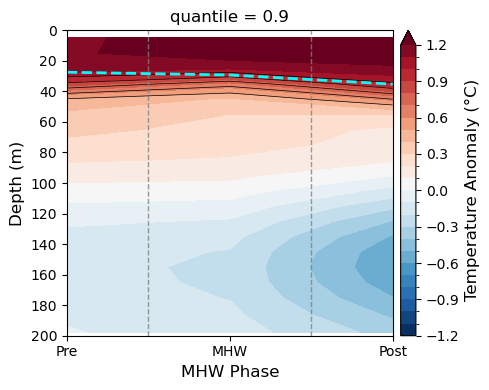

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens87.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens87.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens87.npy
88


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


1.0
9


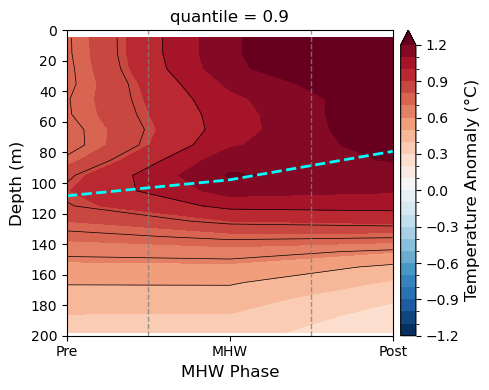

13.0
0


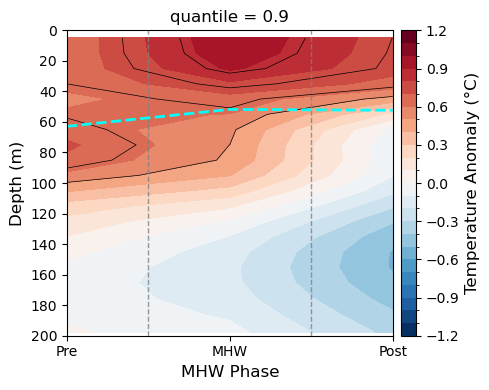

14.0
2


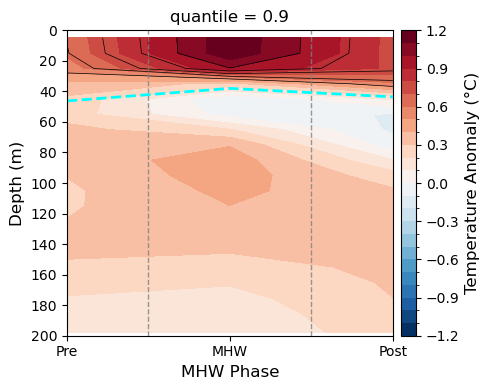

17.0
0


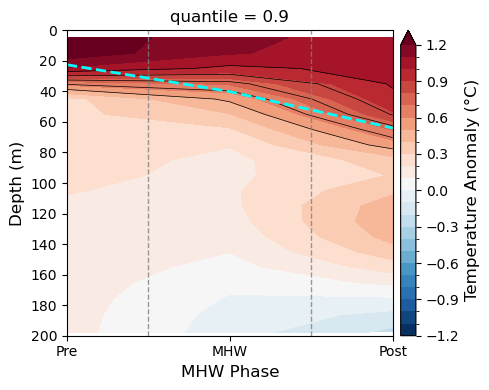

100.0
0


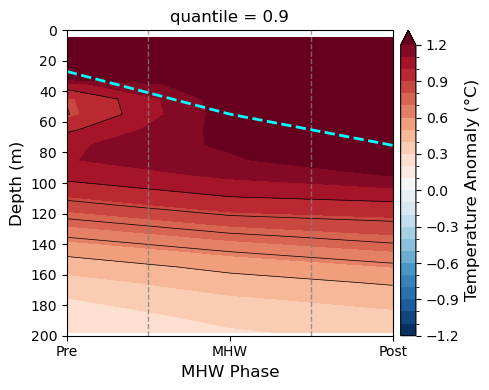

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens88.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens88.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens88.npy
89


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


67.0
7


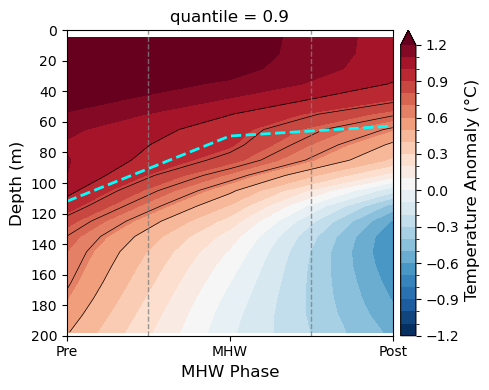

68.0
0


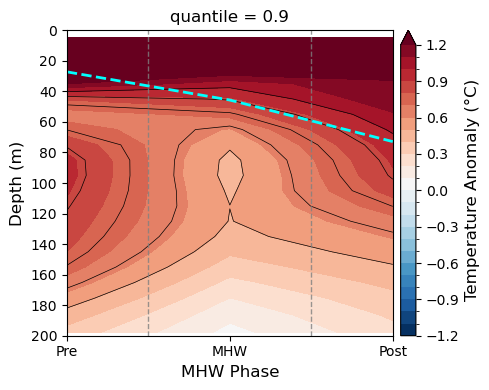

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens89.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens89.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens89.npy
90


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


3.0
0


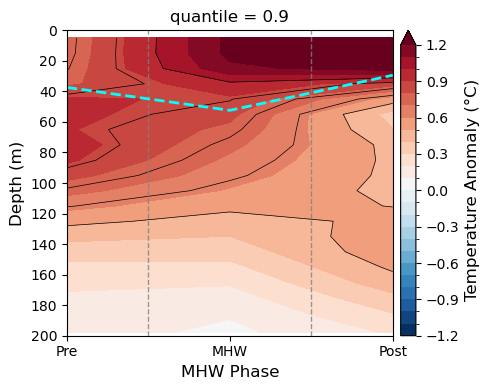

39.0
1


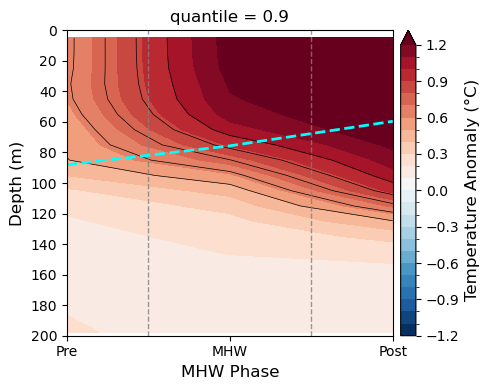

81.0
0


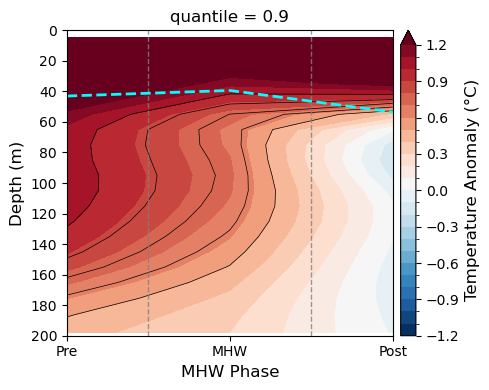

82.0
3


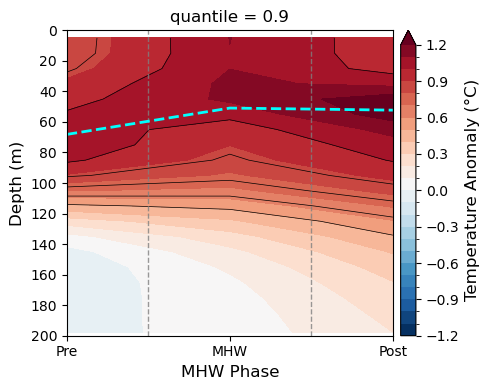

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens90.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens90.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens90.npy
91


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


9.0
0


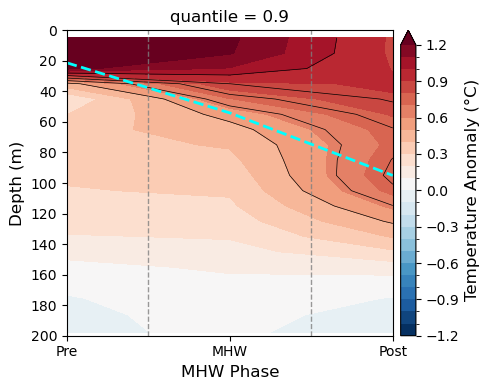

33.0
3


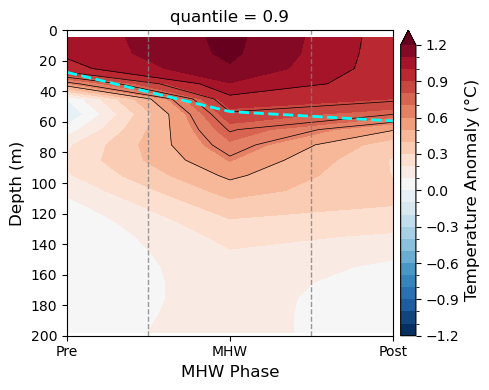

57.0
0


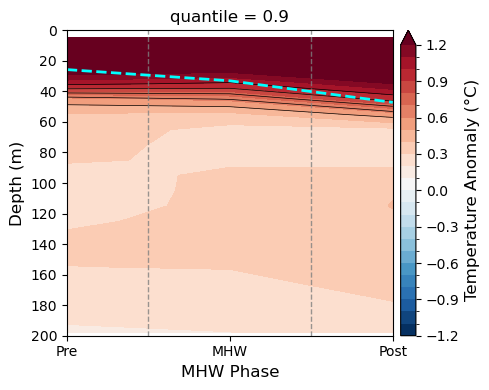

77.0
0


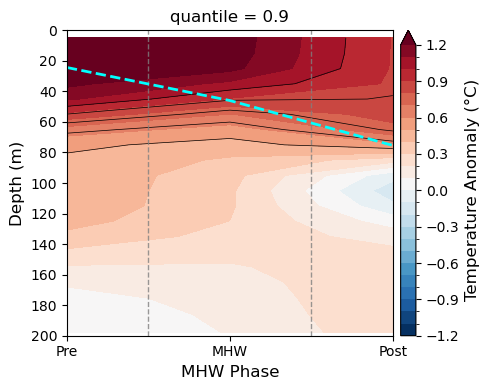

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens91.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens91.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens91.npy
92


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


20.0
0


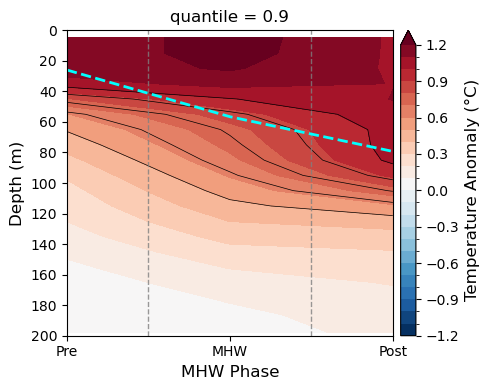

21.0
5


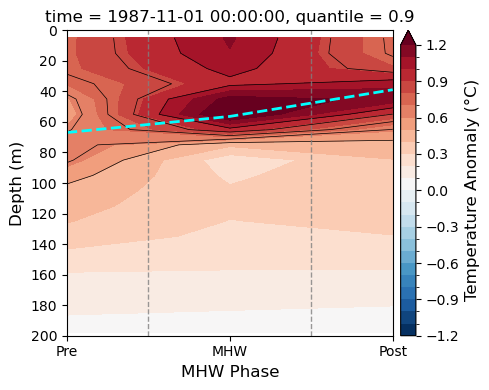

28.0
3


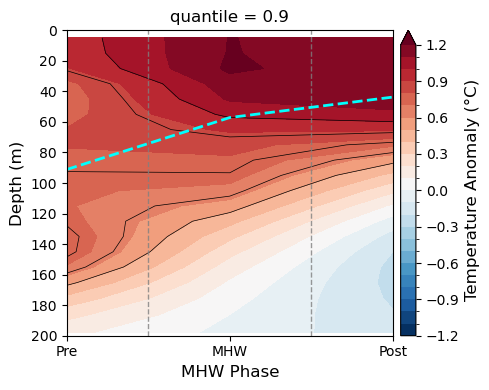

47.0
4


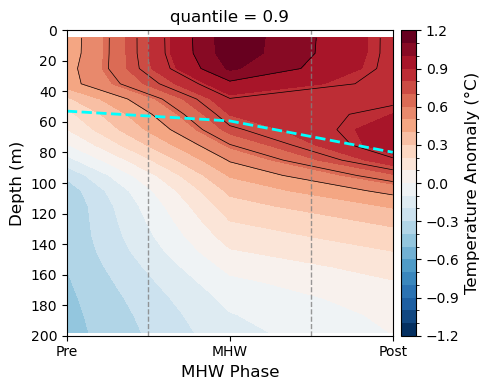

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens92.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens92.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens92.npy
93


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


9.0
6


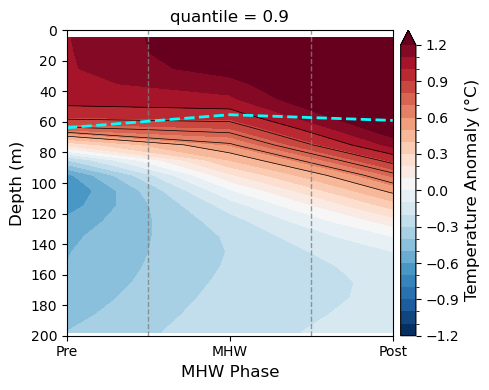

22.0
0


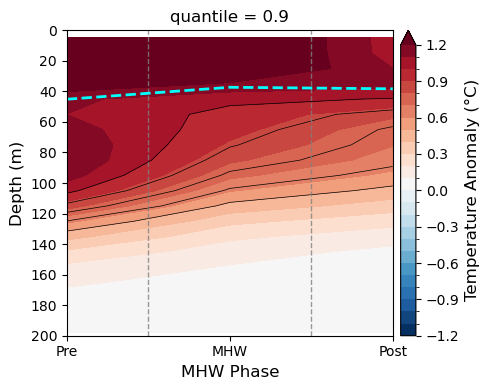

37.0
7


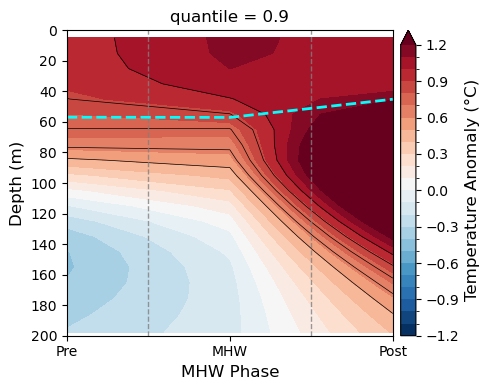

40.0
0


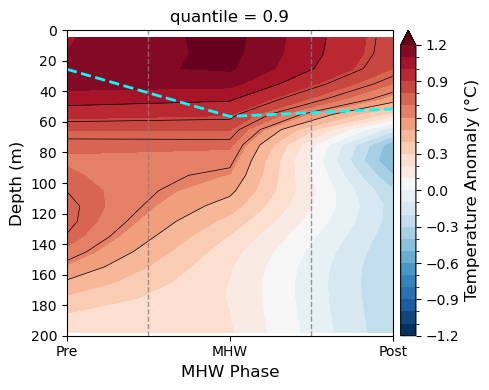

66.0
0


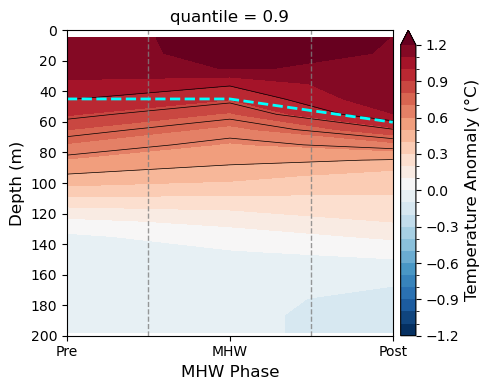

93.0
7


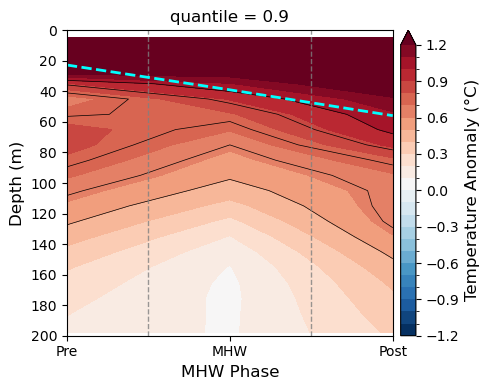

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens93.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens93.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens93.npy
94


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


42.0
5


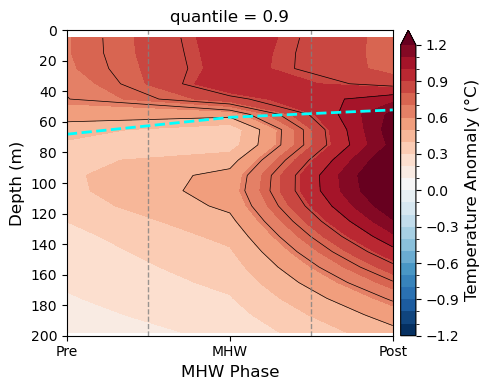

54.0
7


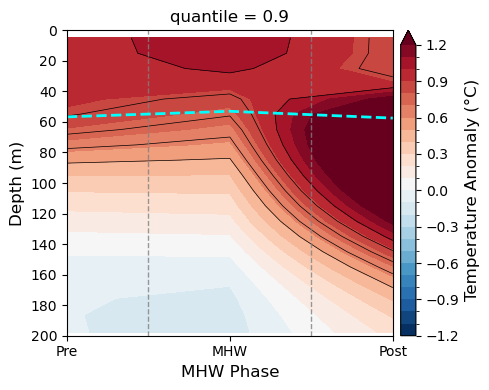

76.0
0


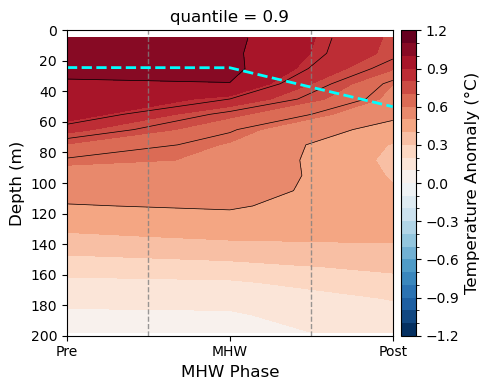

77.0
0


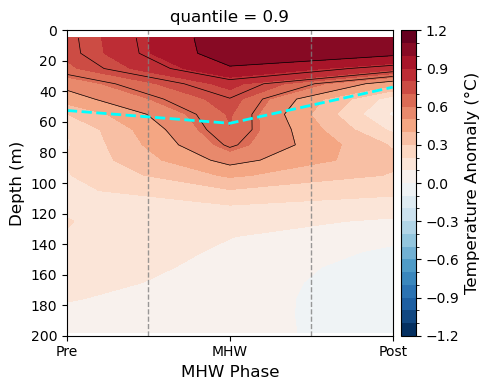

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens94.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens94.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens94.npy
95


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


29.0
0


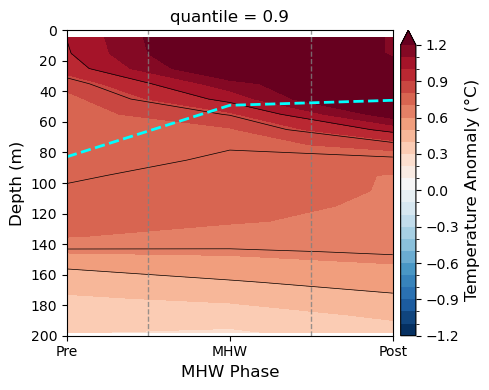

30.0
11


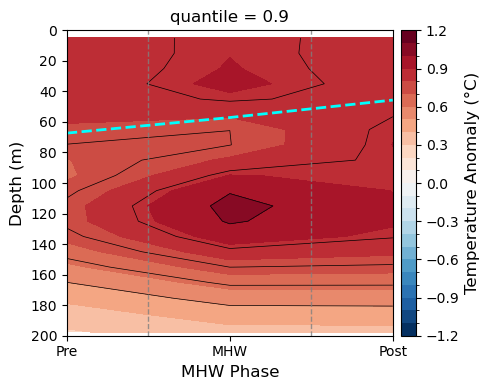

93.0
0


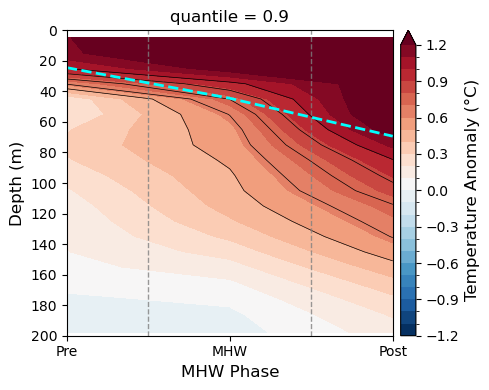

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens95.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens95.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens95.npy
96


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


26.0
4


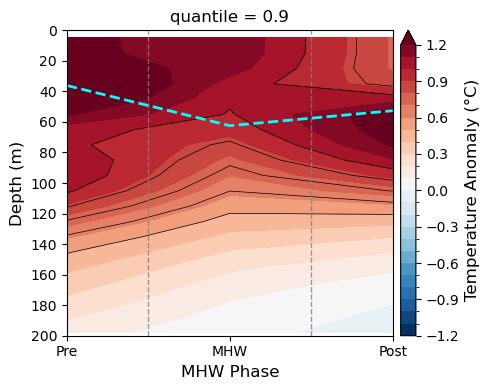

80.0
7


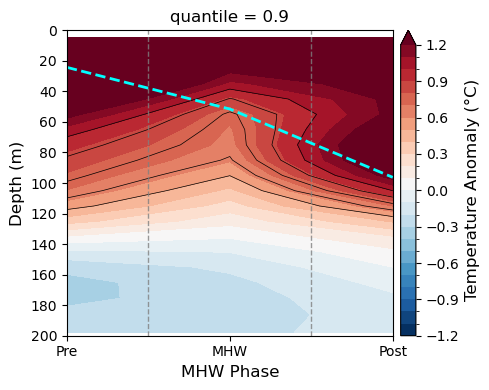

84.0
0


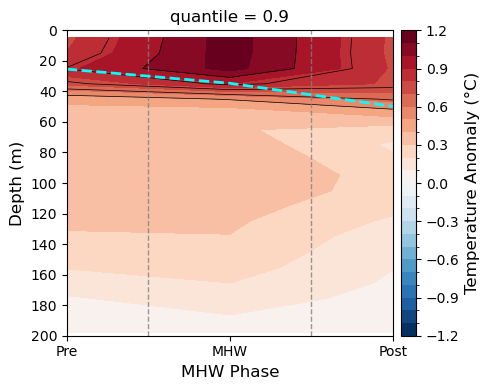

86.0
0


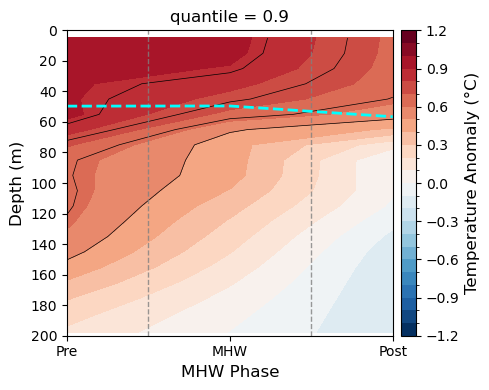

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens96.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens96.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens96.npy
97


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


29.0
0


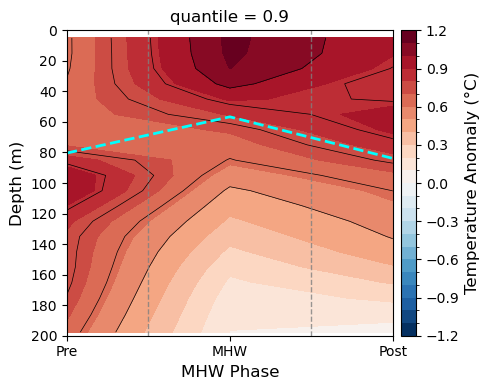

41.0
0


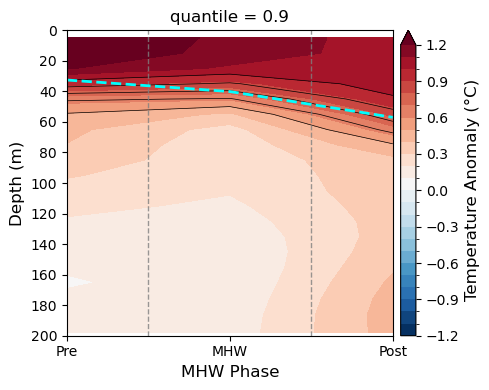

72.0
0


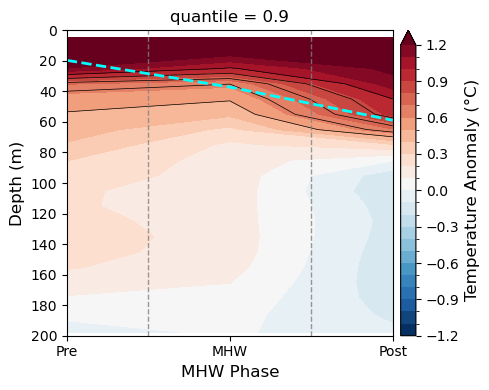

82.0
0


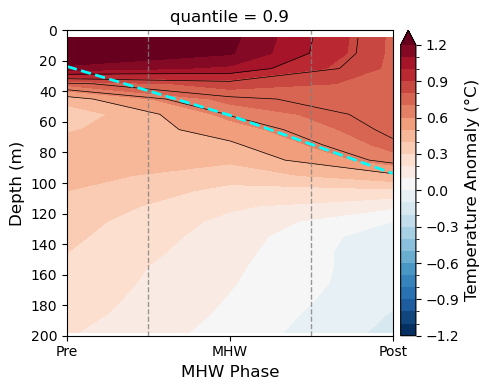

103.0
2


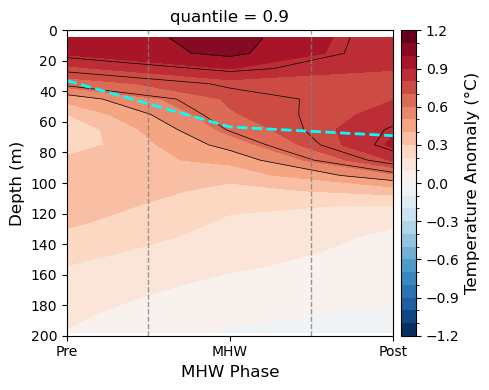

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens97.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens97.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens97.npy
98


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


24.0
8


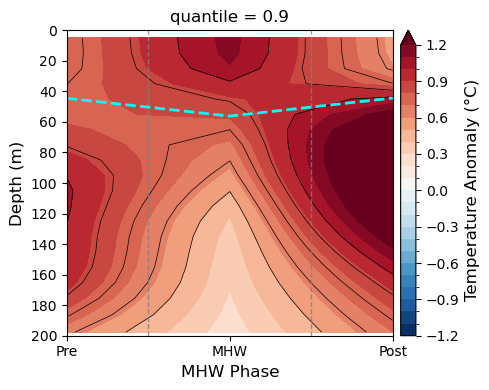

58.0
0


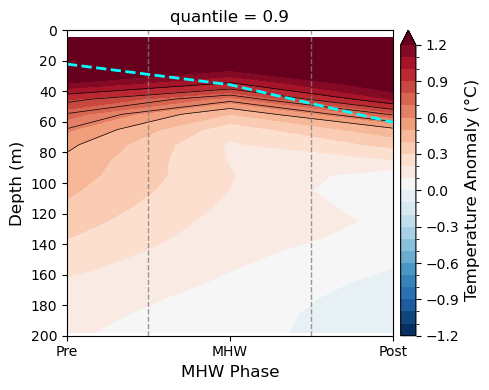

61.0
0


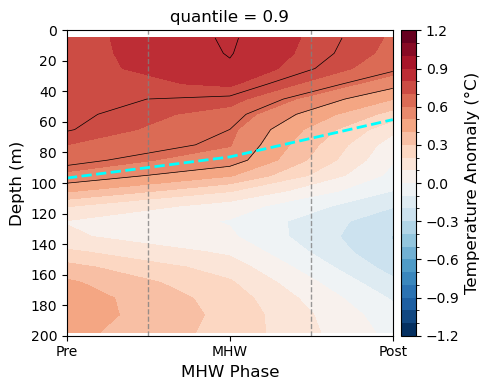

62.0
0


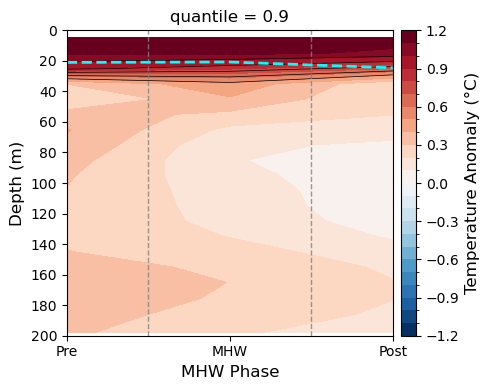

69.0
6


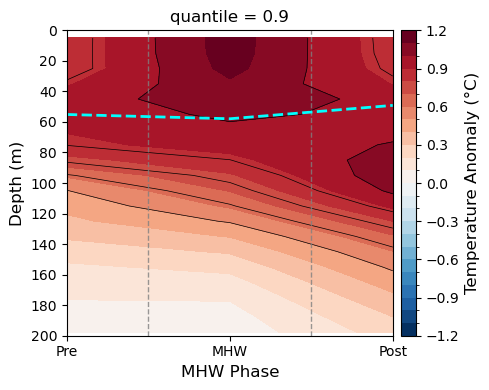

90.0
4


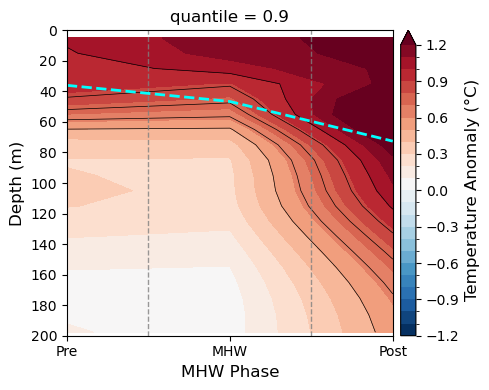

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens98.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens98.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens98.npy
99


/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1563: RuntimeWarning: All-NaN slice encountered
  return function_base._ureduce(a,


13.0
5


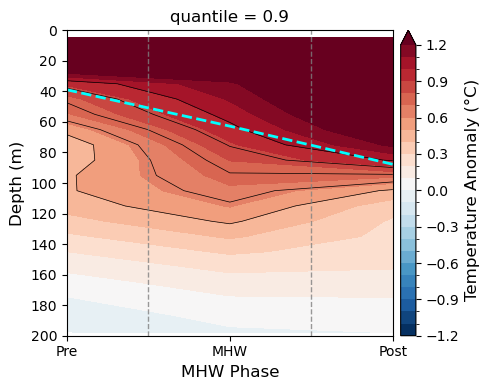

41.0
0


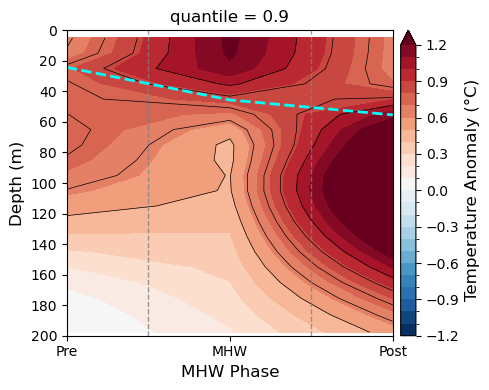

61.0
3


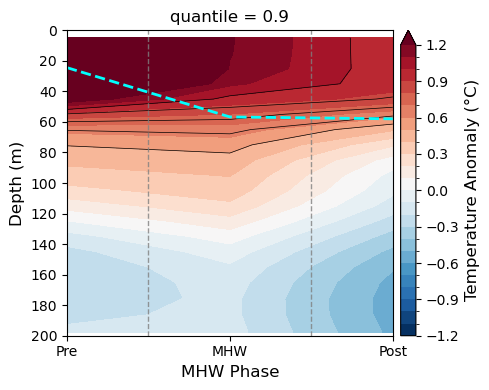

93.0
0


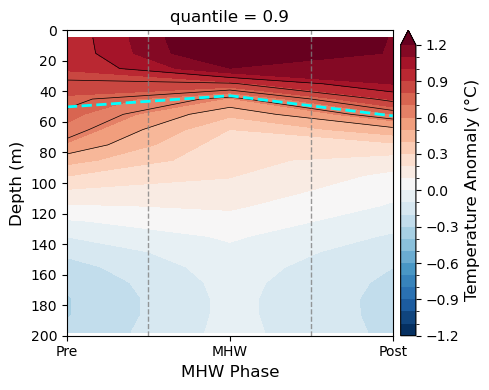

/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens99.nc
/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens99.npy
/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens99.npy


In [9]:
for ens_memb_index in range(52, 100):
    print(ens_memb_index)
    
    # TEMP ANOMALIES
    var = 'TEMP'
    comp = 'ocn'
    directory = f'/glade/campaign/cgd/cesm/CESM2-LE/{comp}/proc/tseries/month_1/{var}/'
    
    ds_var_hist_TEMP, ds_var_fut_TEMP = get_ds_var(directory, 'TEMP', comp, ens_memb_index) 
    CESMLENS_TEMP_hist_time_slice = ds_var_hist_TEMP.TEMP.isel(z_t=slice(0, 20)).sel(time=slice('1979-01-01', '2015-01-01'))#.isel(nlat=slice(200,350), nlon=slice(170, 251))
    CESMLENS_TEMP_fut_time_slice = ds_var_fut_TEMP.TEMP.isel(z_t=slice(0, 20)).sel(time=slice('2015-02-01', '2020-12-01'))#.isel(nlat=slice(200,350), nlon=slice(170, 251))
    CESMLENS_TEMP_ds = xr.concat([CESMLENS_TEMP_hist_time_slice, CESMLENS_TEMP_fut_time_slice], dim='time')
    
    deg1_wzeros_temp = regrid_SMYLE(CESMLENS_TEMP_ds)
    
    deg1_wzeros_temp_nan = deg1_wzeros_temp.where(deg1_wzeros_temp!=0, np.nan)
    regridder_temp = xe.Regridder(deg1_wzeros_temp_nan, CESMLENS_SST[:,:,:], 'nearest_s2d', periodic=True)
    regridded_temp = regridder_temp(deg1_wzeros_temp_nan)
    smaller_region_temp = regridded_temp.sel(lat = slice(12, 65), lon=slice(155, 245))
    smaller_region_temp = smaller_region_temp.compute()
    
    mean, trend, seas, features, anomalies = calculate_anomalies_trend_features_4d(smaller_region_temp)
    anomalies_region_nan = xr.where(anomalies == 0., np.nan, anomalies)

    # MLD
    var = 'HMXL'
    comp = 'ocn'
    directory = f'/glade/campaign/cgd/cesm/CESM2-LE/{comp}/proc/tseries/month_1/{var}/'
    
    ds_var_hist_MLD, ds_var_fut_MLD = get_ds_var(directory, var, comp, ens_memb_index) 
    CESMLENS_MLD_hist_time_slice = ds_var_hist_MLD.HMXL
    CESMLENS_MLD_fut_time_slice = ds_var_fut_MLD.HMXL
    CESMLENS_MLD_ds = xr.concat([CESMLENS_MLD_hist_time_slice, CESMLENS_MLD_fut_time_slice], dim='time')
    CESMLENS_MLD_ds_computed = CESMLENS_MLD_ds.compute()
    
    deg1_wzeros_mld = regrid_SMYLE(CESMLENS_MLD_ds_computed)
    
    deg1_wzeros_mld_nan = deg1_wzeros_mld.where(deg1_wzeros_mld!=0, np.nan)
    regridder_mld = xe.Regridder(deg1_wzeros_mld_nan, CESMLENS_SST[:,:,:], 'nearest_s2d', periodic=True)
    regridded_mld = regridder_mld(deg1_wzeros_mld_nan)
    smaller_region_mld = regridded_mld.sel(lat = slice(12, 65), lon=slice(155, 245))
    
    new_combined_ls = []
    mld_combined_ls = []
    max_temp_depth_ind_ls = []
    
    for mhw_ind in range(len(linr2_data[4][ens_memb_index])):
        mhw_ind_obj_id = linr2_data[4][ens_memb_index][mhw_ind]
        print(mhw_ind_obj_id)
    
        # get the MHW event
        blobs = da_mhwobj_labels.isel(ensemble_member = ens_memb_index)
        object_count_per_time = (blobs == mhw_ind_obj_id).sum(dim=['lat', 'lon'])
        true_time_steps = object_count_per_time.time.where(object_count_per_time > 0, drop=True)
        
        one_obj = blobs.sel(time=true_time_steps.time)
        blobs_nan = xr.where(one_obj == mhw_ind_obj_id, 1., 0.)
    
        temp_anomalies, new_combined, mld_combined = calc_vertical_temp_mld_structure(
            anomalies, blobs_nan, smaller_region_mld)

        max_temp_depth_ind = np.argmax((temp_anomalies[3:-3]).max(dim='time_ind').data)
        print(max_temp_depth_ind)
        
        # PLOTTING -------- START
        fig, ax = plt.subplots(figsize=(5, 4))
        contour = new_combined.plot.contour(
                ax=ax,
                yincrease=False,
                levels=np.linspace(0.5, 1, 5),
                cmap='k',
                linewidths=0.5
            )
        contour = new_combined.plot.contourf(
                ax=ax,
                yincrease=False,                # Depth increases downward
                cmap='RdBu_r',                  # Red-Blue diverging colormap
                robust=True,                    # Ignore outliers in color scaling
                levels=25, 
                vmin=-1.2, vmax=1.2,
                add_colorbar=False              # We'll add it manually later
            )
            
        cbar = plt.colorbar(contour, ax=ax, pad=0.02)
        cbar.set_label("Temperature Anomaly (°C)", fontsize=12)
        for x in [0.5, 1.5]:
            ax.axvline(x, color='grey', linestyle='--', linewidth=1., alpha=0.8)
        ax.set_xticks([0., 1., 2])
        ax.set_xticklabels(["Pre", "MHW", "Post"], fontsize=10)
        plt.tight_layout()
        plt.plot([0., 1., 2], mld_combined, c='cyan', linestyle='dashed', linewidth=2)
        # yticks = ax.get_yticks()
        # ax.set_yticks(yticks)
        # ax.set_yticklabels([f"{int(tick/100)}" for tick in yticks])
        ax.set_yticks([0, 20, 40, 60,80, 100, 120, 140, 160, 180, 200])
        ax.set_xlabel("MHW Phase", fontsize=12)
        ax.set_ylabel("Depth (m)", fontsize=12)
        plt.tight_layout()
        plt.show()
        # PLOTTING -------- END
        
        new_combined_ls.append(new_combined)
        mld_combined_ls.append(mld_combined)
        max_temp_depth_ind_ls.append(max_temp_depth_ind)
    
    new_combined_ls_new = []
    for i in range(len(new_combined_ls)):
        if 'time' in new_combined_ls[i].coords:
            new_combined_ls_new.append(new_combined_ls[i].drop_vars("time"))
        else:
            new_combined_ls_new.append(new_combined_ls[i])
            
    ds_temp_vert = xr.concat(new_combined_ls_new, dim='mhw_event_ind')
    filename = '/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens{}.nc'.format(ens_memb_index)
    ds_temp_vert.to_netcdf(filename)
    print(filename)
    
    filename = '/glade/derecho/scratch/cassiacai/mhwp2_max_temp_depth_combined_vert_ens{}.npy'.format(ens_memb_index)
    np.save(filename, max_temp_depth_ind_ls)
    print(filename)
    
    filename = '/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens{}.npy'.format(ens_memb_index)
    np.save(filename, mld_combined_ls)
    print(filename)

In [11]:
all_mean_mld_combined_ls = []
all_max_mld_combined_ls = []
for ens_memb_index in range(0, 100):
    print(ens_memb_index)

    # MLD
    var = 'HMXL'
    comp = 'ocn'
    directory = f'/glade/campaign/cgd/cesm/CESM2-LE/{comp}/proc/tseries/month_1/{var}/'
    
    ds_var_hist_MLD, ds_var_fut_MLD = get_ds_var(directory, var, comp, ens_memb_index) 
    CESMLENS_MLD_hist_time_slice = ds_var_hist_MLD.HMXL
    CESMLENS_MLD_fut_time_slice = ds_var_fut_MLD.HMXL
    CESMLENS_MLD_ds = xr.concat([CESMLENS_MLD_hist_time_slice, CESMLENS_MLD_fut_time_slice], dim='time')
    CESMLENS_MLD_ds_computed = CESMLENS_MLD_ds.compute()
    
    deg1_wzeros_mld = regrid_SMYLE(CESMLENS_MLD_ds_computed)
    
    deg1_wzeros_mld_nan = deg1_wzeros_mld.where(deg1_wzeros_mld!=0, np.nan)
    regridder_mld = xe.Regridder(deg1_wzeros_mld_nan, CESMLENS_SST[:,:,:], 'nearest_s2d', periodic=True)
    regridded_mld = regridder_mld(deg1_wzeros_mld_nan)
    smaller_region_mld = regridded_mld.sel(lat = slice(12, 65), lon=slice(155, 245))
    
    mean_mld_combined_ls = []
    max_mld_combined_ls = []
    
    for mhw_ind in range(len(linr2_data[4][ens_memb_index])):
        mhw_ind_obj_id = linr2_data[4][ens_memb_index][mhw_ind]
        print(mhw_ind_obj_id)
    
        # get the MHW event
        blobs = da_mhwobj_labels.isel(ensemble_member = ens_memb_index)
        object_count_per_time = (blobs == mhw_ind_obj_id).sum(dim=['lat', 'lon'])
        true_time_steps = object_count_per_time.time.where(object_count_per_time > 0, drop=True)
        
        one_obj = blobs.sel(time=true_time_steps.time)
        blobs_nan = xr.where(one_obj == mhw_ind_obj_id, 1., 0.)
    
        # temp_anomalies, new_combined, mld_combined = calc_vertical_temp_mld_structure(
        #     anomalies, blobs_nan, smaller_region_mld)
        event_mld = smaller_region_mld*blobs_nan
        event_mld_nan = xr.where(event_mld == 0., np.nan, event_mld)
        mean_mld_ls = event_mld_nan.mean(dim=('lat','lon')).data
        max_mld_ls = event_mld_nan.max(dim=('lat','lon')).data

        mean_mld_combined_ls.append(np.max(mean_mld_ls))
        max_mld_combined_ls.append(np.max(max_mld_ls))
    
    all_mean_mld_combined_ls.append(mean_mld_combined_ls)
    all_max_mld_combined_ls.append(max_mld_combined_ls)
    
filename = '/glade/derecho/scratch/cassiacai/mhwp2_time_mean_mld_combined_vert_ens_0_100.json'
with open(filename, 'w') as f:
    json.dump(all_mean_mld_combined_ls, f)

filename = '/glade/derecho/scratch/cassiacai/mhwp2_max_mld_combined_vert_ens_0_100.json'
with open(filename, 'w') as f:
    json.dump(all_max_mld_combined_ls, f)

0
28.0
37.0
38.0
43.0
58.0
85.0
1
49.0
75.0
76.0
2
56.0
57.0
59.0
66.0
69.0
80.0
3
5.0
15.0
16.0
47.0
67.0
4
4.0
34.0
50.0
88.0
98.0
5
3.0
36.0
57.0
69.0
74.0
6
47.0
72.0
7
13.0
42.0
55.0
89.0
8
44.0
73.0
87.0
9
38.0
66.0
74.0
10
3.0
4.0
41.0
47.0
11
49.0
62.0
12
11.0
13.0
28.0
74.0
94.0
13
38.0
54.0
14
58.0
73.0
74.0
81.0
15
23.0
49.0
51.0
61.0
16
26.0
68.0
94.0
17
26.0
54.0
85.0
18
17.0
28.0
69.0
19
59.0
71.0
74.0
75.0
20
12.0
22.0
56.0
57.0
21
21.0
52.0
68.0
76.0
22
51.0
54.0
57.0
58.0
76.0
23
17.0
19.0
71.0
78.0
24
44.0
54.0
56.0
25
20.0
30.0
50.0
55.0
56.0
26
39.0
55.0
59.0
63.0
66.0
67.0
27
57.0
80.0
83.0
90.0
91.0
99.0
28
8.0
10.0
49.0
50.0
51.0
65.0
70.0
71.0
29
1.0
54.0
55.0
62.0
30
2.0
21.0
102.0
31
1.0
85.0
32
22.0
23.0
40.0
41.0
47.0
80.0
81.0
83.0
33
1.0
2.0
35.0
34
19.0
35.0
43.0
62.0
78.0
35
39.0
45.0
79.0
93.0
36
11.0
37.0
59.0
69.0
37
38.0
39.0
64.0
38
8.0
58.0
66.0
83.0
85.0
39
3.0
104.0
105.0
40
53.0
99.0
41
67.0
68.0
101.0
42
45.0
61.0
71.0
72.0
80.0
91.0
43
2.0
72.

In [29]:
all_max_mld_combined_ls

[[9542.123046875,
  8325.611328125,
  4826.3564453125,
  10186.068359375,
  14915.74609375,
  7690.9658203125],
 [9772.3994140625, 20417.3125, 6121.11474609375],
 [12097.998046875,
  7228.7607421875,
  14407.119140625,
  13176.115234375,
  3697.051513671875,
  7578.31982421875],
 [12494.302734375,
  6776.9921875,
  6960.45458984375,
  13683.9013671875,
  13705.755859375],
 [13158.1337890625,
  16757.619140625,
  13223.3857421875,
  9589.365234375,
  8753.9443359375],
 [8635.4638671875,
  16333.9814453125,
  12609.55078125,
  12564.5546875,
  12568.3779296875],
 [16941.255859375, 8826.16796875],
 [5298.9580078125, 11966.076171875, 12979.7783203125, 7711.64892578125],
 [13564.7431640625, 5576.13623046875, 15911.2294921875],
 [16083.50390625, 12134.8447265625, 13238.7080078125],
 [12070.6943359375, 20329.66796875, 10964.568359375, 14610.15234375],
 [8723.6416015625, 13497.7421875],
 [13437.9443359375,
  21564.8984375,
  12941.888671875,
  10091.349609375,
  14277.794921875],
 [18362.35156

In [24]:
mean_mld_combined_ls

[array([2905.26565781, 2886.46954281, 2683.68277119, 2806.59427345]),
 array([2267.48695926, 2485.33113973, 2332.88390567, 2427.28641211,
        3438.88129657, 5109.76776487, 7367.666694  ]),
 array([3587.51911687, 3716.64486442]),
 array([5145.63973419, 2203.51760972, 2389.59059893, 2780.22620658,
        3915.11166033, 4278.54529989]),
 array([9604.99076488, 5949.32329849, 4581.29335093, 4070.81167427,
        3658.21465592, 3699.54927567, 3980.6539098 , 5055.22013381,
        5873.52483544, 8021.58659368, 8703.42148027, 8928.36060217,
        9178.313985  , 6932.05355151, 3116.53753669, 2869.6285163 ,
        3233.43707923, 2907.63731741, 3877.55071178, 5009.51520387]),
 array([2661.21780021, 2488.43440514, 2366.95261751, 2444.58306624,
        3534.82419081, 5131.909671  , 4440.28408203])]

In [22]:
mean_mld_combined_ls

[<xarray.DataArray (time: 4)> Size: 32B
 array([2905.26565781, 2886.46954281, 2683.68277119, 2806.59427345])
 Coordinates:
   * time      (time) object 32B 1991-06-01 00:00:00 ... 1991-09-01 00:00:00
     quantile  float64 8B 0.9,
 <xarray.DataArray (time: 7)> Size: 56B
 array([2267.48695926, 2485.33113973, 2332.88390567, 2427.28641211,
        3438.88129657, 5109.76776487, 7367.666694  ])
 Coordinates:
   * time      (time) object 56B 1994-06-01 00:00:00 ... 1994-12-01 00:00:00
     quantile  float64 8B 0.9,
 <xarray.DataArray (time: 2)> Size: 16B
 array([3587.51911687, 3716.64486442])
 Coordinates:
   * time      (time) object 16B 1994-09-01 00:00:00 1994-10-01 00:00:00
     quantile  float64 8B 0.9,
 <xarray.DataArray (time: 6)> Size: 48B
 array([5145.63973419, 2203.51760972, 2389.59059893, 2780.22620658,
        3915.11166033, 4278.54529989])
 Coordinates:
   * time      (time) object 48B 1997-05-01 00:00:00 ... 1997-10-01 00:00:00
     quantile  float64 8B 0.9,
 <xarray.DataArray 

In [ ]:
mean_mld_combined_ls

In [ ]:
event_mld = smaller_region_mld*blobs_nan

In [ ]:
event_mld_nan = xr.where(event_mld == 0., np.nan, event_mld)
mean_mld_ls = event_mld_nan.mean(dim=('lat','lon'))
max_mld_ls = event_mld_nan.max(dim=('lat','lon'))

In [ ]:
mld_combined_ls

In [ ]:
mld_combined_ls

## For one ensemble member and specific MHWs (scratch)

In [58]:
new_combined_ls = []
mld_combined_ls = []

for mhw_ind in range(len(linr2_data[4][ens_memb_index])):
    mhw_ind_obj_id = linr2_data[4][ens_memb_index][mhw_ind]
    print(mhw_ind_obj_id)

    # get the MHW event
    blobs = da_mhwobj_labels.isel(ensemble_member = ens_memb_index)
    object_count_per_time = (blobs == mhw_ind_obj_id).sum(dim=['lat', 'lon'])
    true_time_steps = object_count_per_time.time.where(object_count_per_time > 0, drop=True)
    
    one_obj = blobs.sel(time=true_time_steps.time)
    blobs_nan = xr.where(one_obj == mhw_ind_obj_id, 1., 0.)

    temp_anomalies, new_combined, mld_combined = calc_vertical_temp_mld_structure(
        anomalies, blobs_nan, smaller_region_mld)

    new_combined_ls.append(new_combined)
    mld_combined_ls.append(mld_combined)

# ds_temp_vert = xr.concat(new_combined_ls, dim='mhw_event_ind')
# filename = '/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens{}.npy'.format(ens_memb_index)
# ds_temp_vert.to_netcdf(filename)
# print(filename)

# filename = '/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens{}.npy'.format(ens_memb_index)
# np.save(filename, mld_combined_ls)
# print(filename)

28.0
37.0
38.0
43.0
58.0
85.0


In [81]:
# ds_temp_vert = xr.concat(new_combined_ls, dim='mhw_event_ind')
# filename = '/glade/derecho/scratch/cassiacai/mhwp2_temp_combined_vert_ens{}.nc'.format(ens_memb_index)
# ds_temp_vert.to_netcdf(filename)
# print(filename)

# filename = '/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens{}.npy'.format(ens_memb_index)
# np.save(filename, mld_combined_ls)
# print(filename)

/glade/derecho/scratch/cassiacai/mhwp2_mld_combined_vert_ens0.npy


In [64]:
mhw_ind = 7
mhw_ind_obj_id = linr2_data[4][ens_memb_index][mhw_ind]
print(mhw_ind_obj_id)

71.0


In [65]:
blobs = da_mhwobj_labels.isel(ensemble_member = ens_memb_index)
object_count_per_time = (blobs == mhw_ind_obj_id).sum(dim=['lat', 'lon'])
true_time_steps = object_count_per_time.time.where(object_count_per_time > 0, drop=True)

one_obj = blobs.sel(time=true_time_steps.time)
blobs_nan = xr.where(one_obj == mhw_ind_obj_id, 1., 0.)

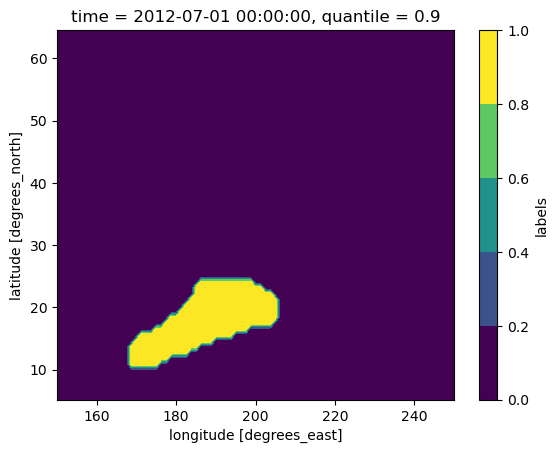

In [66]:
blobs_nan[0,:,:].plot.contourf()

In [67]:
# ssta = da_ssta.isel(ensemble_member = ens_memb_index).compute()
# ssta_one_obj = ssta*blobs_nan
# ssta_one_obj_nan = xr.where(ssta_one_obj == 0., np.nan, ssta_one_obj)
# max_ssta_tp = np.argmax(ssta_one_obj_nan.mean(dim=('lat','lon')).data)

In [68]:
anomalies_depth = []
mld_depth = []
for i in [-3, -2, -1]:
    time_index = 0
    tmin1_anomalies = anomalies.shift(time=i).sel(time=blobs_nan.time[time_index].item())* blobs_nan[0]
    anomalies_in_region_nan = xr.where(tmin1_anomalies == 0., np.nan, tmin1_anomalies)
    anomalies_depth.append(anomalies_in_region_nan.mean(dim=('lat','lon')))
    
    mld_sel = smaller_region_mld.shift(time=i).sel(time=blobs_nan.time[time_index].item())* blobs_nan[0]
    mld_val = xr.where(mld_sel == 0., np.nan, mld_sel).mean()/100
    mld_depth.append(mld_val.item())
    
for time_index in range(len(true_time_steps)):
    anomalies_in_region = anomalies.sel(time=blobs_nan.time[time_index].item()) * blobs_nan[time_index]
    anomalies_in_region_nan = xr.where(anomalies_in_region == 0., np.nan, anomalies_in_region)
    anomalies_depth.append(anomalies_in_region_nan.mean(dim=('lat','lon')))
    mld_sel = smaller_region_mld.shift(time=i).sel(time=blobs_nan.time[time_index].item())* blobs_nan[time_index]
    mld_val = xr.where(mld_sel == 0., np.nan, mld_sel).mean()/100
    mld_depth.append(mld_val.item())
    
for i in [1, 2, 3]:
    time_index = len(blobs_nan.time)-1
    tmin1_anomalies = anomalies.shift(time=i).sel(time=blobs_nan.time[time_index].item())* blobs_nan[time_index]
    anomalies_in_region_nan = xr.where(tmin1_anomalies == 0., np.nan, tmin1_anomalies)
    anomalies_depth.append(anomalies_in_region_nan.mean(dim=('lat','lon')))
    mld_sel = smaller_region_mld.shift(time=i).sel(time=blobs_nan.time[time_index].item())* blobs_nan[time_index]
    mld_val = xr.where(mld_sel == 0., np.nan, mld_sel).mean()/100
    mld_depth.append(mld_val.item())

In [28]:
temp_anomalies = xr.concat(anomalies_depth, dim='time_ind')

pre_phase = temp_anomalies.isel(
    time_ind=slice(0, 3)).mean(dim='time_ind')

post_phase = temp_anomalies.sel(
    time_ind=slice(-4, -1)).mean(dim='time_ind')

if len(temp_anomalies.time_ind.data) == 7:
    mid_phase = temp_anomalies.isel(
         time_ind=3)#.mean(dim='time_ind')
else: 
    mid_phase = temp_anomalies.sel(
        time_ind=slice(3, -4)).mean(dim='time_ind')
    
combined = xr.concat(
    [pre_phase, mid_phase, post_phase], 
    dim=xr.DataArray(["pre", "mid", "post"], 
                     dims="phase"))

new_combined = combined[:,:].transpose()
new_combined["z_t"] = new_combined["z_t"] / 100
new_combined["z_t"].attrs["units"] = "m"

In [29]:
mld_depth_array = np.array(mld_depth)
pre_phase_mld = mld_depth_array[0:3].mean()
post_phase_mld = mld_depth_array[-4:-1].mean()

if len(temp_anomalies.time_ind.data) == 7:
    mid_mld = mld_depth_array[3]
    
else: 
    mid_mld = mld_depth_array[3: -4].mean()
    
mld_combined = [pre_phase_mld, mid_mld, post_phase_mld]

/glade/derecho/scratch/cassiacai/tmp/ipykernel_42563/3588958615.py:4: RuntimeWarning: Mean of empty slice.
  mid_mld = mld_depth_array[3: -4].mean()
/glade/u/apps/opt/conda/envs/npl-2025a/lib/python3.12/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


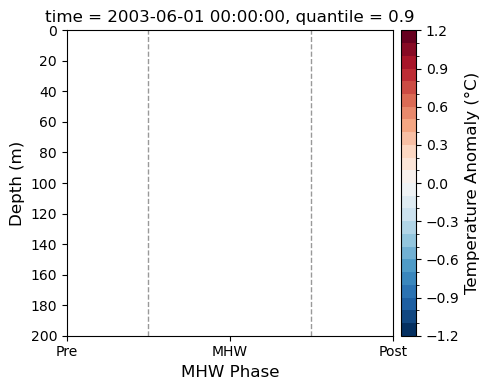

In [30]:
fig, ax = plt.subplots(figsize=(5, 4))
contour = new_combined.plot.contour(
        ax=ax,
        yincrease=False,
        levels=np.linspace(0.5, 1, 5),
        cmap='k',
        linewidths=0.5
    )
contour = new_combined.plot.contourf(
        ax=ax,
        yincrease=False,                # Depth increases downward
        cmap='RdBu_r',                  # Red-Blue diverging colormap
        robust=True,                    # Ignore outliers in color scaling
        levels=25, 
        vmin=-1.2, vmax=1.2,
        add_colorbar=False              # We'll add it manually later
    )
    
cbar = plt.colorbar(contour, ax=ax, pad=0.02)
cbar.set_label("Temperature Anomaly (°C)", fontsize=12)
for x in [0.5, 1.5]:
    ax.axvline(x, color='grey', linestyle='--', linewidth=1., alpha=0.8)
ax.set_xticks([0., 1., 2])
ax.set_xticklabels(["Pre", "MHW", "Post"], fontsize=10)
plt.tight_layout()
plt.plot([0., 1., 2], mld_combined, c='cyan', linestyle='dashed', linewidth=2)
# yticks = ax.get_yticks()
# ax.set_yticks(yticks)
# ax.set_yticklabels([f"{int(tick/100)}" for tick in yticks])
ax.set_yticks([0, 20, 40, 60,80, 100, 120, 140, 160, 180, 200])
ax.set_xlabel("MHW Phase", fontsize=12)
ax.set_ylabel("Depth (m)", fontsize=12)
plt.tight_layout()
plt.show()

In [ ]:
def calc_vertical_temp_mld_structure(anomalies, blobs_nan, smaller_region_mld):
    anomalies_depth = []
    mld_depth = []
    for i in [-2, -1]:
        time_index = 0
        tmin1_anomalies = anomalies.shift(time=i).sel(time=blobs_nan.time[time_index].item())* blobs_nan[0]
        anomalies_in_region_nan = xr.where(tmin1_anomalies == 0., np.nan, tmin1_anomalies)
        anomalies_depth.append(anomalies_in_region_nan.mean(dim=('lat','lon')))
        
        mld_sel = smaller_region_mld.shift(time=i).sel(time=blobs_nan.time[time_index].item())* blobs_nan[0]
        mld_val = xr.where(mld_sel == 0., np.nan, mld_sel).mean()/100
        mld_depth.append(mld_val.item())
        
    for time_index in range(len(true_time_steps)):
        anomalies_in_region = anomalies.sel(time=blobs_nan.time[time_index].item()) * blobs_nan[time_index]
        anomalies_in_region_nan = xr.where(anomalies_in_region == 0., np.nan, anomalies_in_region)
        anomalies_depth.append(anomalies_in_region_nan.mean(dim=('lat','lon')))
        mld_sel = smaller_region_mld.shift(time=i).sel(time=blobs_nan.time[time_index].item())* blobs_nan[time_index]
        mld_val = xr.where(mld_sel == 0., np.nan, mld_sel).mean()/100
        mld_depth.append(mld_val.item())
        
    for i in [1, 2]:
        time_index = len(blobs_nan.time)-1
        tmin1_anomalies = anomalies.shift(time=i).sel(time=blobs_nan.time[time_index].item())* blobs_nan[time_index]
        anomalies_in_region_nan = xr.where(tmin1_anomalies == 0., np.nan, tmin1_anomalies)
        anomalies_depth.append(anomalies_in_region_nan.mean(dim=('lat','lon')))
        mld_sel = smaller_region_mld.shift(time=i).sel(time=blobs_nan.time[time_index].item())* blobs_nan[time_index]
        mld_val = xr.where(mld_sel == 0., np.nan, mld_sel).mean()/100
        mld_depth.append(mld_val.item())

    temp_anomalies = xr.concat(anomalies_depth, dim='time_ind')
    return mld_depth

    return temp_anomalies, new_combined, mld_combined

In [ ]:
def calc_vertical_temp_mld_structure(anomalies, blobs_nan, smaller_region_mld):
    anomalies_depth = []
    mld_depth = []
    for i in [-3, -2, -1]:
        time_index = 0
        tmin1_anomalies = anomalies.shift(time=i).sel(time=blobs_nan.time[time_index].item())* blobs_nan[0]
        anomalies_in_region_nan = xr.where(tmin1_anomalies == 0., np.nan, tmin1_anomalies)
        anomalies_depth.append(anomalies_in_region_nan.mean(dim=('lat','lon')))
        
        mld_sel = smaller_region_mld.shift(time=i).sel(time=blobs_nan.time[time_index].item())* blobs_nan[0]
        mld_val = xr.where(mld_sel == 0., np.nan, mld_sel).mean()/100
        mld_depth.append(mld_val.item())
        
    for time_index in range(len(true_time_steps)):
        anomalies_in_region = anomalies.sel(time=blobs_nan.time[time_index].item()) * blobs_nan[time_index]
        anomalies_in_region_nan = xr.where(anomalies_in_region == 0., np.nan, anomalies_in_region)
        anomalies_depth.append(anomalies_in_region_nan.mean(dim=('lat','lon')))
        mld_sel = smaller_region_mld.shift(time=i).sel(time=blobs_nan.time[time_index].item())* blobs_nan[time_index]
        mld_val = xr.where(mld_sel == 0., np.nan, mld_sel).mean()/100
        mld_depth.append(mld_val.item())
        
    for i in [1, 2, 3]:
        time_index = len(blobs_nan.time)-1
        tmin1_anomalies = anomalies.shift(time=i).sel(time=blobs_nan.time[time_index].item())* blobs_nan[time_index]
        anomalies_in_region_nan = xr.where(tmin1_anomalies == 0., np.nan, tmin1_anomalies)
        anomalies_depth.append(anomalies_in_region_nan.mean(dim=('lat','lon')))
        mld_sel = smaller_region_mld.shift(time=i).sel(time=blobs_nan.time[time_index].item())* blobs_nan[time_index]
        mld_val = xr.where(mld_sel == 0., np.nan, mld_sel).mean()/100
        mld_depth.append(mld_val.item())

    temp_anomalies = xr.concat(anomalies_depth, dim='time_ind')
    return mld_depth

    return temp_anomalies, new_combined, mld_combined

In [ ]:
max 3
len > 10
Look only at long MHWs

In [ ]:
4 months are longer
save temp_anomalies actually

In [ ]:
if mld_depth len is 7 then skip
if mld_depth is 8 then max

In [15]:
for ens_memb_index in range(0, 1):
    print(ens_memb_index)

    # MLD
    var = 'HMXL'
    comp = 'ocn'
    directory = f'/glade/campaign/cgd/cesm/CESM2-LE/{comp}/proc/tseries/month_1/{var}/'
    
    ds_var_hist_MLD, ds_var_fut_MLD = get_ds_var(directory, var, comp, ens_memb_index) 
    CESMLENS_MLD_hist_time_slice = ds_var_hist_MLD.HMXL
    CESMLENS_MLD_fut_time_slice = ds_var_fut_MLD.HMXL
    CESMLENS_MLD_ds = xr.concat([CESMLENS_MLD_hist_time_slice, CESMLENS_MLD_fut_time_slice], dim='time')
    CESMLENS_MLD_ds_computed = CESMLENS_MLD_ds.compute()
    
    deg1_wzeros_mld = regrid_SMYLE(CESMLENS_MLD_ds_computed)
    
    deg1_wzeros_mld_nan = deg1_wzeros_mld.where(deg1_wzeros_mld!=0, np.nan)
    regridder_mld = xe.Regridder(deg1_wzeros_mld_nan, CESMLENS_SST[:,:,:], 'nearest_s2d', periodic=True)
    regridded_mld = regridder_mld(deg1_wzeros_mld_nan)
    smaller_region_mld = regridded_mld.sel(lat = slice(12, 65), lon=slice(155, 245))
    
    new_combined_ls = []
    mld_combined_ls = []
    max_temp_depth_ind_ls = []
    
    for mhw_ind in range(len(linr2_data[4][ens_memb_index])):
        mhw_ind_obj_id = linr2_data[4][ens_memb_index][mhw_ind]
        print(mhw_ind_obj_id)
    
        # get the MHW event
        blobs = da_mhwobj_labels.isel(ensemble_member = ens_memb_index)
        object_count_per_time = (blobs == mhw_ind_obj_id).sum(dim=['lat', 'lon'])
        true_time_steps = object_count_per_time.time.where(object_count_per_time > 0, drop=True)
        
        one_obj = blobs.sel(time=true_time_steps.time)
        blobs_nan = xr.where(one_obj == mhw_ind_obj_id, 1., 0.)

        # mld_combined_ls.append(mld_combined)

    # filename = '/glade/derecho/scratch/cassiacai/mhwp2_max_mld_combined_vert_ens{}.npy'.format(ens_memb_index)
    # np.save(filename, mld_combined_ls)
    # print(filename)

0
28.0


NameError: name 'mld_combined' is not defined

In [ ]:
smaller_region_mld

In [18]:
mld_mean = blobs_nan*smaller_region_mld.mean(dim=['lat', 'lon'])

<xarray.DataArray (time: 4, lat: 64, lon: 81)> Size: 166kB
array([[[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]],

       [[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]])
Coordinates:
  * lat       (lat) float64 512B 5.183 6.126 7.068 8.01 ... 62.67 63.61 64.55
  * lon       (lon) float64 648B 150.0 151.2 152.5 153.8 ... 247.5 248.8 250.0
  * time      (time) object 32B 1991-06-01 00:00:00 ... 1991-09-01 00:00:00
    quantile  float64 8B 0.9